In [36]:
import gc
import os
import sys
import time
import math
import torch.nn as nn

import pandas as pd
import torch
from PIL import Image
from torch import optim
from torch.optim.lr_scheduler import ExponentialLR, StepLR
from torchvision import transforms
import re
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
import warnings
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import torch.nn.functional as F
from collections import defaultdict
from itertools import product


warnings.filterwarnings("ignore", category=UserWarning)  # Disable UserWarnings
tqdm.pandas()

In [37]:
train_df = pd.read_csv("./dataset/train.csv")
test_df = pd.read_csv("./dataset/test.csv")
validation_df = pd.read_csv("./dataset/val.csv")

In [38]:
import text_preprocessing
train_df['preprocessed_text'] = train_df['caption'].progress_apply(text_preprocessing.text_preparetion_simple)
validation_df['preprocessed_text'] = validation_df['caption'].progress_apply(text_preprocessing.text_preparetion_simple)
test_df['preprocessed_text'] = test_df['caption'].progress_apply(text_preprocessing.text_preparetion_simple)

100%|██████████| 2000/2000 [00:00<00:00, 439815.87it/s]


In [39]:
train_df

,id,caption,image_id,label,preprocessed_text
0,417812c5-0ce4-499d-b97d-4d28827239bc,Wet elephants shake water onto people bathing ...,394330,0,wet elephants shake water onto people bathing ...
1,5ac91fa3-55f2-4cb3-8c8f-ad84f78e6b36,Two men holding tennis racquets on the court,130849,0,two men holding tennis racquets on the court
2,d2705b90-8347-4cab-a7a6-654540d9a489,A bird on a tree limb with mountains in the ba...,514790,0,a bird on a tree limb with mountains in the ba...
3,a3b33fe7-3085-4433-9c18-8814803891b4,A kitchen and dining room are featured along w...,182096,0,a kitchen and dining room are featured along w...
4,1514b0e4-0665-45bc-ab32-52fce326cc29,A fruit stand has various fruits on the table.,68788,1,a fruit stand has various fruits on the table
...,...,...,...,...,...
9995,1d1df243-485d-4b29-82c8-7e34c0de1f5c,Several people stand in a field flying a kite.,522702,0,several people stand in a field flying a kite
9996,f7dfa883-e524-4974-b5ba-6b3c3db49087,A batter hitting a pitch at a baseball game.,441874,1,a batter hitting a pitch at a baseball game
9997,602e83dc-6539-4c1a-8d19-c1481b5c24bf,A person on white surfboard next to group in a...,166716,0,a person on white surfboard next to group in a...
9998,d9ce2e8c-0831-466a-8756-4c40d772b1ce,A baseball player getting ready to swing at th...,517601,0,a baseball player getting ready to swing at th...


In [40]:
def build_simple_vocab(sentences, special_tokens=None):
    """
    Manually create a vocabulary from a list of tokenized sentences.
    
    Args:
        sentences (list of str): List of sentences to build vocabulary from.
        special_tokens (list of str): Special tokens like <pad>, <unk>.
        
    Returns:
        dict: A vocabulary mapping tokens to indices.
        dict: An inverse vocabulary mapping indices to tokens.
    """
    special_tokens = special_tokens or ['<pad>', '<unk>']
    vocab = defaultdict(lambda: len(vocab))  # Default index is the current vocab size
    for token in special_tokens:
        vocab[token]  # Add special tokens first
    
    # Add tokens from sentences
    for sentence in sentences:
        for token in sentence.split():
            if token.strip():  # Exclude empty tokens
                vocab[token]
    
    # Convert to a normal dict (no longer dynamic)
    vocab = dict(vocab)
    inverse_vocab = {index: token for token, index in vocab.items()}
    return vocab, inverse_vocab


# Vectorize a sentence
def vectorize_sentence(sentence, vocab):
    """
    Converts a sentence into a tensor of token indices using a given vocabulary,
    ignoring empty tokens.
    
    Args:
        sentence (str): Input sentence.
        vocab (Vocab): Vocabulary to map tokens to indices.
        
    Returns:
        torch.Tensor: Vectorized sentence as a tensor.
    """
    # Ensure '<unk>' exists in the vocabulary
    unk_idx = vocab.get('<unk>', -1)
    if unk_idx == -1:
        raise ValueError("The vocabulary must include '<unk>' for unknown tokens.")

    # Split sentence into tokens and map them to indices
    tokens = [token for token in sentence.split() if token.strip()]
    return torch.tensor([vocab.get(token, unk_idx) for token in tokens], dtype=torch.long)


# Custom Dataset Class
class PreprocessingDataset(Dataset):
    def __init__(self, dataframe, vocab, images_path, train=True, max_len=None):
        """
        Dataset for preprocessing image-text pairs.

        Args:
            dataframe (pd.DataFrame): DataFrame containing 'image_id', 'sentence', and optionally 'label'.
            vocab (Vocab): Vocabulary for text vectorization.
            train (bool): Whether this is a training dataset.
            max_len (int): Maximum length for sentences. If None, no truncation.
        """
        super().__init__()
        self.dataframe = dataframe
        self.vocab = vocab
        self.train = train
        self.max_len = max_len
        self.images_path = images_path

        # Define image transformations
        self.image_transform = transforms.Compose([
            # transforms.RandomResizedCrop(100, scale=(0.8, 1.0)),
            # transforms.RandomHorizontalFlip(),
            transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
            transforms.ToTensor(),
            # transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        row = self.dataframe.iloc[idx]

        # Process sentence
        sentence = row['caption']
        vectorized_sentence = vectorize_sentence(sentence, self.vocab)

        # Pad or truncate the sentence
        if len(vectorized_sentence) < self.max_len:
            padding_length = self.max_len - len(vectorized_sentence)
            pad_tensor = torch.full((padding_length,), self.vocab['<pad>'], dtype=torch.long)
            vectorized_sentence = torch.cat((vectorized_sentence, pad_tensor), dim=0)
        else:
            vectorized_sentence = vectorized_sentence[:self.max_len]

        # Process image
        image_path = f"{self.images_path}{row['image_id']}.jpg"
            
        try:
            image = Image.open(image_path).convert("RGB")  # Convert to RGB
            image = self.image_transform(image)
        except FileNotFoundError:
            raise FileNotFoundError(f"Image not found at path: {image_path}")

        # Handle labels (for training)
        if self.train:
            label = row['label']
            label = torch.tensor(label, dtype=torch.long)
            return {
                'images': image,
                'captions': vectorized_sentence,
                'labels': label
            }
        else:
            return {
                'images': image,
                'captions': vectorized_sentence,
                'id': row['id']
            }

In [41]:
tokenized_sentence = [sentence.split(" ") for sentence in train_df['preprocessed_text']]
max_len = max(len([token for token in sentence.split(" ")]) for sentence in train_df['preprocessed_text'])
print(max_len)
vocab, inverse_vocab = build_simple_vocab(train_df['preprocessed_text'])

46


In [42]:
train_dataset = PreprocessingDataset(train_df, vocab, train=True, max_len=max_len, images_path = "./dataset/train_images/")
test_dataset = PreprocessingDataset(test_df, vocab, train=False, max_len=max_len, images_path = "./dataset/test_images/")
val_dataset = PreprocessingDataset(validation_df, vocab, train=True, max_len=max_len, images_path = "./dataset/val_images/")

In [43]:
train_dataloader = DataLoader(train_dataset, batch_size=64, shuffle=True )
test_dataloader = DataLoader(test_dataset, batch_size=64, shuffle=False)
val_dataloader = DataLoader(val_dataset, batch_size=64, shuffle=False)

In [44]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [45]:
class CNN(nn.Module):
    def __init__(self, cnn_dropout_value):
        super(CNN, self).__init__()
        self.layers = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.BatchNorm2d(16),
            nn.Dropout(cnn_dropout_value),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.BatchNorm2d(32),
            nn.Dropout(cnn_dropout_value),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.BatchNorm2d(64),
            nn.Dropout(cnn_dropout_value),
            nn.AdaptiveAvgPool2d((1, 1))
        )
        self.flatten = nn.Flatten()

    def forward(self, images):
        img_features = self.layers(images)  # (Batch, 128, 1, 1)
        img_features = self.flatten(img_features)  # (Batch, 128)
        return img_features

In [46]:
class PositionalEncoding(nn.Module):
    def __init__(self, embedding_dim, max_seq):
        super(PositionalEncoding, self).__init__()
        # Create a matrix of shape (max_seq, embedding_dim) for positional encodings
        position = torch.arange(0, max_seq).unsqueeze(1)  # Shape: (max_len, 1)
        div_term = torch.exp(torch.arange(0, embedding_dim, 2) * (-math.log(float(max_seq)) / embedding_dim))
        
        pe = torch.zeros(max_seq, embedding_dim)  # Shape: (max_len, embedding_dim)
        pe[:, 0::2] = torch.sin(position * div_term)  # Sin for even indices
        pe[:, 1::2] = torch.cos(position * div_term)  # Cos for odd indices
        
        pe = pe.unsqueeze(0)  # Add batch dimension: (1, max_len, embedding_dim)
        self.register_buffer('pe', pe)  # Register as non-learnable buffer

    def forward(self, x):
        """
        Add positional encoding to the input embeddings.
        x: (Batch, SeqLen, EmbeddingDim)
        """
        seq_len = x.size(1)
        return x + self.pe[:, :seq_len, :].to(x.device)

In [47]:
class TextModule(nn.Module):
    def __init__(self, vocab_size, embedding_dim, num_filters, filter_sizes, seq_len, dropout_value):
        super(TextModule, self).__init__()
        self.embedding = nn.Embedding(num_embeddings=vocab_size, embedding_dim=embedding_dim, padding_idx=vocab["<pad>"])
        self.positional_encoding = PositionalEncoding(embedding_dim=embedding_dim, max_seq=seq_len)

        # Convolutional layers for each filter size
        self.conv_layers = nn.ModuleList([
            nn.Conv1d(in_channels=embedding_dim,
                      out_channels=num_filters,
                      kernel_size=fs)
            for fs in filter_sizes  # 1-gram to filter_sizes-grams
        ])

        self.global_max_pooling = nn.AdaptiveMaxPool1d(1)
        self.dropout = nn.Dropout(dropout_value)

        # Fully connected layer
        self.fc = nn.Linear(len(filter_sizes) * num_filters, embedding_dim)

    def forward(self, captions):
        # Embedding layer
        embedded_captions = self.embedding(captions)  # (Batch, SeqLen, EmbeddingDim)
        embedded_captions = embedded_captions.permute(0, 2, 1)  # (Batch, EmbeddingDim, SeqLen)

        # Apply each convolutional layer
        conv_outputs = [torch.relu(conv(embedded_captions)) for conv in self.conv_layers]
        
        # Apply global max pooling
        pooled_outputs = [self.global_max_pooling(conv).squeeze(-1) for conv in conv_outputs]  # (Batch, NumFilters)

        # Concatenate outputs from all filter sizes
        concatenated = torch.cat(pooled_outputs, dim=1)  # (Batch, Len(FilterSizes) * NumFilters)

        # Apply dropout and fully connected layer
        dropped_out = self.dropout(concatenated)
        text_features = self.fc(dropped_out)  # (Batch, EmbeddingDim)

        return text_features

In [48]:
class Head(nn.Module):
    def __init__(self, image_feature_dim, text_feature_dim, head_dropout_value, num_classes):
        super(Head, self).__init__()
        self.fc1 = nn.Linear(image_feature_dim + text_feature_dim, 256)  # Combine image + text features
        self.dropout = nn.Dropout(head_dropout_value)
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, img_features, text_features):
        combined_features = torch.cat((img_features, text_features), dim=1)  # (Batch, 128 + EmbeddingDim)
        x = F.relu(self.fc1(combined_features))  # (Batch, 256)
        x = self.dropout(x)  # Apply dropout
        x = self.fc2(x)  # (Batch, num_classes)
        return x.squeeze(1)  # Logits (not probabilities)

In [49]:
class ImageTextClassifier(nn.Module):
    def __init__(self, vocab_size, embedding_dim, num_filters, filter_sizes, seq_len, cnn_text_drop_value, cnn_dropout_value, head_dropout_value, num_classes=1):
        super(ImageTextClassifier, self).__init__()
        self.cnn = CNN(cnn_dropout_value)
        self.text_module = TextModule(vocab_size, embedding_dim, num_filters, filter_sizes, seq_len, cnn_text_drop_value)
        self.head = Head(image_feature_dim=64, text_feature_dim=embedding_dim, head_dropout_value=head_dropout_value, num_classes=num_classes)

    def forward(self, images, captions):
        img_features = self.cnn(images)  # Image feature extraction
        text_features = self.text_module(captions)  # Text feature extraction
        return self.head(img_features, text_features)  # Classification

In [50]:
def initialize_weights(m):
    if isinstance(m, nn.Linear):
        nn.init.xavier_uniform_(m.weight)
        if m.bias is not None:
            nn.init.zeros_(m.bias)
    elif isinstance(m, nn.Conv2d) or isinstance(m, nn.Conv1d):
        nn.init.kaiming_normal_(m.weight, nonlinearity='relu')
        if m.bias is not None:
            nn.init.zeros_(m.bias)
    elif isinstance(m, nn.Embedding):
        nn.init.xavier_uniform_(m.weight)
    elif isinstance(m, nn.LayerNorm):
        nn.init.ones_(m.weight)
        nn.init.zeros_(m.bias)
    elif isinstance(m, nn.TransformerEncoderLayer):
        for name, param in m.named_parameters():
            if "weight" in name:
                if param.dim() > 1:
                    nn.init.xavier_uniform_(param)
                else:
                    nn.init.ones_(param)
            elif "bias" in name:
                nn.init.zeros_(param)

In [51]:
# Test model code
#  , num_heads, transformer_hidden_dim, num_transformer_layers
model = ImageTextClassifier(
    vocab_size=len(vocab),  # Example parameters
    embedding_dim=128,
    num_filters=16,
    filter_sizes=[3, 4, 5, 6, 7, 8],
    seq_len=5,
    cnn_text_drop_value=0.5,
    cnn_dropout_value=0.3,
    head_dropout_value=0.3,
    num_classes=1
)

# Apply weight initialization recursively
model.apply(initialize_weights)

# Dummy input data
images = torch.randn(16, 3, 100, 100)  # Batch of 16 RGB images of size 224x224
captions = torch.randint(0, len(vocab), (16, max_len))  # Batch of 16 captions with max_len tokens each

output = model(images, captions)
print(output.shape)  # Should be (16) 

torch.Size([16])


In [67]:
# Initialize the model
model_config = {
    "vocab_size": len(vocab),
    "embedding_dim": 64,
    "num_filters": 64,
    "filter_sizes": [2, 3, 4],
    "seq_len": max_len,
    "cnn_text_drop_value": 0.25,
    "cnn_dropout_value": 0.25,
    "head_dropout_value": 0.25,
    "num_classes": 1,
}
model = ImageTextClassifier(**model_config)
model.to(device)
model.apply(initialize_weights)

ImageTextClassifier(
  (cnn): CNN(
    (layers): Sequential(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU()
      (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.25, inplace=False)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU()
      (7): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (8): Dropout(p=0.25, inplace=False)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU()
      (12): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (13): Dropout(p=0.25, inplace=False)
      (14): AdaptiveAvgPool2d(output_size=(1, 1))
    )
    (flatten): Flatten(s

In [68]:
criterion = nn.BCEWithLogitsLoss()  # Use logits directly
optimizer = optim.AdamW(model.parameters(), lr=5e-5, weight_decay=1e-4)
 # T_0 -> Number of iterations until the first restart
 # T_mult -> Double the cycle length after every restart
scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer, 
    T_0=10,  # Number of epochs before the first restart
    T_mult=1,  # Multiplicative factor for increasing restart period
    eta_min=1e-06 # Minimum learning rate
)

In [69]:
import copy

def training_method(model, criterion, optimizer, scheduler, num_epochs, train_loader, val_loader, patience=5, delta = 0.01, loss_procentage_improvement=10):
    train_losses = []  # List to store training losses
    val_losses = []  # List to store validation losses
    val_accuracies = []  # List to store validation accuracies
    val_precisions = []  # List to store validation precisions
    val_recalls = []  # List to store validation recalls
    val_f1s = []  # List to store validation F1-scores
    learning_rates = [] # List to store learning rate progression

    best_val_loss = float('inf')  # Initialize the best validation loss
    initial_loss = float('inf')
    best_model = None  # Store the best model
    epochs_without_improvement = 0  # Track epochs without improvement

    for epoch in range(num_epochs):
        start_time = time.time()
        ### TRAINING
        model.train()
        training_loss = 0.0
        
        for batch in train_loader:
            images = batch['images'].to(device)      # Images from batch
            captions = batch['captions'].to(device)  # Captions from batch
            labels = batch['labels'].to(device).float()  # Binary labels (0/1), converted to float
            
            optimizer.zero_grad()  # Reset gradients
            output = model(images, captions)  # Forward pass (logits)
            loss = criterion(output, labels)  # Compute loss
            loss.backward()  # Backpropagation
            
            optimizer.step()  # Update weights
            training_loss += loss.item()  # Accumulate loss
            
        train_loss = training_loss / len(train_loader)  # Average training loss
        train_losses.append(train_loss)

        ### VALIDATING
        model.eval()
        validation_loss = 0.0
        all_labels = []  # Ground truth labels for validation
        all_preds = []   # Predictions for validation
        
        with torch.no_grad():
            for batch in val_loader:
                images = batch['images'].to(device)
                captions = batch['captions'].to(device)
                labels = batch['labels'].to(device).float()
                
                output = model(images, captions)  # Forward pass (logits)
                loss = criterion(output, labels)  # Compute validation loss
                validation_loss += loss.item()
                
                # Convert logits to probabilities and apply threshold
                preds = (torch.sigmoid(output) > 0.5).float()
                
                # Store for statistics
                all_labels.extend(labels.cpu().numpy())
                all_preds.extend(preds.cpu().numpy())
                
        val_loss = validation_loss / len(val_loader)  # Average validation loss
        val_losses.append(val_loss)
        
        # Compute validation statistics
        val_accuracy = accuracy_score(all_labels, all_preds)
        val_precision = precision_score(all_labels, all_preds, zero_division=0)
        val_recall = recall_score(all_labels, all_preds, zero_division=0)
        val_f1 = f1_score(all_labels, all_preds, zero_division=0)
        
        val_accuracies.append(val_accuracy)
        val_precisions.append(val_precision)
        val_recalls.append(val_recall)
        val_f1s.append(val_f1)
        
        if epoch == 1:
            initial_loss = val_loss

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model = copy.deepcopy(model)  # Save the best model
            epochs_without_improvement = 0  # Reset counter
            print(f"New best model with Loss: {val_loss:.4f} at epoch {epoch + 1}")
        elif val_loss < best_val_loss - delta:
            print(f"Validation loss did not improve significantly")            
        else:
            epochs_without_improvement += 1
            print(f"Validation loss did not improve for {epochs_without_improvement} epoch(s).")
            # Stop training if validation loss does not improve for 'patience' epochs
            if epochs_without_improvement >= patience:
                print(f"Early stopping at epoch {epoch + 1}. Best Loss: {best_val_loss:.4f}")
                break  # Exit training loop


        # Step the learning rate scheduler
        scheduler.step()
        current_lr = optimizer.param_groups[0]['lr']  # Get the current learning rate
        learning_rates.append(current_lr)
        end_time = time.time()

        print(f"\nEpoch {epoch + 1}/{num_epochs} - "
              f"Training Loss: {train_loss:.4f} - "
              f"Validation Loss: {val_loss:.4f} - "
              f"Accuracy: {val_accuracy:.4f} - "
              f"Precision: {val_precision:.4f} - "
              f"Recall: {val_recall:.4f} - "
              f"F1 Score: {val_f1:.4f} - "
              f"Time: {end_time - start_time:.2f} - "
              f"Lr: {current_lr:.2e}")

    print('Training finished!')
    
    # save the model only if the best loss is lower than the first initial loss ( to see that the model actually improved with 10% loss )
    if best_val_loss < (100 - loss_procentage_improvement) * initial_loss:
        # Init plot&model save path
        plt_save_path = ""
        model_config['eval_loss'] = best_val_loss
        for key, value in model_config.items():
            plt_save_path += key + "=" + str(value) + "+"
        plt_save_path = plt_save_path[:-1] + ".png"
        model_path = plt_save_path[:-4] + ".pt"
        torch.save(best_model.state_dict(), model_path)
        print(f"Best model with Loss: {best_val_loss:.4f} saved.")
        print(f"Model saved to {model_path}")

        # Plotting the losses and validation metrics over epochs
        plt.figure(figsize=(12, 8))
        plt.subplot(3, 1, 1)
        plt.plot(train_losses, label='Training Loss')
        plt.plot(val_losses, label='Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()
        
        plt.subplot(3, 1, 2)
        plt.plot(val_accuracies, label='Accuracy')
        plt.plot(val_precisions, label='Precision')
        plt.plot(val_recalls, label='Recall')
        plt.plot(val_f1s, label='F1 Score')
        plt.xlabel('Epochs')
        plt.ylabel('Metric')
        plt.title('Validation Metrics')
        plt.legend()
        
        plt.subplot(3, 1, 3)
        plt.plot(learning_rates, label='Learning Rate')
        plt.xlabel("Epochs")
        plt.ylabel("Learning Rate")
        plt.title("Learning Rate Progression")
        plt.legend()
    
        plt.tight_layout()
        plt.savefig(plt_save_path)
        plt.show()
    
    else:
        print(f"Model wasn't saved because it didn't improve: {loss_procentage_improvement}%")

New best model with Loss: 0.6925 at epoch 1

Epoch 1/100 - Training Loss: 0.6931 - Validation Loss: 0.6925 - Accuracy: 0.5237 - Precision: 0.5251 - Recall: 0.4953 - F1 Score: 0.5098 - Time: 19.12 - Lr: 4.88e-05
New best model with Loss: 0.6895 at epoch 2

Epoch 2/100 - Training Loss: 0.6903 - Validation Loss: 0.6895 - Accuracy: 0.5357 - Precision: 0.5411 - Recall: 0.4693 - F1 Score: 0.5027 - Time: 18.75 - Lr: 4.53e-05
New best model with Loss: 0.6874 at epoch 3

Epoch 3/100 - Training Loss: 0.6880 - Validation Loss: 0.6874 - Accuracy: 0.5353 - Precision: 0.5271 - Recall: 0.6880 - F1 Score: 0.5969 - Time: 18.78 - Lr: 3.99e-05
New best model with Loss: 0.6866 at epoch 4

Epoch 4/100 - Training Loss: 0.6846 - Validation Loss: 0.6866 - Accuracy: 0.5317 - Precision: 0.5258 - Recall: 0.6447 - F1 Score: 0.5792 - Time: 18.81 - Lr: 3.31e-05
New best model with Loss: 0.6819 at epoch 5

Epoch 5/100 - Training Loss: 0.6805 - Validation Loss: 0.6819 - Accuracy: 0.5570 - Precision: 0.5465 - Recall: 

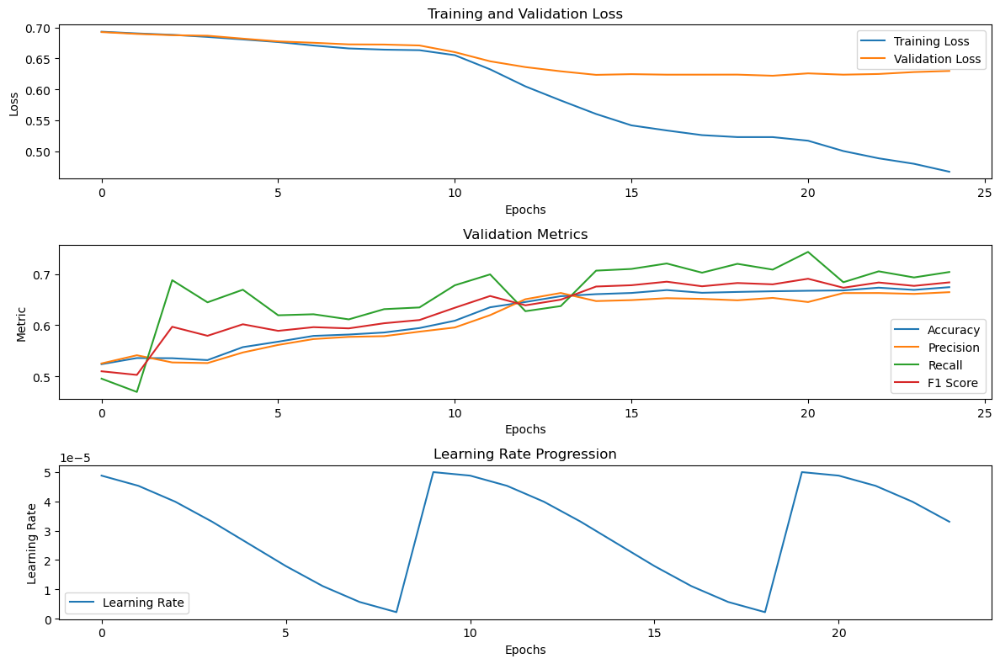

In [70]:
training_method(model, criterion, optimizer, scheduler, num_epochs=100, train_loader=train_dataloader, val_loader=val_dataloader)

In [72]:
ids = []
predictions = []

def make_submission(model, test_loader):
    model.eval()

    with torch.no_grad():
        for batch in tqdm(test_loader):
            images = batch['images'].to(device)
            captions = batch['captions'].to(device)
            id = batch['id']
            
            output = model(images, captions)
            preds = (torch.sigmoid(output) > 0.5).int()
            
            ids.extend(id)
            predictions.extend(preds.cpu().tolist())
    df = pd.DataFrame({'id': ids, 'label': predictions})
    df.to_csv('submission3.csv', index=False)

In [83]:
# # LOAD MODEL FROM PATH
# model_config = {
#     "vocab_size": len(vocab),
#     "embedding_dim": 128,
#     "num_filters": 128,
#     "filter_sizes": [3, 4, 5, 6, 7, 8],
#     "seq_len": max_len,
#     "cnn_text_drop_value": 0.5,
#     "cnn_dropout_value": 0.4,
#     "head_dropout_value": 0.5,
#     "num_classes": 1,
# }
# model = ImageTextClassifier(**model_config)
# model_path = "vocab_size=3733+embedding_dim=128+num_filters=128+filter_sizes=[3, 4, 5, 6, 7, 8]+seq_len=53+cnn_text_drop_value=0.5+cnn_dropout_value=0.4+head_dropout_value=0.5+num_classes=1+eval_loss=0.6202353974606128.pt"
# model.load_state_dict(torch.load(model_path, weights_only=True))
# model.to(device)

ImageTextClassifier(
  (cnn): CNN(
    (layers): Sequential(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU()
      (2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.4, inplace=False)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU()
      (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (8): Dropout(p=0.4, inplace=False)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU()
      (12): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (13): Dropout(p=0.4, inplace=False)
      (14): AdaptiveAvgPool2d(output_size=(1, 1))
    )
    (flatten): Flatten(st

In [73]:
make_submission(model, test_dataloader)

100%|██████████| 32/32 [00:03<00:00,  9.60it/s]


In [24]:

def hyperparameter_tuning(vocab_size, max_len, train_loader, val_loader, param_grid, training_method, num_epochs=200):

    # Create all combinations of hyperparameters
    keys, values = zip(*param_grid.items())
    param_combinations = [dict(zip(keys, v)) for v in product(*values)]
    
    for params in tqdm(param_combinations):
        print(f"Testing configuration: {params}")
        
        try:
            # Update model configuration
            model_config = {
                "vocab_size": vocab_size,
                "embedding_dim": params["embedding_dim"],
                "num_filters": params["num_filters"],
                "filter_sizes": params["filter_sizes"],
                "seq_len": max_len,
                "cnn_text_drop_value": params["cnn_text_drop_value"],
                "cnn_dropout_value": params["cnn_dropout_value"],
                "head_dropout_value": params["head_dropout_value"],
            }
            
            # Initialize model
            model = ImageTextClassifier(**model_config)
            model.to(device)
            model.apply(initialize_weights)
            
            # Define criterion, optimizer, and scheduler
            criterion = nn.BCEWithLogitsLoss()
            optimizer = optim.AdamW(
                model.parameters(), 
                lr=params["lr"], 
                weight_decay=params["weight_decay"]
            )
            scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
                optimizer, 
                T_0=params["T_0"],
                eta_min=params["eta_min"],
            )
            
            # Train the model
            training_method(
                model, criterion, optimizer, scheduler,
                num_epochs=num_epochs,
                train_loader=train_loader,
                val_loader=val_loader
            )
            print(f"Completed configuration: {params}")
        
        except RuntimeError as e:
            print(f"Error with configuration: {params}")
            print(f"Error message: {str(e)}")
        
        finally:
            # Reset GPU memory
            print("Resetting GPU memory...")
            torch.cuda.empty_cache()
            gc.collect()

In [25]:
param_grid = {
    "embedding_dim": [128],
    "num_filters": [16],
    "filter_sizes": [[3, 4, 5],[3, 4, 5, 6, 7, 8, 9]],
    "head_dropout_value": [0.5],
    "cnn_text_drop_value": [0.5],
    "cnn_dropout_value": [0.5],
    "lr": [1e-5, 1e-4, 5e-4, 1e-3, 5e-3],  # Learning rate candidates
    "weight_decay": [1e-6, 1e-5, 1e-4, 1e-3],  # Weight decay candidates
    "T_0": [10],  # Number of epochs for the first cycle
    "T_mult": [1],  # Cycle multiplier
    "eta_min": [1e-6, 1e-5, 1e-4],  # Minimum learning rate
}

total_combinations = math.prod(len(values) for values in param_grid.values())
print(f"Total combinations: {total_combinations}")

time_per_epoch = 23  # seconds
num_epochs = 100  # epochs per configuration
total_time_seconds = total_combinations * time_per_epoch * num_epochs

# Convert to hours
total_time_hours = total_time_seconds / 3600
print(f"Total time to hyper tune: {total_time_hours} hours")

Total combinations: 120
Total time to hyper tune: 76.66666666666667 hours


  0%|          | 0/120 [00:00<?, ?it/s]

Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.6988 at epoch 1

Epoch 1/100 - Training Loss: 0.7006 - Validation Loss: 0.6988 - Accuracy: 0.5013 - Precision: 0.5008 - Recall: 0.8760 - F1 Score: 0.6372 - Time: 22.32 - Lr: 9.78e-06
New best model with Loss: 0.6977 at epoch 2

Epoch 2/100 - Training Loss: 0.6982 - Validation Loss: 0.6977 - Accuracy: 0.5013 - Precision: 0.5008 - Recall: 0.8507 - F1 Score: 0.6304 - Time: 22.29 - Lr: 9.14e-06
New best model with Loss: 0.6975 at epoch 3

Epoch 3/100 - Training Loss: 0.6976 - Validation Loss: 0.6975 - Accuracy: 0.5023 - Precision: 0.5013 - Recall: 0.8713 - F1 Score: 0.6365 - Time: 22.33 - Lr: 8.15e-06
New best model with Loss: 0.6970 at epoch 4

Epoch 4/100 - Training Loss: 0.6955 - Validation Loss: 0.6970 - 

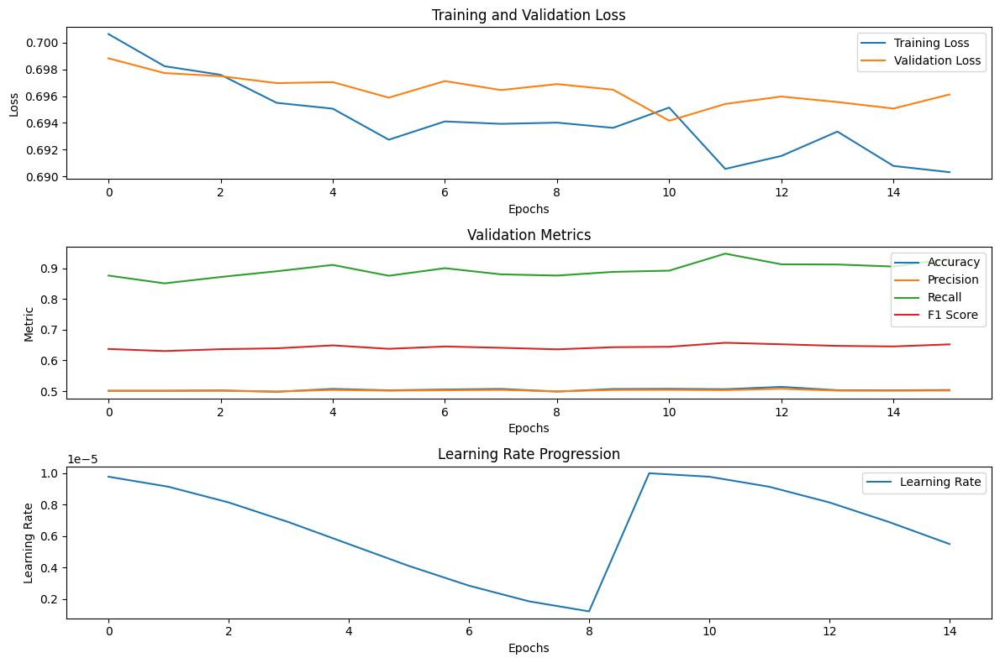

  1%|          | 1/120 [05:57<11:49:35, 357.78s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.7082 at epoch 1

Epoch 1/100 - Training Loss: 0.7059 - Validation Loss: 0.7082 - Accuracy: 0.4913 - Precision: 0.4925 - Recall: 0.5680 - F1 Score: 0.5276 - Time: 22.12 - Lr: 1.00e-05
New best model with Loss: 0.7030 at epoch 2

Epoch 2/100 - Training Loss: 0.7000 - Validation Loss: 0.7030 - Accuracy: 0.4947 - Precision: 0.4962 - Recall: 0.6887 - F1 Score: 0.5768 - Time: 22.13 - Lr: 1.00e-05
New best model with Loss: 0.7013 at 

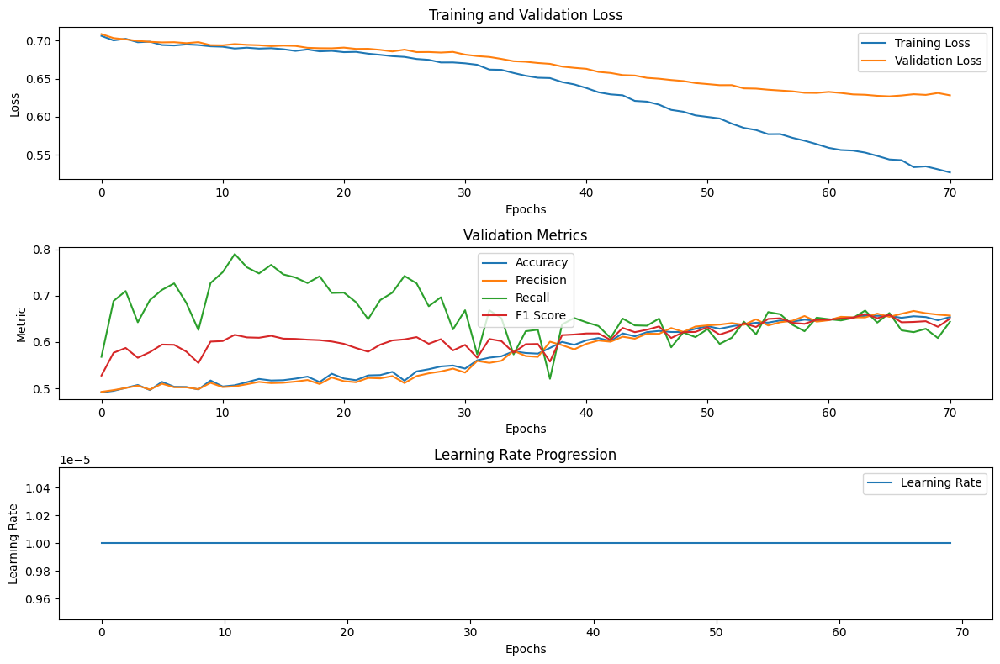

  2%|▏         | 2/120 [32:10<35:09:34, 1072.67s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6961 at epoch 1

Epoch 1/100 - Training Loss: 0.6993 - Validation Loss: 0.6961 - Accuracy: 0.5090 - Precision: 0.5118 - Recall: 0.3913 - F1 Score: 0.4435 - Time: 21.96 - Lr: 1.22e-05
New best model with Loss: 0.6956 at epoch 2

Epoch 2/100 - Training Loss: 0.7007 - Validation Loss: 0.6956 - Accuracy: 0.5037 - Precision: 0.5044 - Recall: 0.4193 - F1 Score: 0.4580 - Time: 22.17 - Lr: 1.86e-05
New best model with Loss: 0.6947 at

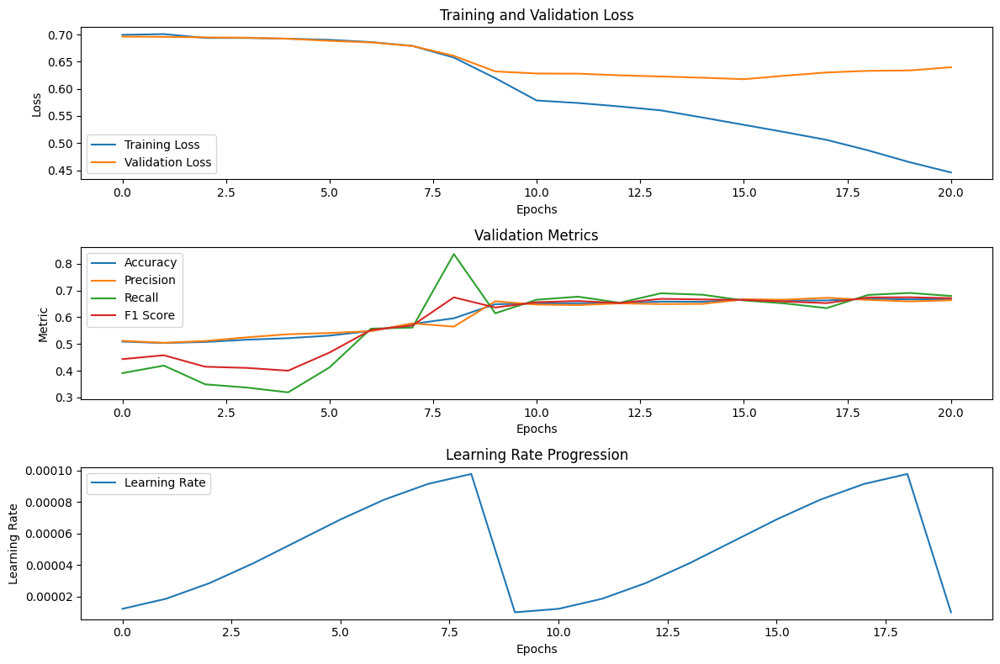

  2%|▎         | 3/120 [39:56<25:51:00, 795.39s/it] 

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.7454 at epoch 1

Epoch 1/100 - Training Loss: 0.7013 - Validation Loss: 0.7454 - Accuracy: 0.4920 - Precision: 0.4469 - Recall: 0.0673 - F1 Score: 0.1170 - Time: 22.14 - Lr: 9.78e-06
New best model with Loss: 0.7311 at epoch 2

Epoch 2/100 - Training Loss: 0.7006 - Validation Loss: 0.7311 - Accuracy: 0.4910 - Precision: 0.4675 - Recall: 0.1293 - F1 Score: 0.2026 - Time: 22.19 - Lr: 9.14e-06
New best model with Loss: 0.7192 at

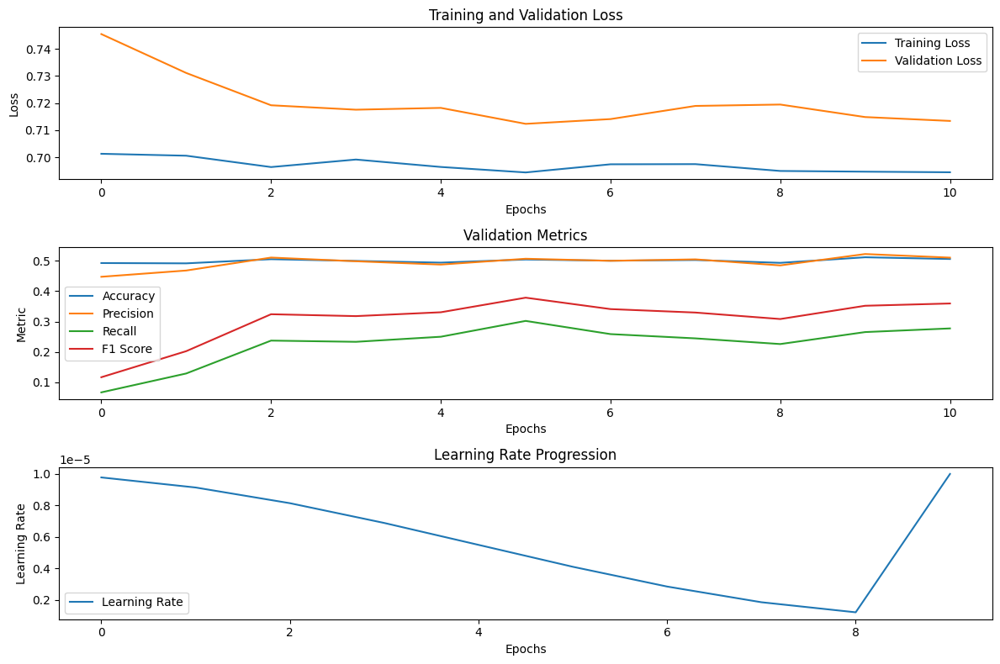

  3%|▎         | 4/120 [43:59<18:36:33, 577.53s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.7015 at epoch 1

Epoch 1/100 - Training Loss: 0.7057 - Validation Loss: 0.7015 - Accuracy: 0.4943 - Precision: 0.4967 - Recall: 0.8427 - F1 Score: 0.6250 - Time: 21.81 - Lr: 1.00e-05
New best model with Loss: 0.6973 at epoch 2

Epoch 2/100 - Training Loss: 0.6990 - Validation Loss: 0.6973 - Accuracy: 0.5013 - Precision: 0.5007 - Recall: 0.8960 - F1 Score: 0.6424 - Time: 22.00 - Lr: 1.00e-05
Validation loss did not improve for 

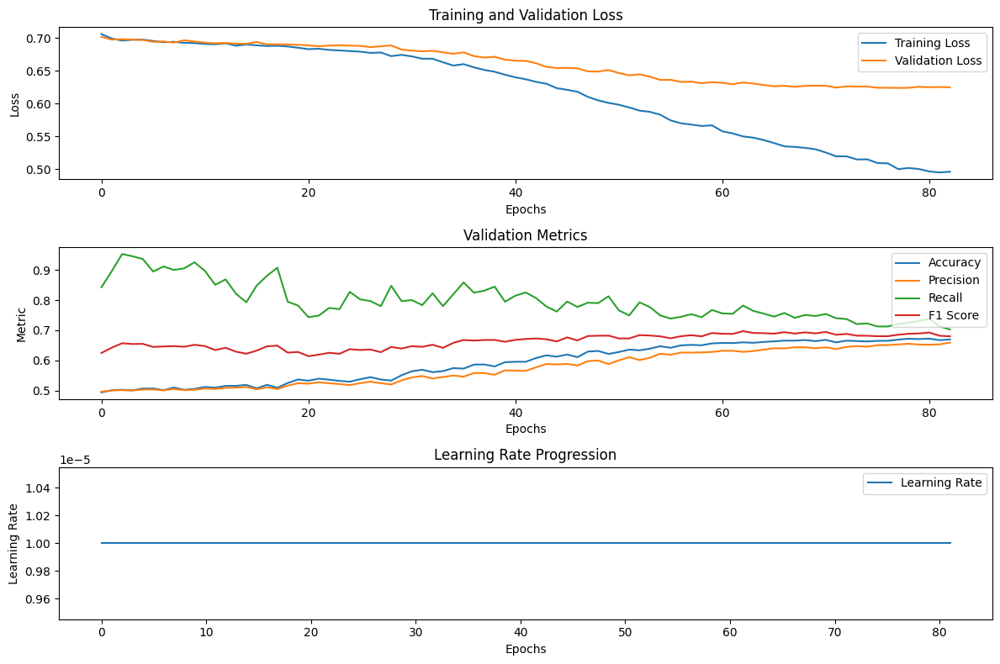

  4%|▍         | 5/120 [1:14:26<32:50:07, 1027.89s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6999 at epoch 1

Epoch 1/100 - Training Loss: 0.7035 - Validation Loss: 0.6999 - Accuracy: 0.4967 - Precision: 0.4983 - Recall: 0.9907 - F1 Score: 0.6631 - Time: 22.11 - Lr: 1.22e-05
New best model with Loss: 0.6957 at epoch 2

Epoch 2/100 - Training Loss: 0.6980 - Validation Loss: 0.6957 - Accuracy: 0.4960 - Precision: 0.4979 - Recall: 0.9693 - F1 Score: 0.6579 - Time: 22.01 - Lr: 1.86e-05
New best model with Loss: 0.6931 at

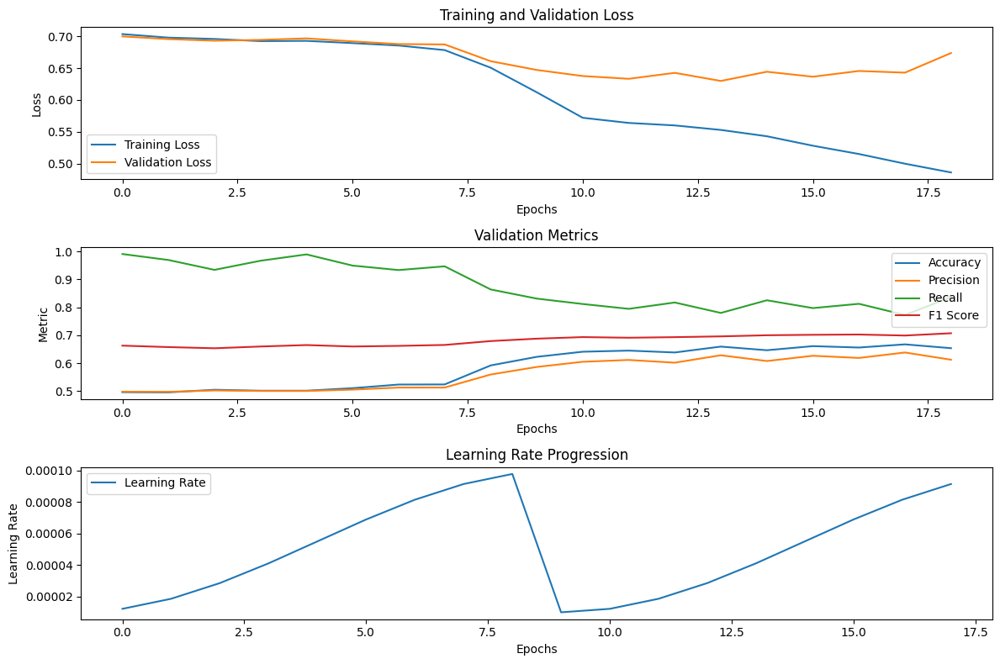

  5%|▌         | 6/120 [1:21:25<25:59:34, 820.83s/it] 

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.7092 at epoch 1

Epoch 1/100 - Training Loss: 0.7034 - Validation Loss: 0.7092 - Accuracy: 0.4960 - Precision: 0.3500 - Recall: 0.0093 - F1 Score: 0.0182 - Time: 22.19 - Lr: 9.78e-06
New best model with Loss: 0.7001 at epoch 2

Epoch 2/100 - Training Loss: 0.6972 - Validation Loss: 0.7001 - Accuracy: 0.5097 - Precision: 0.5868 - Recall: 0.0653 - F1 Score: 0.1176 - Time: 22.07 - Lr: 9.14e-06
New best model with Loss: 0.7000 a

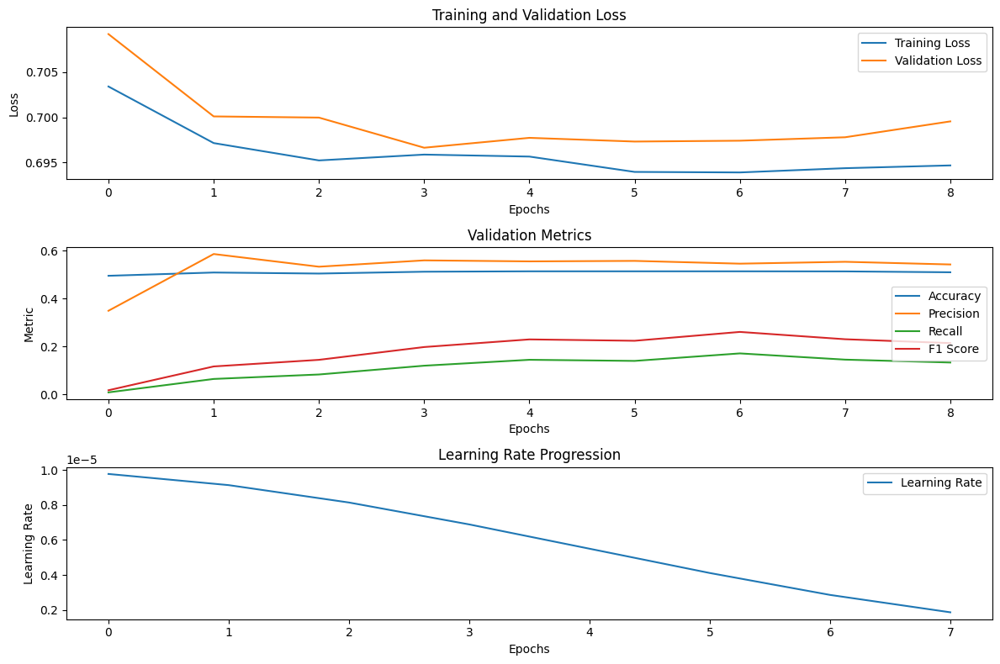

  6%|▌         | 7/120 [1:24:44<19:23:03, 617.55s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.7007 at epoch 1

Epoch 1/100 - Training Loss: 0.7015 - Validation Loss: 0.7007 - Accuracy: 0.5043 - Precision: 0.5022 - Recall: 0.9940 - F1 Score: 0.6673 - Time: 22.02 - Lr: 1.00e-05
New best model with Loss: 0.6991 at epoch 2

Epoch 2/100 - Training Loss: 0.6951 - Validation Loss: 0.6991 - Accuracy: 0.4987 - Precision: 0.4993 - Recall: 0.9760 - F1 Score: 0.6606 - Time: 21.94 - Lr: 1.00e-05
New best model with Loss: 0.6954 a

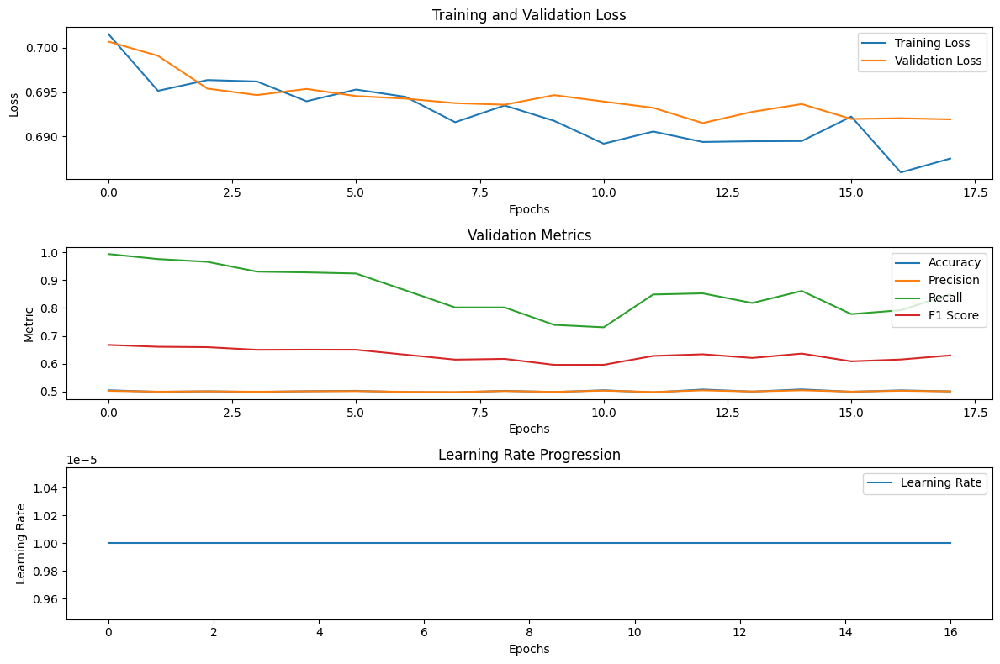

  7%|▋         | 8/120 [1:31:20<17:01:33, 547.27s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6942 at epoch 1

Epoch 1/100 - Training Loss: 0.7025 - Validation Loss: 0.6942 - Accuracy: 0.5173 - Precision: 0.5370 - Recall: 0.2513 - F1 Score: 0.3424 - Time: 21.99 - Lr: 1.22e-05
New best model with Loss: 0.6912 at epoch 2

Epoch 2/100 - Training Loss: 0.6971 - Validation Loss: 0.6912 - Accuracy: 0.5223 - Precision: 0.5175 - Recall: 0.6607 - F1 Score: 0.5804 - Time: 21.90 - Lr: 1.86e-05
Validation loss did not improve f

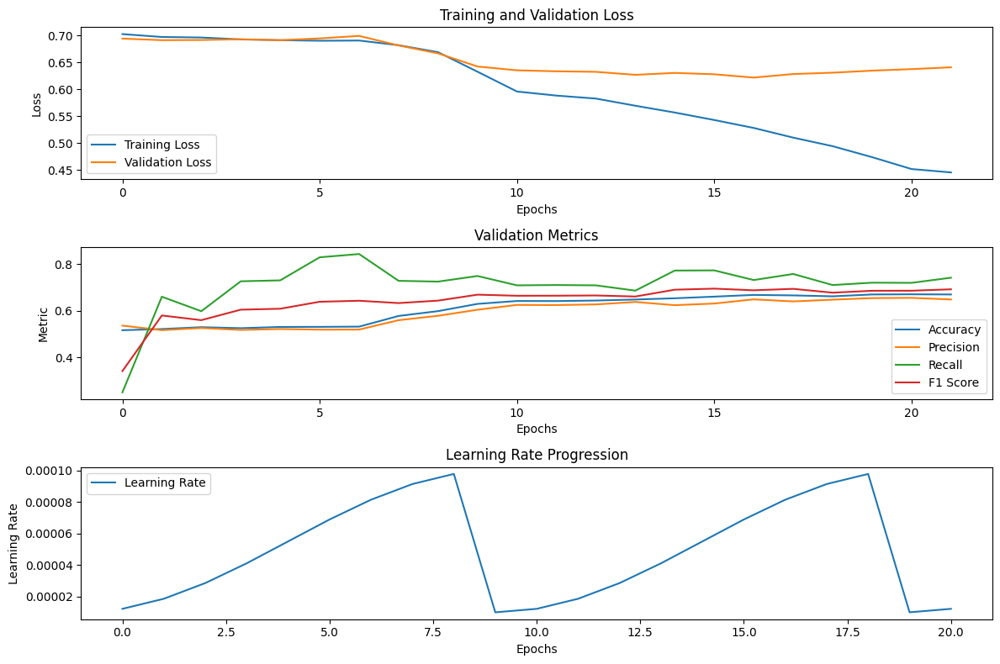

  8%|▊         | 9/120 [1:39:25<16:16:19, 527.74s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.7013 at epoch 1

Epoch 1/100 - Training Loss: 0.7048 - Validation Loss: 0.7013 - Accuracy: 0.4860 - Precision: 0.4923 - Recall: 0.8993 - F1 Score: 0.6363 - Time: 22.21 - Lr: 9.78e-06
New best model with Loss: 0.7011 at epoch 2

Epoch 2/100 - Training Loss: 0.7000 - Validation Loss: 0.7011 - Accuracy: 0.5003 - Precision: 0.5002 - Recall: 0.9667 - F1 Score: 0.6592 - Time: 22.09 - Lr: 9.14e-06
New best model with Loss: 0.6997 a

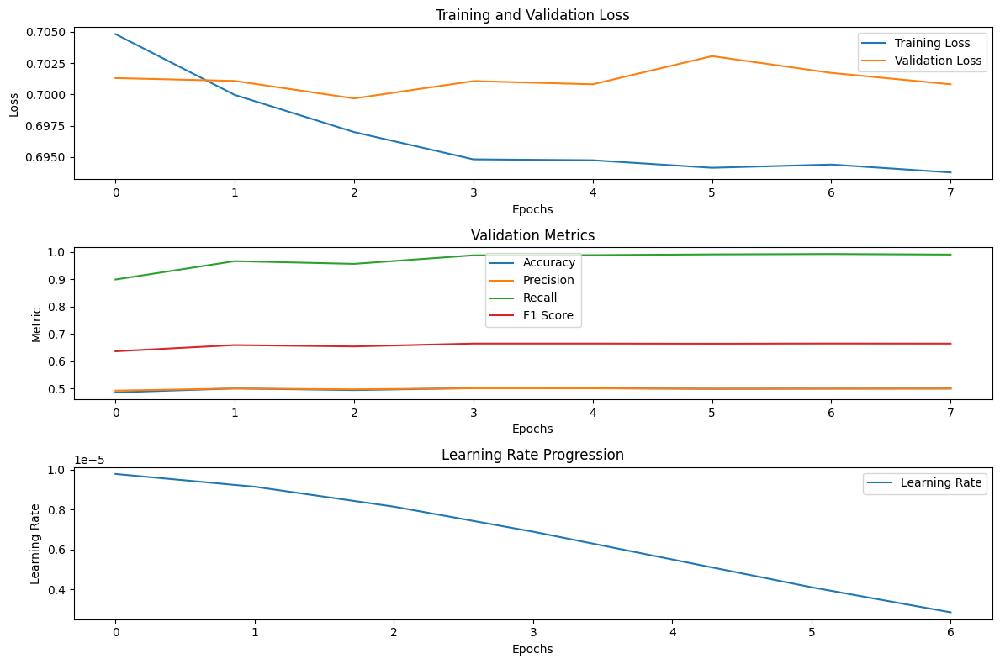

  8%|▊         | 10/120 [1:42:22<12:49:01, 419.47s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.7075 at epoch 1

Epoch 1/100 - Training Loss: 0.7005 - Validation Loss: 0.7075 - Accuracy: 0.4873 - Precision: 0.4793 - Recall: 0.2933 - F1 Score: 0.3639 - Time: 22.09 - Lr: 1.00e-05
New best model with Loss: 0.7038 at epoch 2

Epoch 2/100 - Training Loss: 0.6979 - Validation Loss: 0.7038 - Accuracy: 0.4970 - Precision: 0.4963 - Recall: 0.3973 - F1 Score: 0.4413 - Time: 21.99 - Lr: 1.00e-05
New best model with Loss: 0.6980 at 

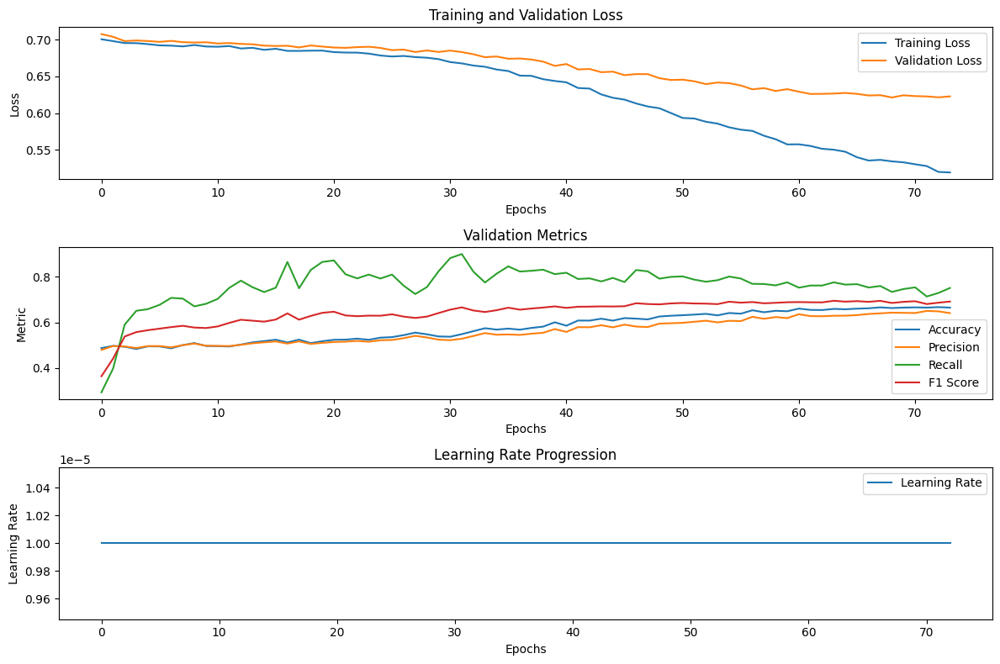

  9%|▉         | 11/120 [2:09:28<23:52:39, 788.62s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6950 at epoch 1

Epoch 1/100 - Training Loss: 0.7047 - Validation Loss: 0.6950 - Accuracy: 0.5150 - Precision: 0.5228 - Recall: 0.3433 - F1 Score: 0.4145 - Time: 22.05 - Lr: 1.22e-05
New best model with Loss: 0.6929 at epoch 2

Epoch 2/100 - Training Loss: 0.6980 - Validation Loss: 0.6929 - Accuracy: 0.5123 - Precision: 0.5109 - Recall: 0.5787 - F1 Score: 0.5427 - Time: 21.98 - Lr: 1.86e-05
New best model with Loss: 0.6928 at

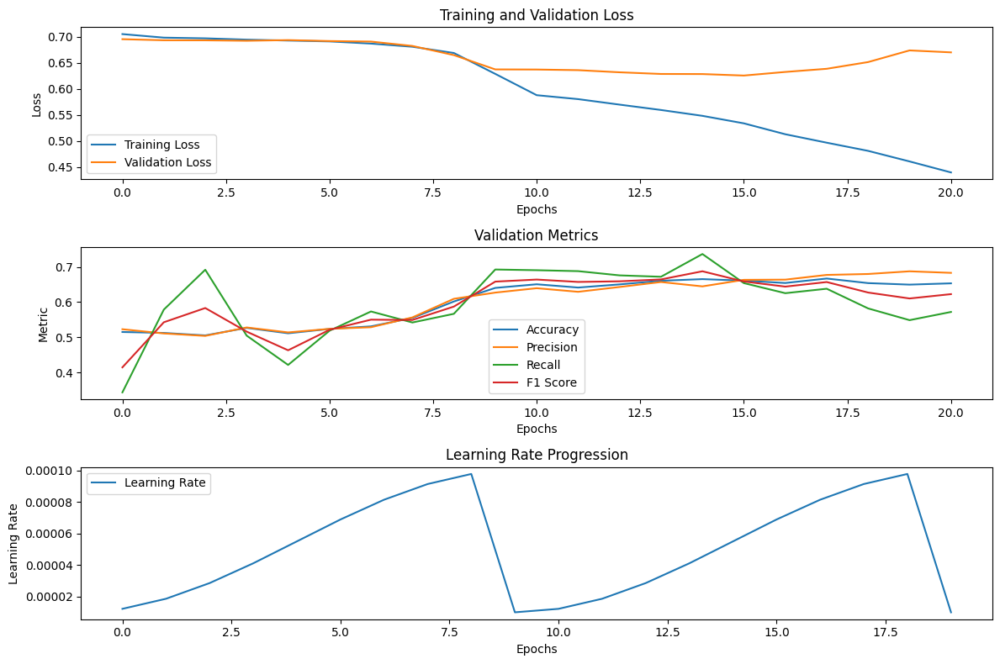

 10%|█         | 12/120 [2:17:09<20:40:20, 689.08s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.7057 at epoch 1

Epoch 1/100 - Training Loss: 0.6973 - Validation Loss: 0.7057 - Accuracy: 0.5010 - Precision: 0.5005 - Recall: 0.9907 - F1 Score: 0.6650 - Time: 22.03 - Lr: 9.76e-05
New best model with Loss: 0.6923 at epoch 2

Epoch 2/100 - Training Loss: 0.6920 - Validation Loss: 0.6923 - Accuracy: 0.5227 - Precision: 0.5131 - Recall: 0.8887 - F1 Score: 0.6506 - Time: 22.04 - Lr: 9.05e-05
New best model with Loss: 0.6828 a

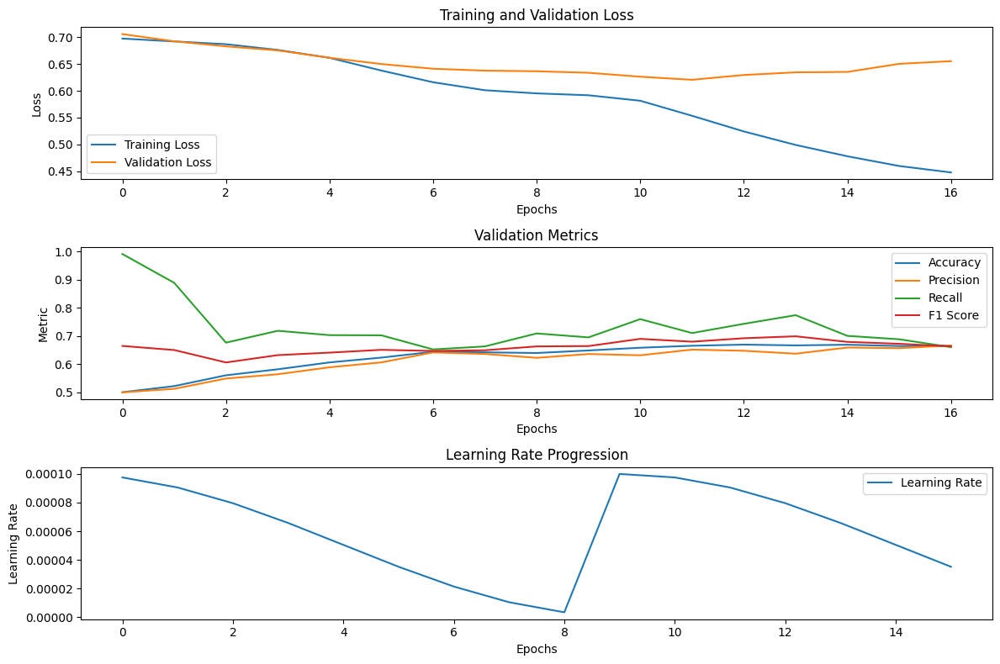

 11%|█         | 13/120 [2:23:23<17:38:19, 593.45s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.6924 at epoch 1

Epoch 1/100 - Training Loss: 0.6955 - Validation Loss: 0.6924 - Accuracy: 0.5210 - Precision: 0.5323 - Recall: 0.3460 - F1 Score: 0.4194 - Time: 21.97 - Lr: 9.78e-05
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6925 - Validation Loss: 0.6990 - Accuracy: 0.5120 - Precision: 0.5285 - Recall: 0.2227 - F1 Score: 0.3133 - Time: 21.89 - Lr: 9.14e-05
Validation loss did not improv

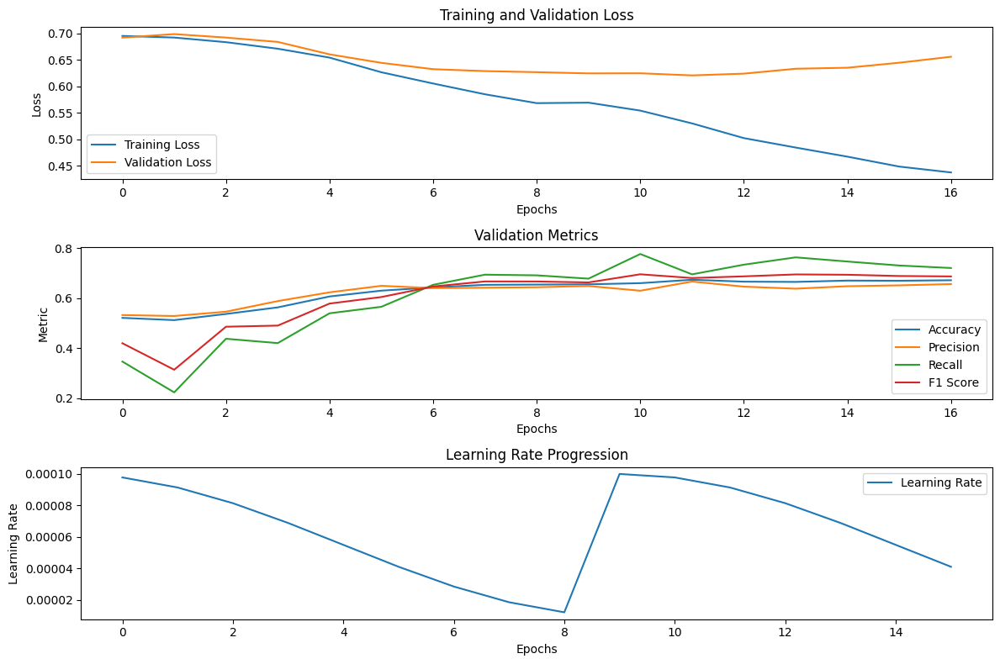

 12%|█▏        | 14/120 [2:29:36<15:30:58, 526.97s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6970 at epoch 1

Epoch 1/100 - Training Loss: 0.6969 - Validation Loss: 0.6970 - Accuracy: 0.5070 - Precision: 0.5037 - Recall: 0.9587 - F1 Score: 0.6604 - Time: 21.97 - Lr: 1.00e-04
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6905 - Validation Loss: 0.7017 - Accuracy: 0.4997 - Precision: 0.4998 - Recall: 0.9787 - F1 Score: 0.6617 - Time: 21.89 - Lr: 1.00e-04
Validation loss did not impro

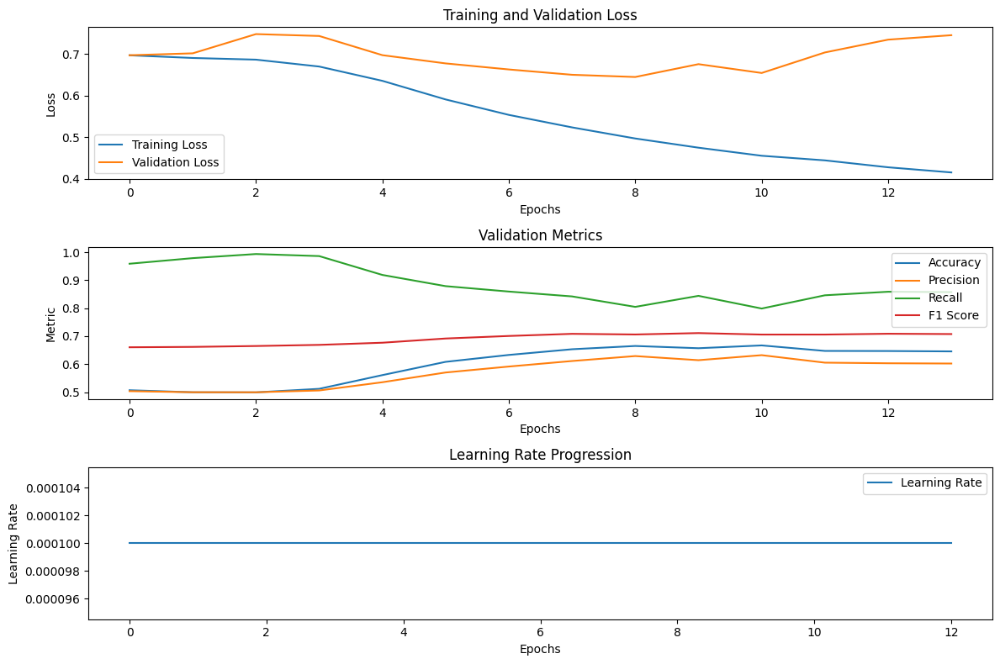

 12%|█▎        | 15/120 [2:34:44<13:26:24, 460.81s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.7076 at epoch 1

Epoch 1/100 - Training Loss: 0.6964 - Validation Loss: 0.7076 - Accuracy: 0.5043 - Precision: 0.5022 - Recall: 0.9780 - F1 Score: 0.6637 - Time: 22.04 - Lr: 9.76e-05
New best model with Loss: 0.6937 at epoch 2

Epoch 2/100 - Training Loss: 0.6893 - Validation Loss: 0.6937 - Accuracy: 0.5153 - Precision: 0.5083 - Recall: 0.9353 - F1 Score: 0.6587 - Time: 21.95 - Lr: 9.05e-05
New best model with Loss: 0.6876 

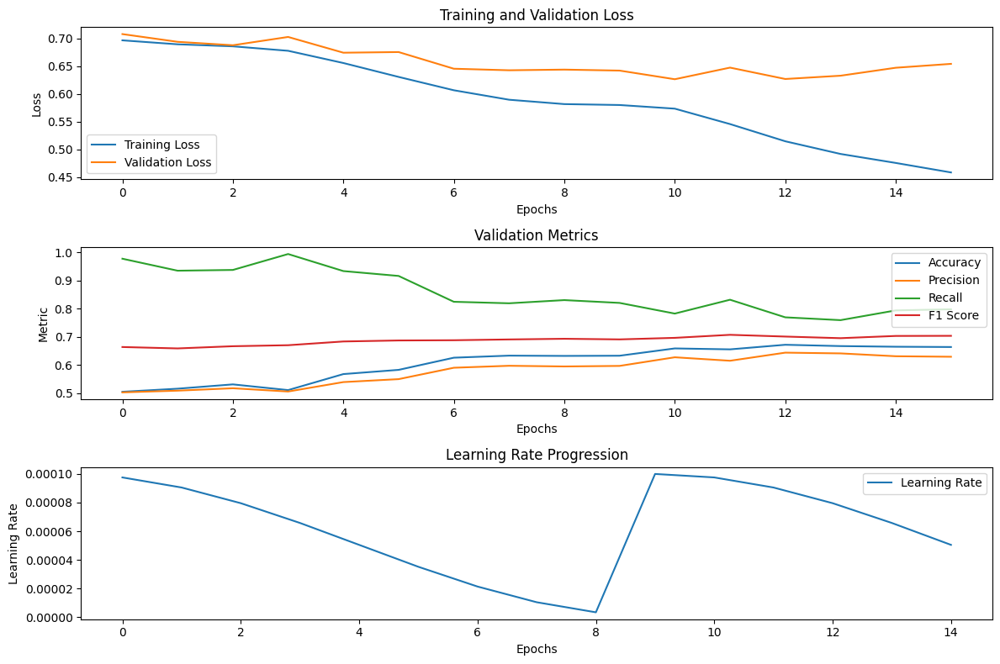

 13%|█▎        | 16/120 [2:40:35<12:21:41, 427.90s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.6952 at epoch 1

Epoch 1/100 - Training Loss: 0.6938 - Validation Loss: 0.6952 - Accuracy: 0.5210 - Precision: 0.5338 - Recall: 0.3313 - F1 Score: 0.4089 - Time: 22.03 - Lr: 9.78e-05
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6889 - Validation Loss: 0.7017 - Accuracy: 0.5110 - Precision: 0.5233 - Recall: 0.2467 - F1 Score: 0.3353 - Time: 21.90 - Lr: 9.14e-05
Validation loss did not improv

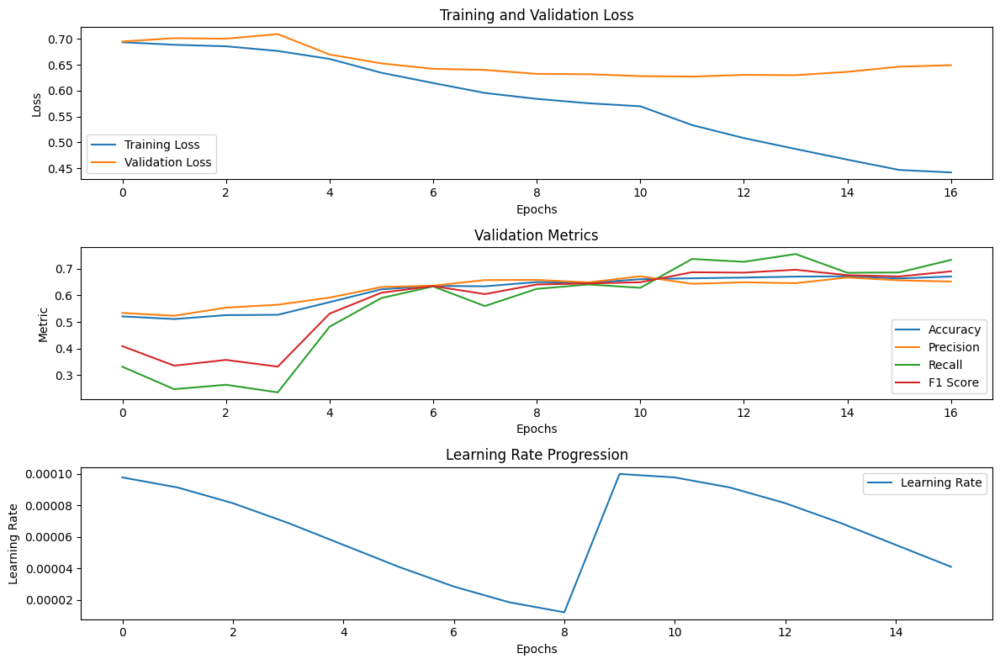

 14%|█▍        | 17/120 [2:46:48<11:46:25, 411.51s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.7167 at epoch 1

Epoch 1/100 - Training Loss: 0.6979 - Validation Loss: 0.7167 - Accuracy: 0.5007 - Precision: 0.5081 - Recall: 0.0420 - F1 Score: 0.0776 - Time: 21.97 - Lr: 1.00e-04
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6912 - Validation Loss: 0.7330 - Accuracy: 0.5020 - Precision: 0.5395 - Recall: 0.0273 - F1 Score: 0.0520 - Time: 21.97 - Lr: 1.00e-04
Validation loss did not impro

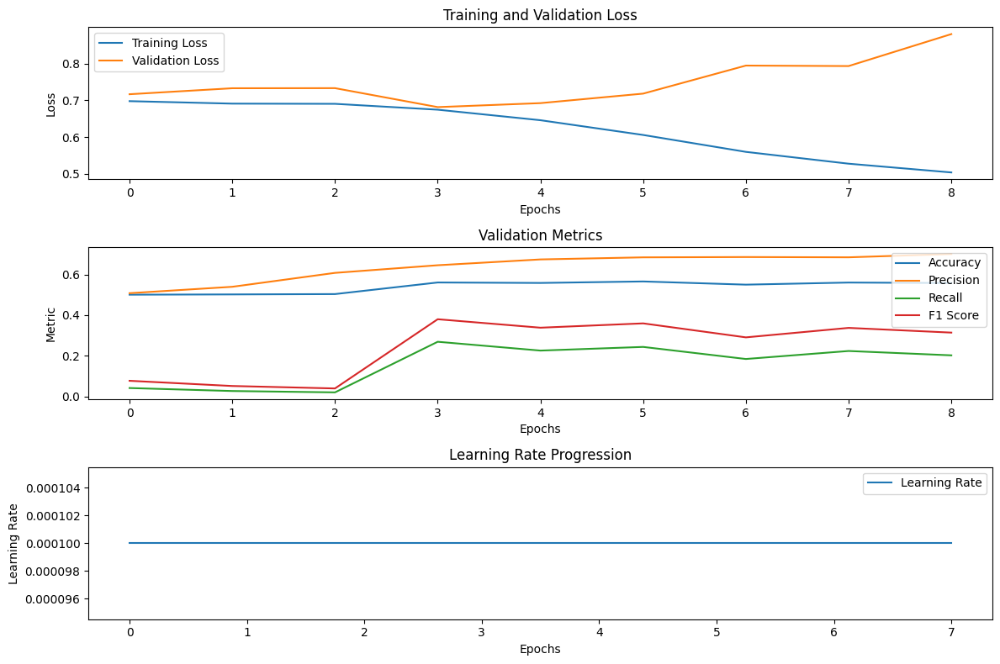

 15%|█▌        | 18/120 [2:50:06<9:50:22, 347.28s/it] 

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.6975 at epoch 1

Epoch 1/100 - Training Loss: 0.6973 - Validation Loss: 0.6975 - Accuracy: 0.5077 - Precision: 0.5216 - Recall: 0.1853 - F1 Score: 0.2735 - Time: 21.80 - Lr: 9.76e-05
New best model with Loss: 0.6917 at epoch 2

Epoch 2/100 - Training Loss: 0.6907 - Validation Loss: 0.6917 - Accuracy: 0.5177 - Precision: 0.5239 - Recall: 0.3867 - F1 Score: 0.4450 - Time: 21.97 - Lr: 9.05e-05
New best model with Loss: 0.6871

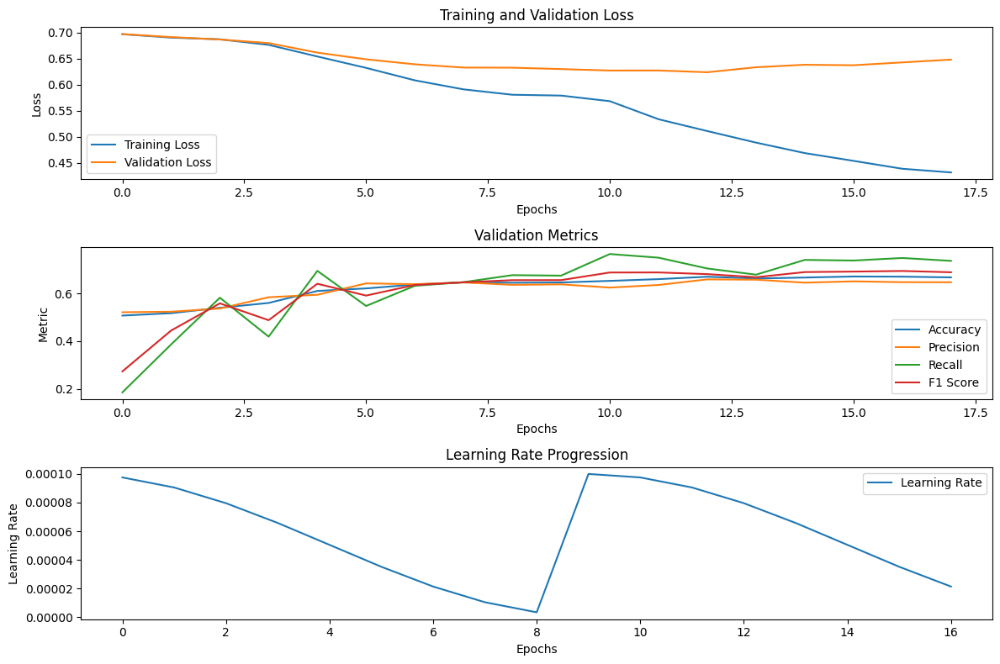

 16%|█▌        | 19/120 [2:56:41<10:08:47, 361.65s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.6913 at epoch 1

Epoch 1/100 - Training Loss: 0.6988 - Validation Loss: 0.6913 - Accuracy: 0.5187 - Precision: 0.5160 - Recall: 0.6007 - F1 Score: 0.5551 - Time: 21.96 - Lr: 9.78e-05
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6919 - Validation Loss: 0.6942 - Accuracy: 0.5007 - Precision: 0.5003 - Recall: 0.9693 - F1 Score: 0.6600 - Time: 21.91 - Lr: 9.14e-05
New best model with Loss: 0.

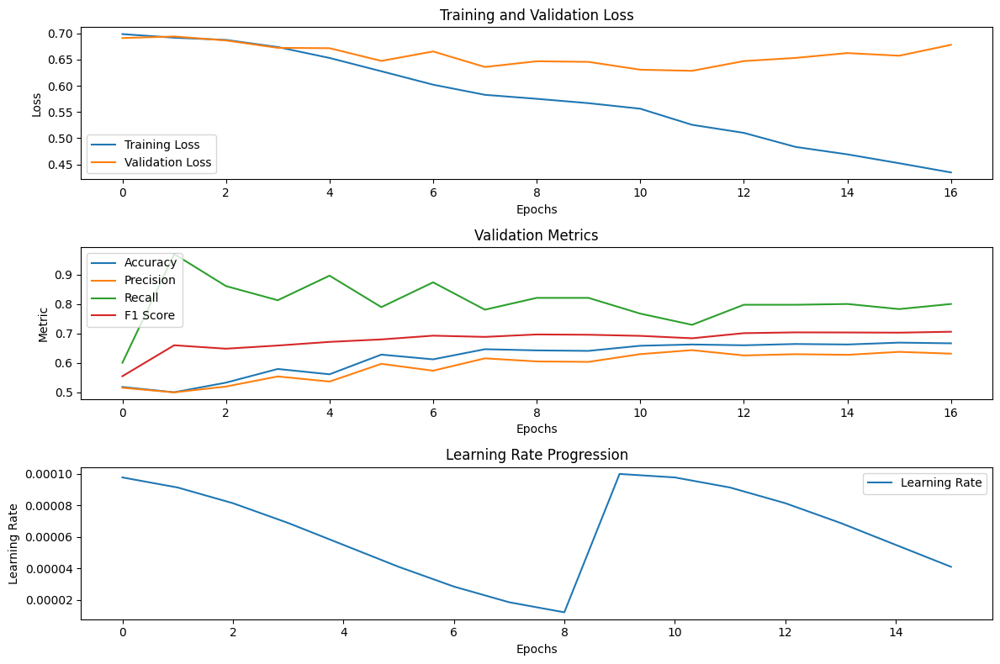

 17%|█▋        | 20/120 [3:02:55<10:08:33, 365.14s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6923 at epoch 1

Epoch 1/100 - Training Loss: 0.6960 - Validation Loss: 0.6923 - Accuracy: 0.5063 - Precision: 0.5043 - Recall: 0.7440 - F1 Score: 0.6011 - Time: 21.90 - Lr: 1.00e-04
New best model with Loss: 0.6909 at epoch 2

Epoch 2/100 - Training Loss: 0.6911 - Validation Loss: 0.6909 - Accuracy: 0.5113 - Precision: 0.5072 - Recall: 0.8020 - F1 Score: 0.6214 - Time: 21.97 - Lr: 1.00e-04
New best model with Loss: 0.689

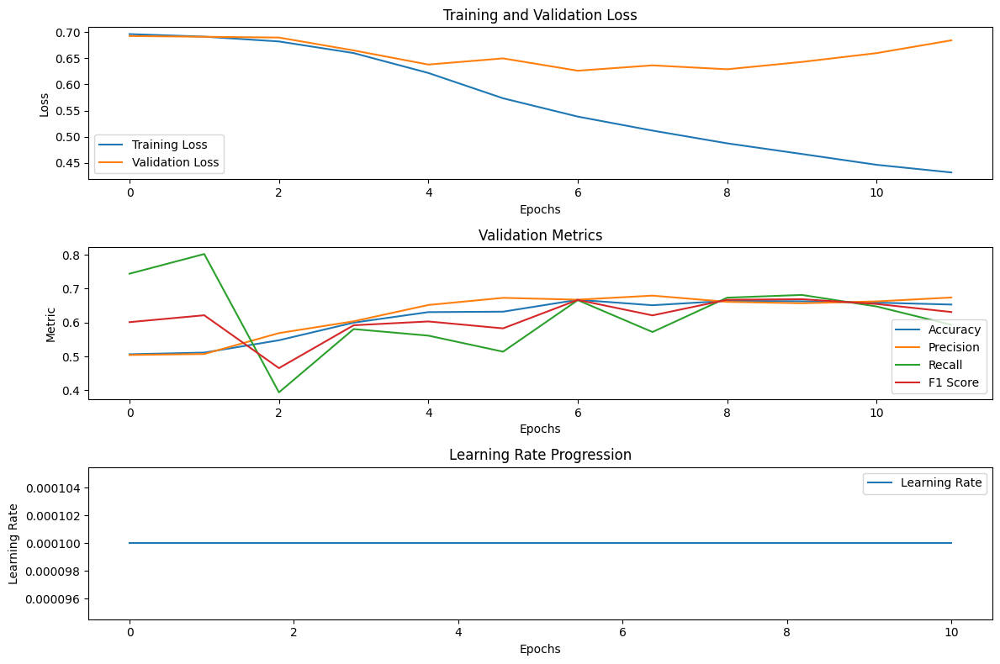

 18%|█▊        | 21/120 [3:07:19<9:12:20, 334.75s/it] 

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.6923 at epoch 1

Epoch 1/100 - Training Loss: 0.6966 - Validation Loss: 0.6923 - Accuracy: 0.5120 - Precision: 0.5127 - Recall: 0.4853 - F1 Score: 0.4986 - Time: 21.86 - Lr: 9.76e-05
New best model with Loss: 0.6888 at epoch 2

Epoch 2/100 - Training Loss: 0.6902 - Validation Loss: 0.6888 - Accuracy: 0.5267 - Precision: 0.5200 - Recall: 0.6940 - F1 Score: 0.5945 - Time: 21.78 - Lr: 9.05e-05
New best model with Loss: 0.6858

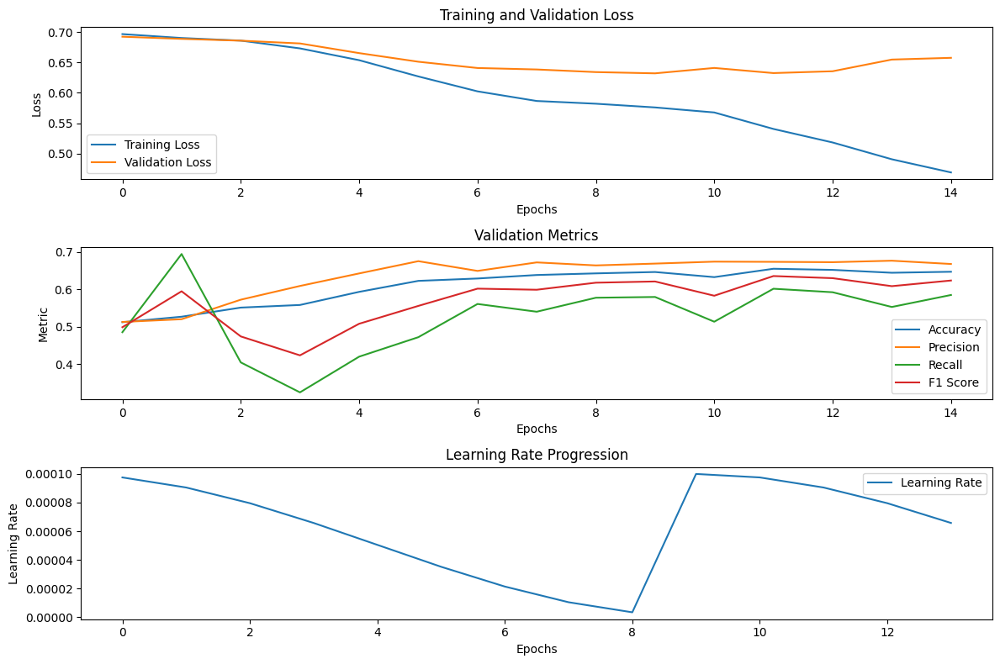

 18%|█▊        | 22/120 [3:12:48<9:04:11, 333.18s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.6939 at epoch 1

Epoch 1/100 - Training Loss: 0.6984 - Validation Loss: 0.6939 - Accuracy: 0.5090 - Precision: 0.5119 - Recall: 0.3860 - F1 Score: 0.4401 - Time: 21.97 - Lr: 9.78e-05
New best model with Loss: 0.6922 at epoch 2

Epoch 2/100 - Training Loss: 0.6908 - Validation Loss: 0.6922 - Accuracy: 0.5047 - Precision: 0.5037 - Recall: 0.6380 - F1 Score: 0.5629 - Time: 21.88 - Lr: 9.14e-05
New best model with Loss: 0.6851 a

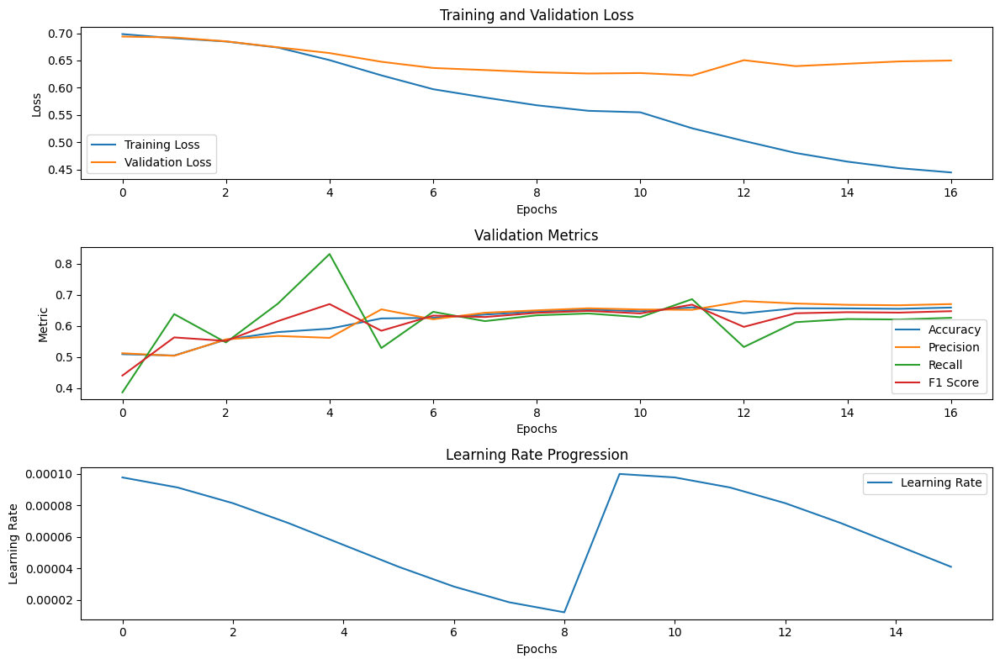

 19%|█▉        | 23/120 [3:19:02<9:18:25, 345.42s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6916 at epoch 1

Epoch 1/100 - Training Loss: 0.6957 - Validation Loss: 0.6916 - Accuracy: 0.5207 - Precision: 0.5255 - Recall: 0.4267 - F1 Score: 0.4709 - Time: 21.91 - Lr: 1.00e-04
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6902 - Validation Loss: 0.6941 - Accuracy: 0.5143 - Precision: 0.5139 - Recall: 0.5287 - F1 Score: 0.5212 - Time: 21.83 - Lr: 1.00e-04
New best model with Loss: 0.6

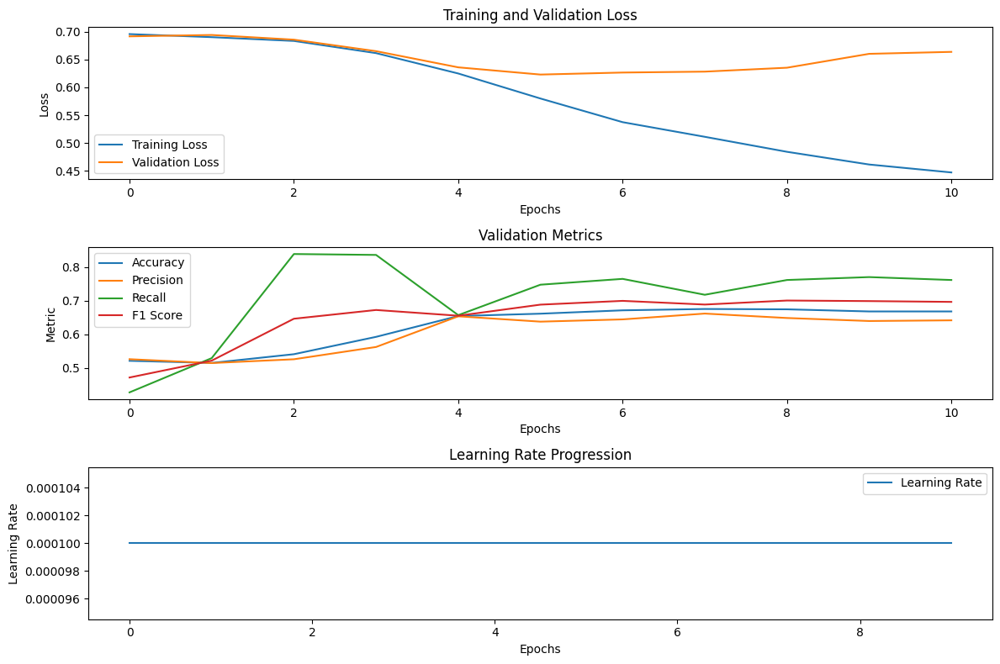

 20%|██        | 24/120 [3:23:04<8:22:49, 314.26s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.7007 at epoch 1

Epoch 1/100 - Training Loss: 0.6966 - Validation Loss: 0.7007 - Accuracy: 0.5213 - Precision: 0.5118 - Recall: 0.9280 - F1 Score: 0.6597 - Time: 21.98 - Lr: 4.88e-04
New best model with Loss: 0.6536 at epoch 2

Epoch 2/100 - Training Loss: 0.6357 - Validation Loss: 0.6536 - Accuracy: 0.6243 - Precision: 0.6337 - Recall: 0.5893 - F1 Score: 0.6107 - Time: 22.05 - Lr: 4.52e-04
New best model with Loss: 0.6335 

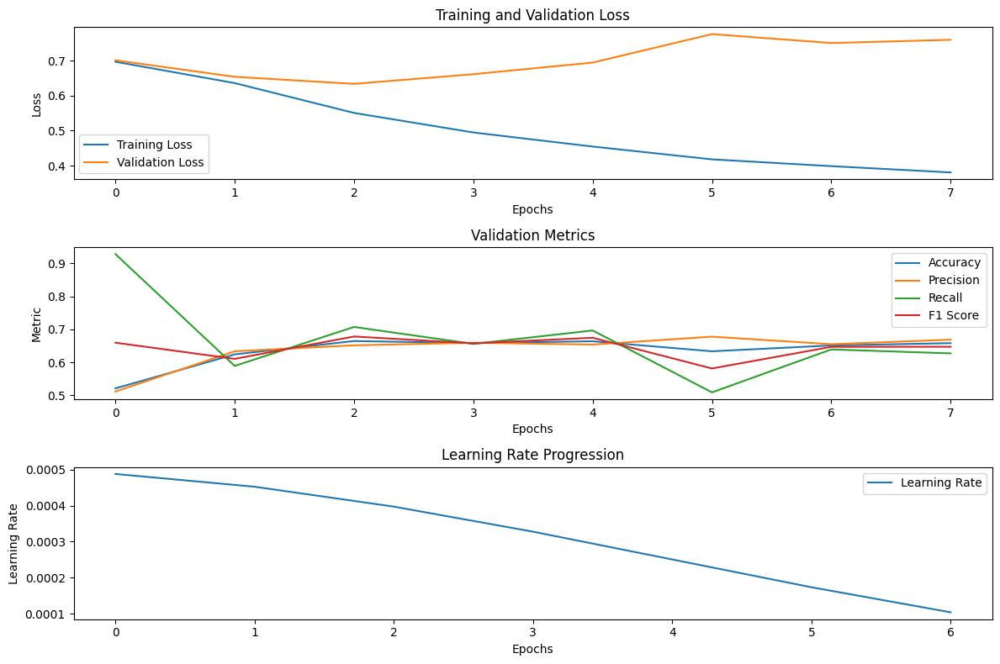

 21%|██        | 25/120 [3:26:00<7:11:53, 272.78s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.6906 at epoch 1

Epoch 1/100 - Training Loss: 0.6974 - Validation Loss: 0.6906 - Accuracy: 0.5423 - Precision: 0.5646 - Recall: 0.3700 - F1 Score: 0.4470 - Time: 21.78 - Lr: 4.88e-04
New best model with Loss: 0.6404 at epoch 2

Epoch 2/100 - Training Loss: 0.6535 - Validation Loss: 0.6404 - Accuracy: 0.6340 - Precision: 0.6446 - Recall: 0.5973 - F1 Score: 0.6201 - Time: 21.88 - Lr: 4.53e-04
Validation loss did not improve fo

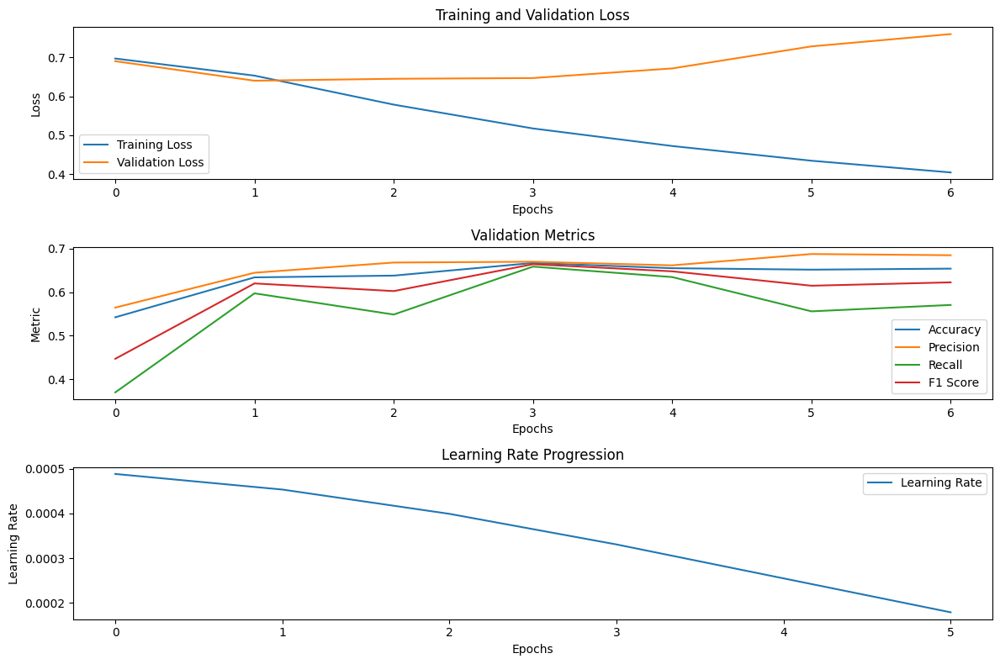

 22%|██▏       | 26/120 [3:28:34<6:11:28, 237.11s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6940 at epoch 1

Epoch 1/100 - Training Loss: 0.6936 - Validation Loss: 0.6940 - Accuracy: 0.5547 - Precision: 0.5353 - Recall: 0.8287 - F1 Score: 0.6504 - Time: 22.08 - Lr: 4.90e-04
New best model with Loss: 0.6275 at epoch 2

Epoch 2/100 - Training Loss: 0.6297 - Validation Loss: 0.6275 - Accuracy: 0.6547 - Precision: 0.6358 - Recall: 0.7240 - F1 Score: 0.6771 - Time: 22.00 - Lr: 4.62e-04
Validation loss did not improve f

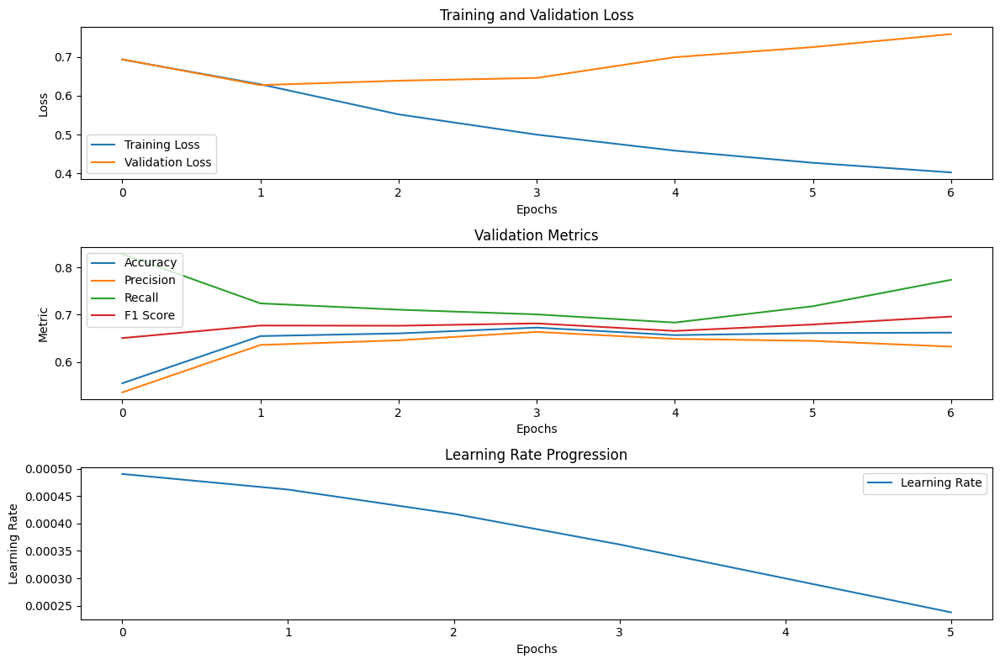

 22%|██▎       | 27/120 [3:31:08<5:29:07, 212.34s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.6897 at epoch 1

Epoch 1/100 - Training Loss: 0.6927 - Validation Loss: 0.6897 - Accuracy: 0.5480 - Precision: 0.7264 - Recall: 0.1540 - F1 Score: 0.2541 - Time: 21.87 - Lr: 4.88e-04
New best model with Loss: 0.6385 at epoch 2

Epoch 2/100 - Training Loss: 0.6307 - Validation Loss: 0.6385 - Accuracy: 0.6453 - Precision: 0.6672 - Recall: 0.5800 - F1 Score: 0.6205 - Time: 21.83 - Lr: 4.52e-04
New best model with Loss: 0.6370 

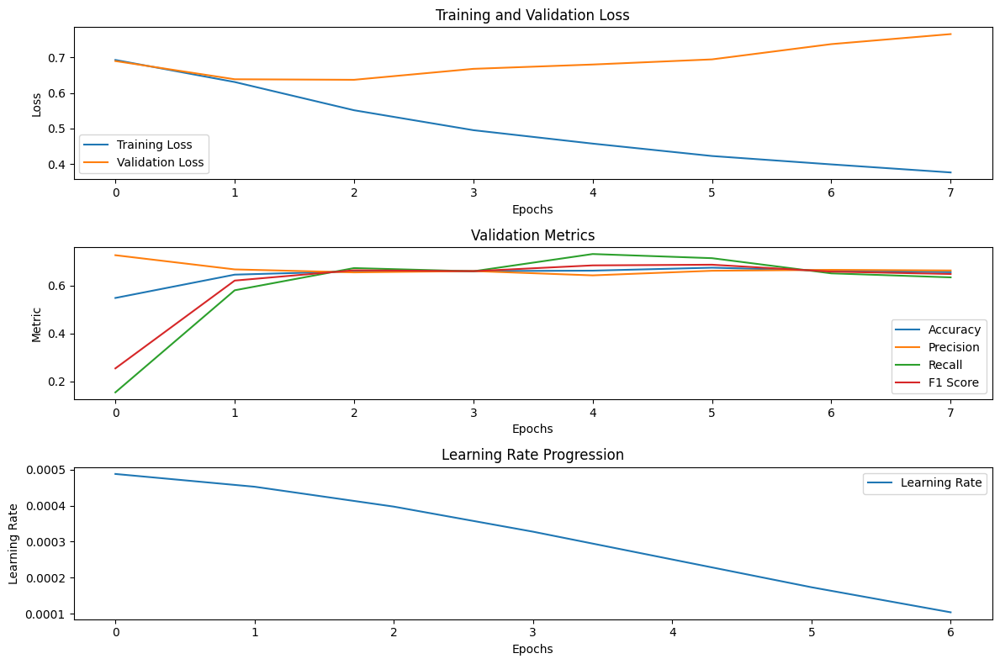

 23%|██▎       | 28/120 [3:34:04<5:08:40, 201.31s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.6906 at epoch 1

Epoch 1/100 - Training Loss: 0.6960 - Validation Loss: 0.6906 - Accuracy: 0.5483 - Precision: 0.5885 - Recall: 0.3213 - F1 Score: 0.4157 - Time: 21.98 - Lr: 4.88e-04
New best model with Loss: 0.6596 at epoch 2

Epoch 2/100 - Training Loss: 0.6364 - Validation Loss: 0.6596 - Accuracy: 0.6233 - Precision: 0.6865 - Recall: 0.4540 - F1 Score: 0.5465 - Time: 22.02 - Lr: 4.53e-04
Validation loss did not improve fo

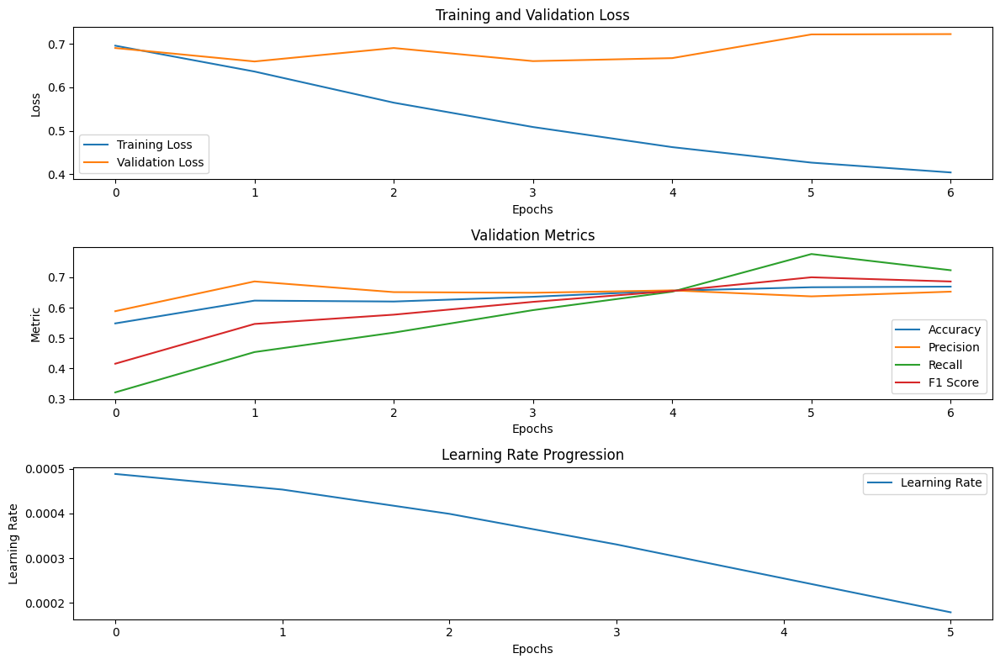

 24%|██▍       | 29/120 [3:36:38<4:44:01, 187.27s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6712 at epoch 1

Epoch 1/100 - Training Loss: 0.6963 - Validation Loss: 0.6712 - Accuracy: 0.5957 - Precision: 0.5769 - Recall: 0.7180 - F1 Score: 0.6397 - Time: 21.99 - Lr: 4.90e-04
New best model with Loss: 0.6362 at epoch 2

Epoch 2/100 - Training Loss: 0.6372 - Validation Loss: 0.6362 - Accuracy: 0.6427 - Precision: 0.6871 - Recall: 0.5240 - F1 Score: 0.5946 - Time: 21.83 - Lr: 4.62e-04
Validation loss did not improve f

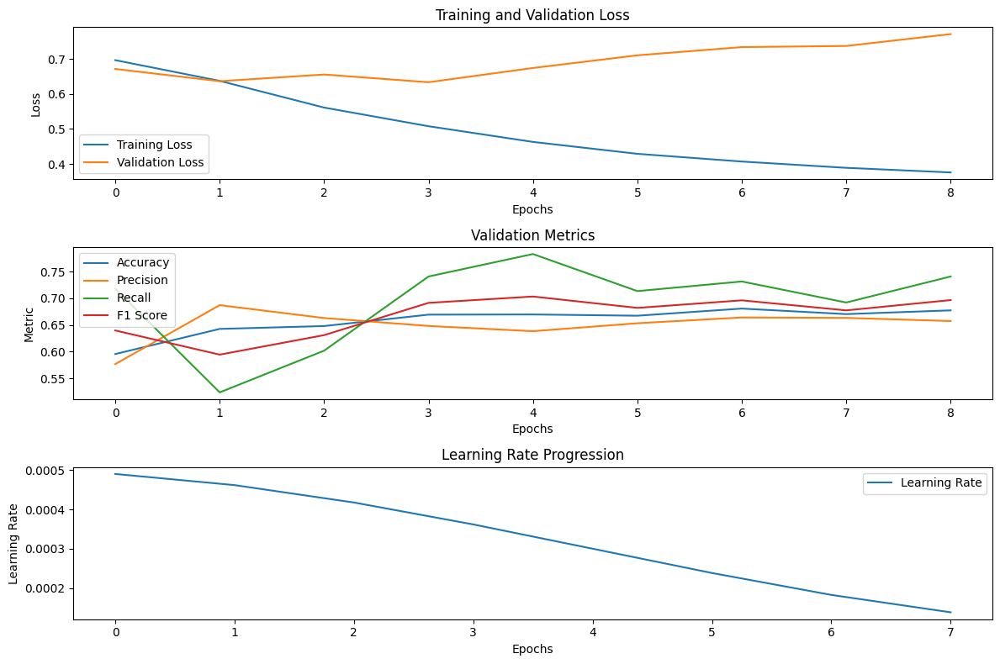

 25%|██▌       | 30/120 [3:39:56<4:45:29, 190.33s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.6947 at epoch 1

Epoch 1/100 - Training Loss: 0.6957 - Validation Loss: 0.6947 - Accuracy: 0.5257 - Precision: 0.5137 - Recall: 0.9613 - F1 Score: 0.6696 - Time: 21.95 - Lr: 4.88e-04
New best model with Loss: 0.6486 at epoch 2

Epoch 2/100 - Training Loss: 0.6392 - Validation Loss: 0.6486 - Accuracy: 0.6280 - Precision: 0.6988 - Recall: 0.4500 - F1 Score: 0.5474 - Time: 21.98 - Lr: 4.52e-04
New best model with Loss: 0.6311

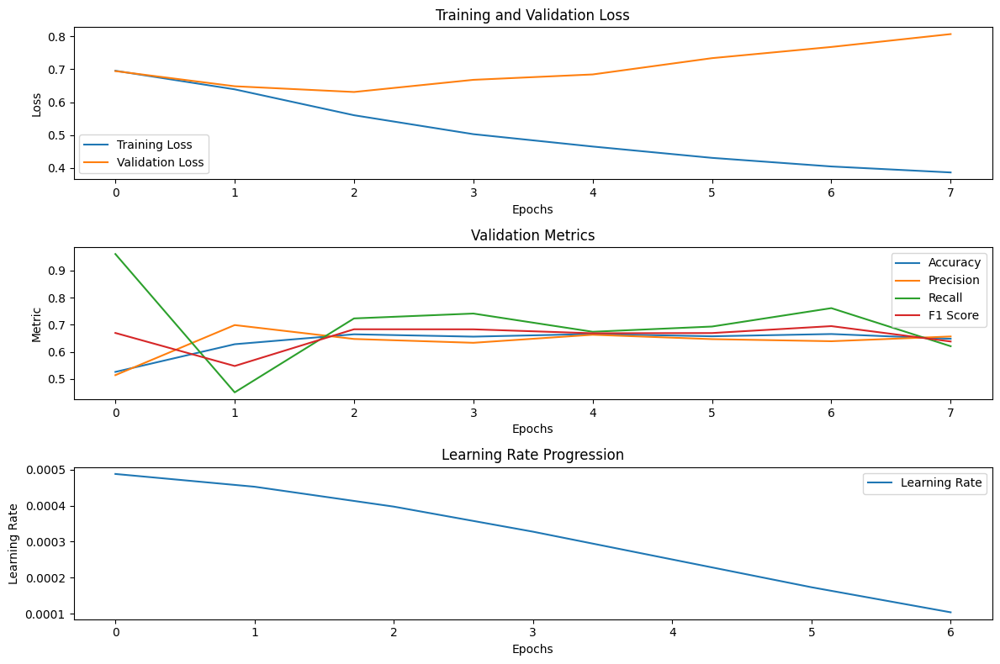

 26%|██▌       | 31/120 [3:42:52<4:36:01, 186.09s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.6838 at epoch 1

Epoch 1/100 - Training Loss: 0.6906 - Validation Loss: 0.6838 - Accuracy: 0.5590 - Precision: 0.5889 - Recall: 0.3907 - F1 Score: 0.4697 - Time: 21.91 - Lr: 4.88e-04
New best model with Loss: 0.6278 at epoch 2

Epoch 2/100 - Training Loss: 0.6242 - Validation Loss: 0.6278 - Accuracy: 0.6573 - Precision: 0.6479 - Recall: 0.6893 - F1 Score: 0.6680 - Time: 21.86 - Lr: 4.53e-04
Validation loss did not improve 

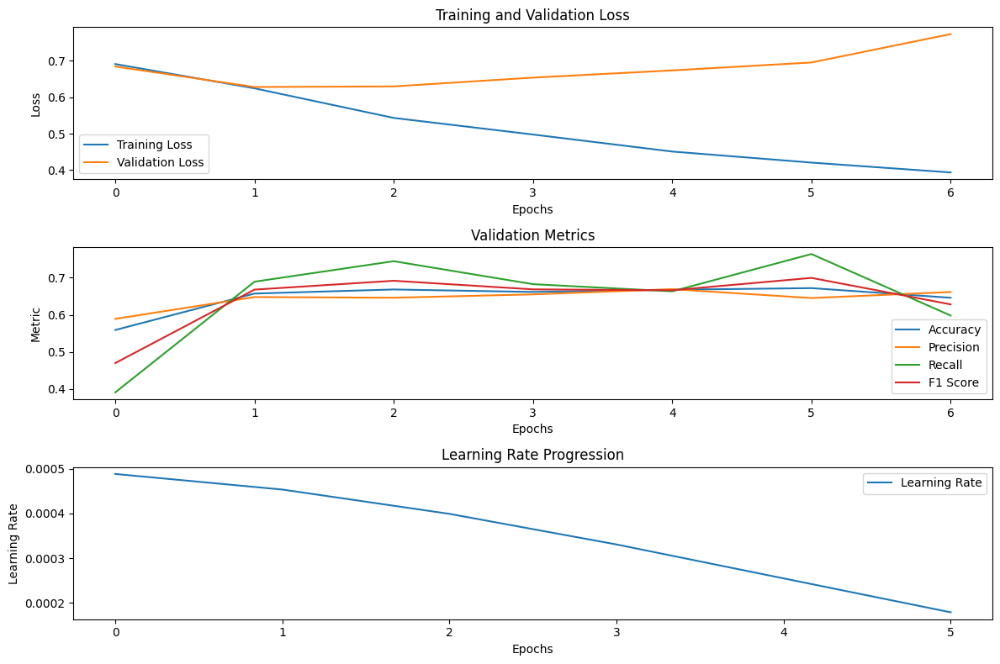

 27%|██▋       | 32/120 [3:45:25<4:18:35, 176.31s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6976 at epoch 1

Epoch 1/100 - Training Loss: 0.6948 - Validation Loss: 0.6976 - Accuracy: 0.5427 - Precision: 0.5247 - Recall: 0.9080 - F1 Score: 0.6650 - Time: 22.06 - Lr: 4.90e-04
New best model with Loss: 0.6412 at epoch 2

Epoch 2/100 - Training Loss: 0.6356 - Validation Loss: 0.6412 - Accuracy: 0.6430 - Precision: 0.6412 - Recall: 0.6493 - F1 Score: 0.6452 - Time: 21.99 - Lr: 4.62e-04
Validation loss did not improve

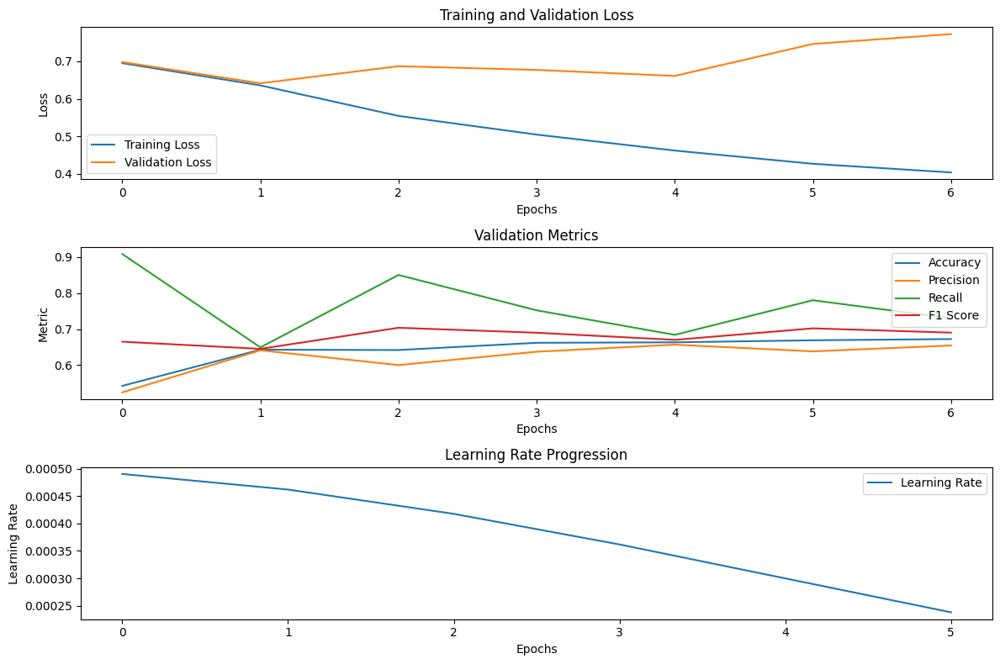

 28%|██▊       | 33/120 [3:48:00<4:06:08, 169.75s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.7016 at epoch 1

Epoch 1/100 - Training Loss: 0.6971 - Validation Loss: 0.7016 - Accuracy: 0.5470 - Precision: 0.5434 - Recall: 0.5887 - F1 Score: 0.5651 - Time: 22.00 - Lr: 4.88e-04
New best model with Loss: 0.6242 at epoch 2

Epoch 2/100 - Training Loss: 0.6368 - Validation Loss: 0.6242 - Accuracy: 0.6627 - Precision: 0.6533 - Recall: 0.6933 - F1 Score: 0.6727 - Time: 22.00 - Lr: 4.52e-04
Validation loss did not improve 

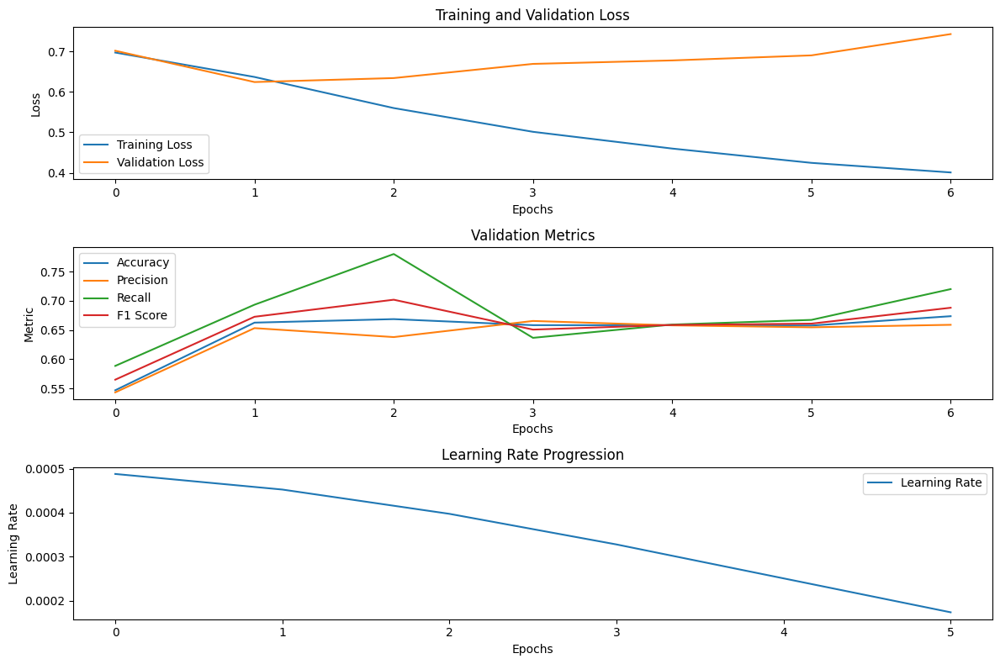

 28%|██▊       | 34/120 [3:50:33<3:56:20, 164.89s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.6655 at epoch 1

Epoch 1/100 - Training Loss: 0.6945 - Validation Loss: 0.6655 - Accuracy: 0.6040 - Precision: 0.5816 - Recall: 0.7413 - F1 Score: 0.6518 - Time: 21.99 - Lr: 4.88e-04
New best model with Loss: 0.6256 at epoch 2

Epoch 2/100 - Training Loss: 0.6299 - Validation Loss: 0.6256 - Accuracy: 0.6533 - Precision: 0.6565 - Recall: 0.6433 - F1 Score: 0.6498 - Time: 21.94 - Lr: 4.53e-04
Validation loss did not improve fo

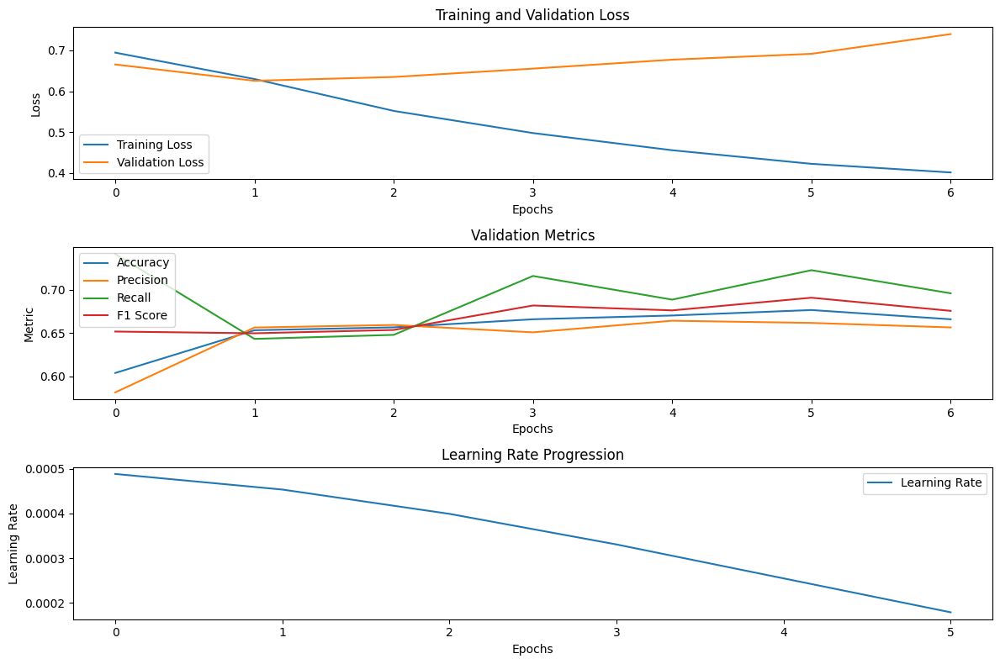

 29%|██▉       | 35/120 [3:53:08<3:49:05, 161.71s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6878 at epoch 1

Epoch 1/100 - Training Loss: 0.6965 - Validation Loss: 0.6878 - Accuracy: 0.5337 - Precision: 0.5189 - Recall: 0.9233 - F1 Score: 0.6644 - Time: 21.96 - Lr: 4.90e-04
New best model with Loss: 0.6327 at epoch 2

Epoch 2/100 - Training Loss: 0.6457 - Validation Loss: 0.6327 - Accuracy: 0.6527 - Precision: 0.6269 - Recall: 0.7540 - F1 Score: 0.6846 - Time: 22.00 - Lr: 4.62e-04
Validation loss did not improve f

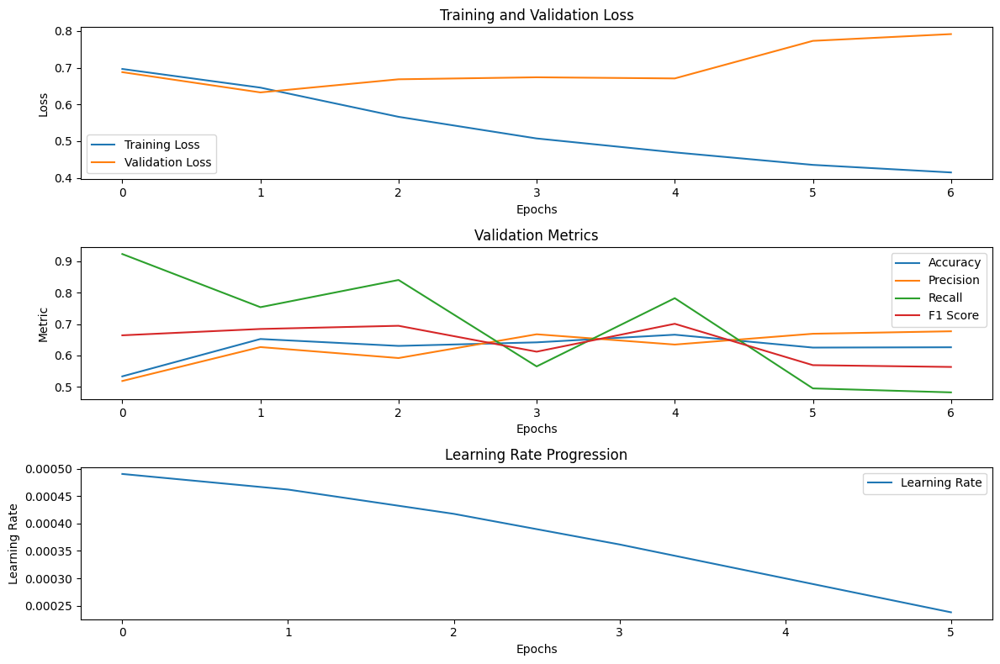

 30%|███       | 36/120 [3:55:41<3:43:05, 159.35s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.6403 at epoch 1

Epoch 1/100 - Training Loss: 0.6860 - Validation Loss: 0.6403 - Accuracy: 0.6350 - Precision: 0.6141 - Recall: 0.7267 - F1 Score: 0.6656 - Time: 21.79 - Lr: 9.76e-04
New best model with Loss: 0.6307 at epoch 2

Epoch 2/100 - Training Loss: 0.5966 - Validation Loss: 0.6307 - Accuracy: 0.6577 - Precision: 0.6625 - Recall: 0.6427 - F1 Score: 0.6525 - Time: 21.71 - Lr: 9.05e-04
Validation loss did not improve fo

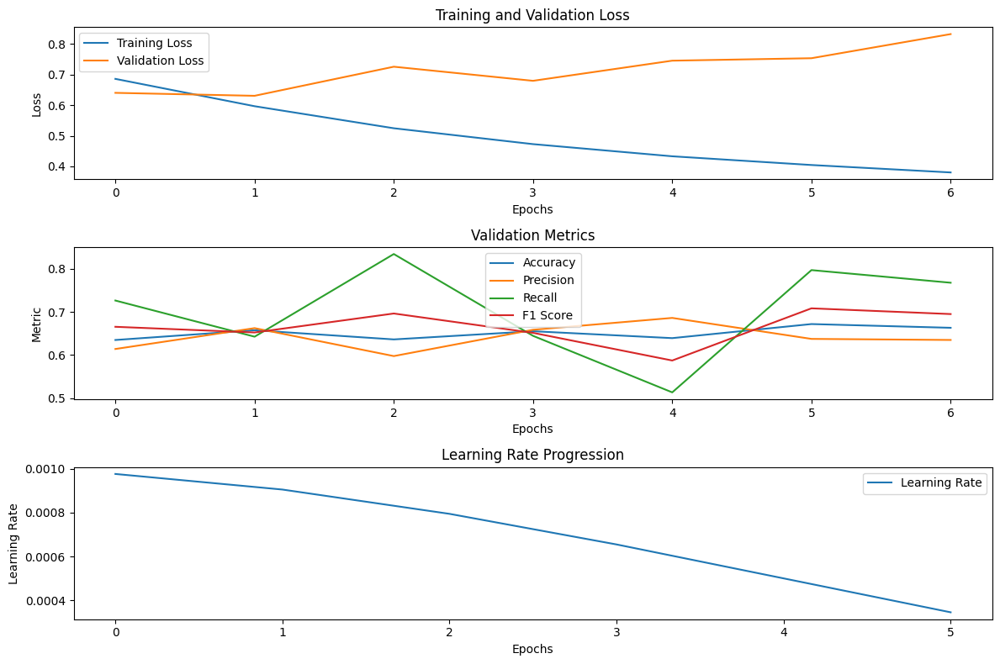

 31%|███       | 37/120 [3:58:15<3:38:01, 157.61s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.6530 at epoch 1

Epoch 1/100 - Training Loss: 0.6854 - Validation Loss: 0.6530 - Accuracy: 0.6210 - Precision: 0.5913 - Recall: 0.7840 - F1 Score: 0.6741 - Time: 22.03 - Lr: 9.76e-04
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.5917 - Validation Loss: 0.6722 - Accuracy: 0.6330 - Precision: 0.6809 - Recall: 0.5007 - F1 Score: 0.5770 - Time: 22.00 - Lr: 9.05e-04
Validation loss did not improve 

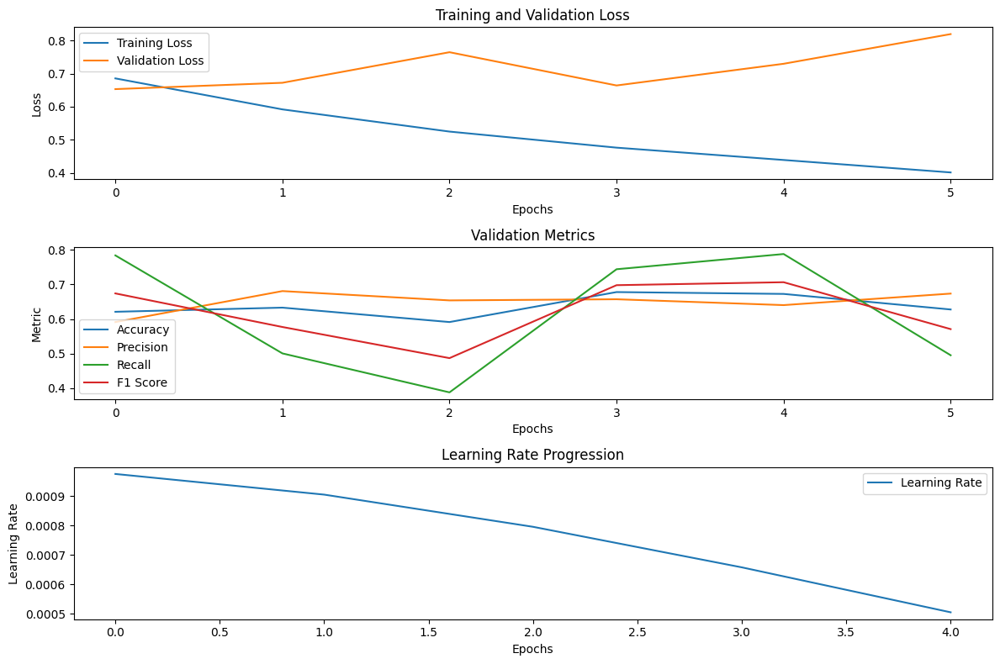

 32%|███▏      | 38/120 [4:00:27<3:25:02, 150.03s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.7840 at epoch 1

Epoch 1/100 - Training Loss: 0.6951 - Validation Loss: 0.7840 - Accuracy: 0.5457 - Precision: 0.6290 - Recall: 0.2227 - F1 Score: 0.3289 - Time: 22.02 - Lr: 9.78e-04
New best model with Loss: 0.7039 at epoch 2

Epoch 2/100 - Training Loss: 0.6115 - Validation Loss: 0.7039 - Accuracy: 0.5973 - Precision: 0.6759 - Recall: 0.3740 - F1 Score: 0.4815 - Time: 21.90 - Lr: 9.14e-04
Validation loss did not improve for

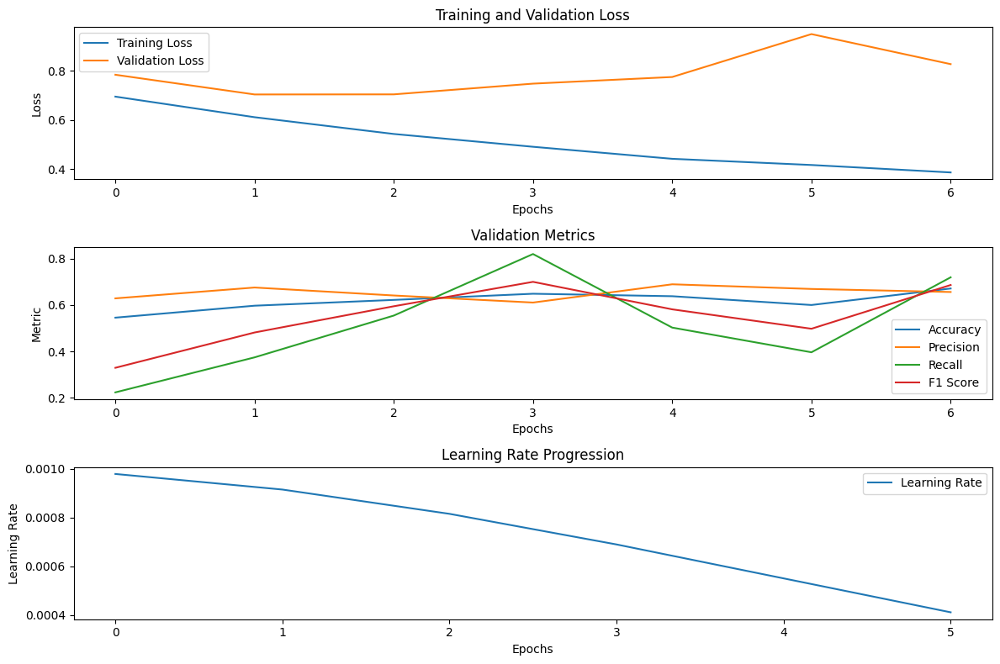

 32%|███▎      | 39/120 [4:03:01<3:23:58, 151.10s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.7958 at epoch 1

Epoch 1/100 - Training Loss: 0.6823 - Validation Loss: 0.7958 - Accuracy: 0.5580 - Precision: 0.5333 - Recall: 0.9287 - F1 Score: 0.6775 - Time: 21.93 - Lr: 9.76e-04
New best model with Loss: 0.6554 at epoch 2

Epoch 2/100 - Training Loss: 0.5962 - Validation Loss: 0.6554 - Accuracy: 0.6583 - Precision: 0.6737 - Recall: 0.6140 - F1 Score: 0.6425 - Time: 22.03 - Lr: 9.05e-04
Validation loss did not improve for

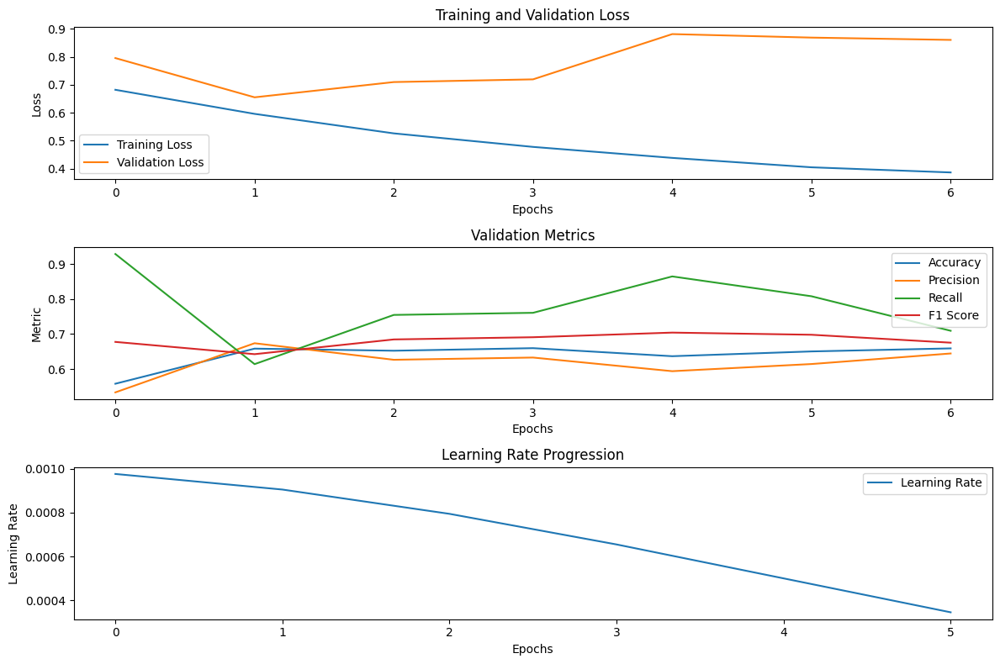

 33%|███▎      | 40/120 [4:05:35<3:22:46, 152.08s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.6739 at epoch 1

Epoch 1/100 - Training Loss: 0.6883 - Validation Loss: 0.6739 - Accuracy: 0.6117 - Precision: 0.5787 - Recall: 0.8207 - F1 Score: 0.6788 - Time: 22.06 - Lr: 9.76e-04
New best model with Loss: 0.6267 at epoch 2

Epoch 2/100 - Training Loss: 0.6006 - Validation Loss: 0.6267 - Accuracy: 0.6507 - Precision: 0.6702 - Recall: 0.5933 - F1 Score: 0.6294 - Time: 21.96 - Lr: 9.05e-04
Validation loss did not improve for 

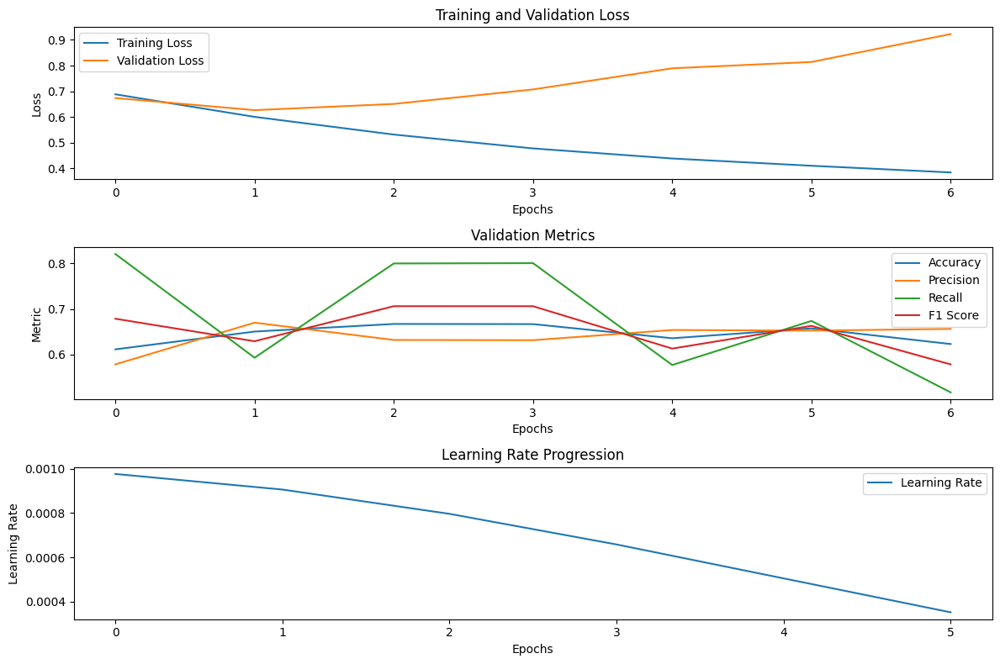

 34%|███▍      | 41/120 [4:08:09<3:20:57, 152.62s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6933 at epoch 1

Epoch 1/100 - Training Loss: 0.6941 - Validation Loss: 0.6933 - Accuracy: 0.5740 - Precision: 0.5502 - Recall: 0.8107 - F1 Score: 0.6555 - Time: 21.83 - Lr: 9.78e-04
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6121 - Validation Loss: 0.7107 - Accuracy: 0.5837 - Precision: 0.6916 - Recall: 0.3020 - F1 Score: 0.4204 - Time: 21.98 - Lr: 9.14e-04
New best model with Loss: 0.657

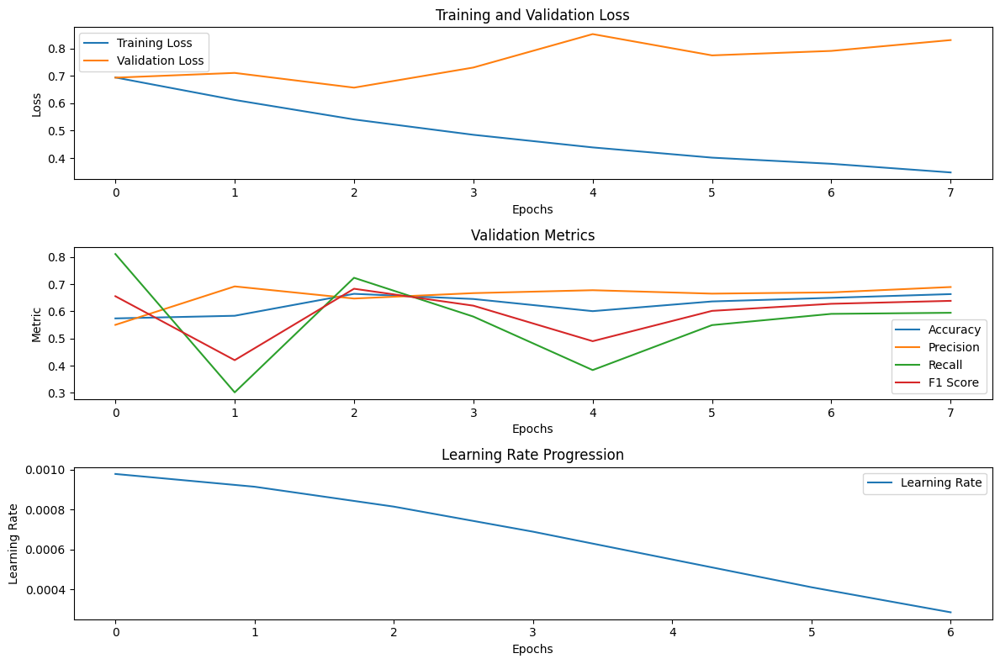

 35%|███▌      | 42/120 [4:11:05<3:27:37, 159.71s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.6621 at epoch 1

Epoch 1/100 - Training Loss: 0.6875 - Validation Loss: 0.6621 - Accuracy: 0.6070 - Precision: 0.5797 - Recall: 0.7780 - F1 Score: 0.6644 - Time: 21.99 - Lr: 9.76e-04
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.5982 - Validation Loss: 0.7531 - Accuracy: 0.6203 - Precision: 0.5808 - Recall: 0.8647 - F1 Score: 0.6949 - Time: 22.02 - Lr: 9.05e-04
Validation loss did not improv

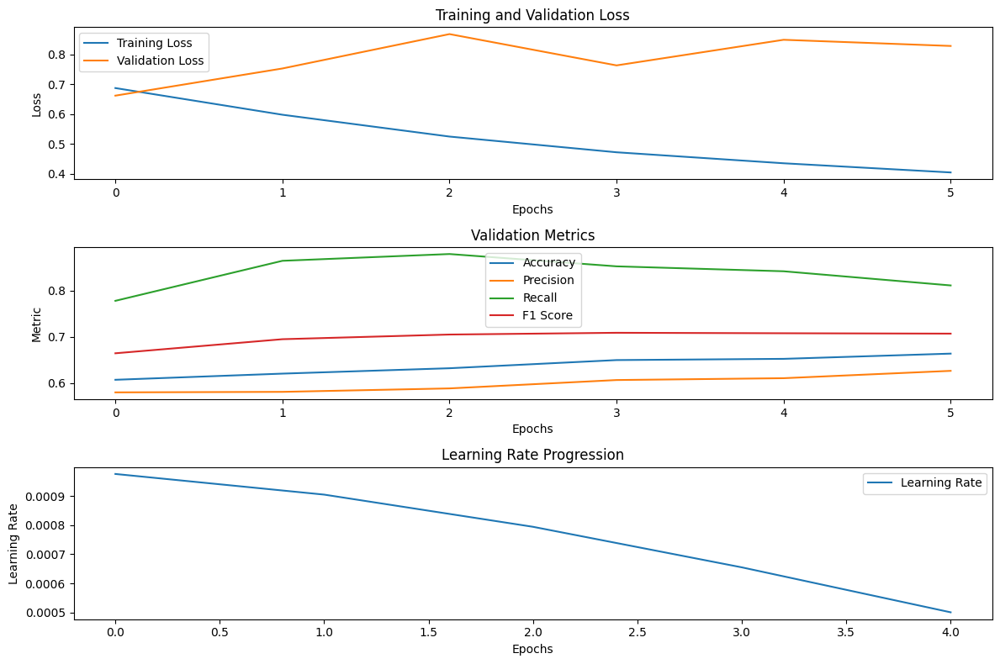

 36%|███▌      | 43/120 [4:13:18<3:14:23, 151.47s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.6419 at epoch 1

Epoch 1/100 - Training Loss: 0.6832 - Validation Loss: 0.6419 - Accuracy: 0.6337 - Precision: 0.6046 - Recall: 0.7727 - F1 Score: 0.6784 - Time: 21.89 - Lr: 9.76e-04
New best model with Loss: 0.6334 at epoch 2

Epoch 2/100 - Training Loss: 0.6015 - Validation Loss: 0.6334 - Accuracy: 0.6577 - Precision: 0.6323 - Recall: 0.7533 - F1 Score: 0.6876 - Time: 21.80 - Lr: 9.05e-04
Validation loss did not improve fo

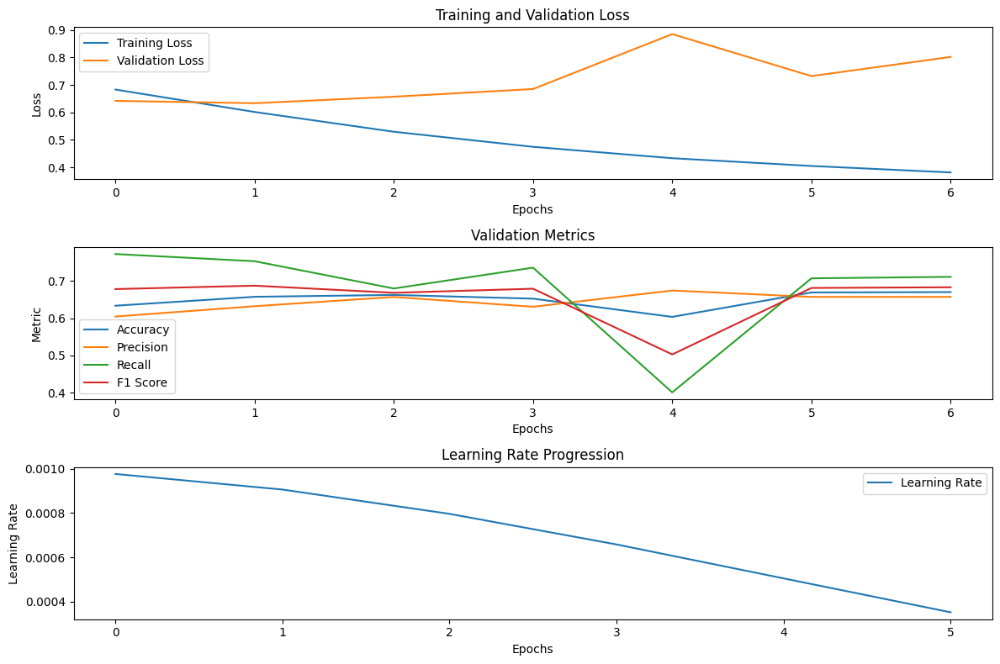

 37%|███▋      | 44/120 [4:15:51<3:12:42, 152.14s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.7109 at epoch 1

Epoch 1/100 - Training Loss: 0.6885 - Validation Loss: 0.7109 - Accuracy: 0.5703 - Precision: 0.6656 - Recall: 0.2827 - F1 Score: 0.3968 - Time: 22.01 - Lr: 9.78e-04
New best model with Loss: 0.6368 at epoch 2

Epoch 2/100 - Training Loss: 0.6082 - Validation Loss: 0.6368 - Accuracy: 0.6547 - Precision: 0.6321 - Recall: 0.7400 - F1 Score: 0.6818 - Time: 21.98 - Lr: 9.14e-04
Validation loss did not improve f

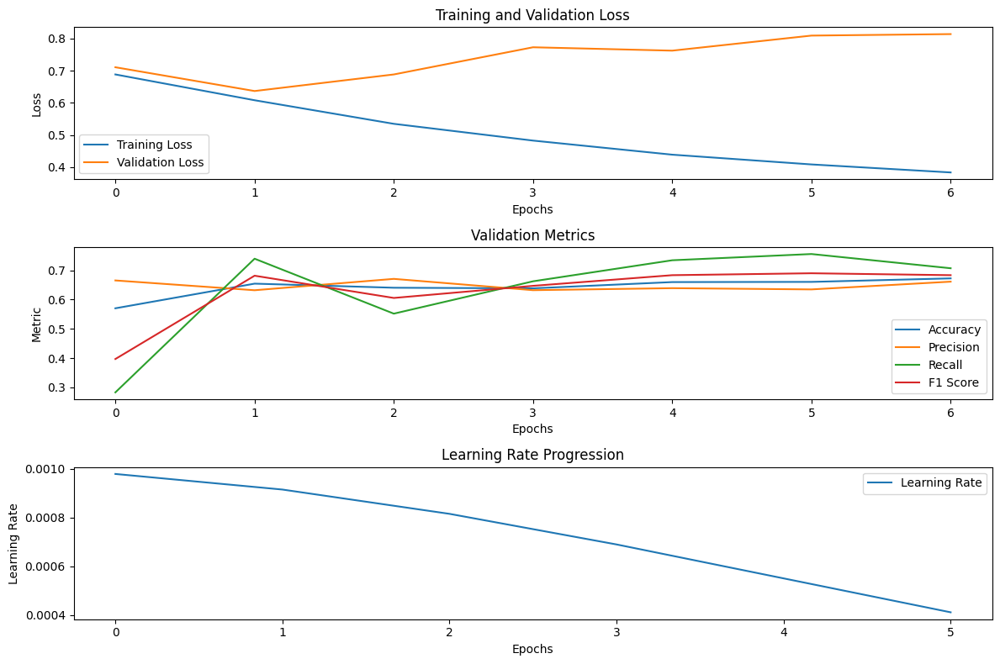

 38%|███▊      | 45/120 [4:18:26<3:11:06, 152.88s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.8290 at epoch 1

Epoch 1/100 - Training Loss: 0.6877 - Validation Loss: 0.8290 - Accuracy: 0.5553 - Precision: 0.5325 - Recall: 0.9053 - F1 Score: 0.6706 - Time: 22.01 - Lr: 9.76e-04
New best model with Loss: 0.7262 at epoch 2

Epoch 2/100 - Training Loss: 0.6000 - Validation Loss: 0.7262 - Accuracy: 0.5947 - Precision: 0.6547 - Recall: 0.4007 - F1 Score: 0.4971 - Time: 21.91 - Lr: 9.05e-04
Validation loss did not improve fo

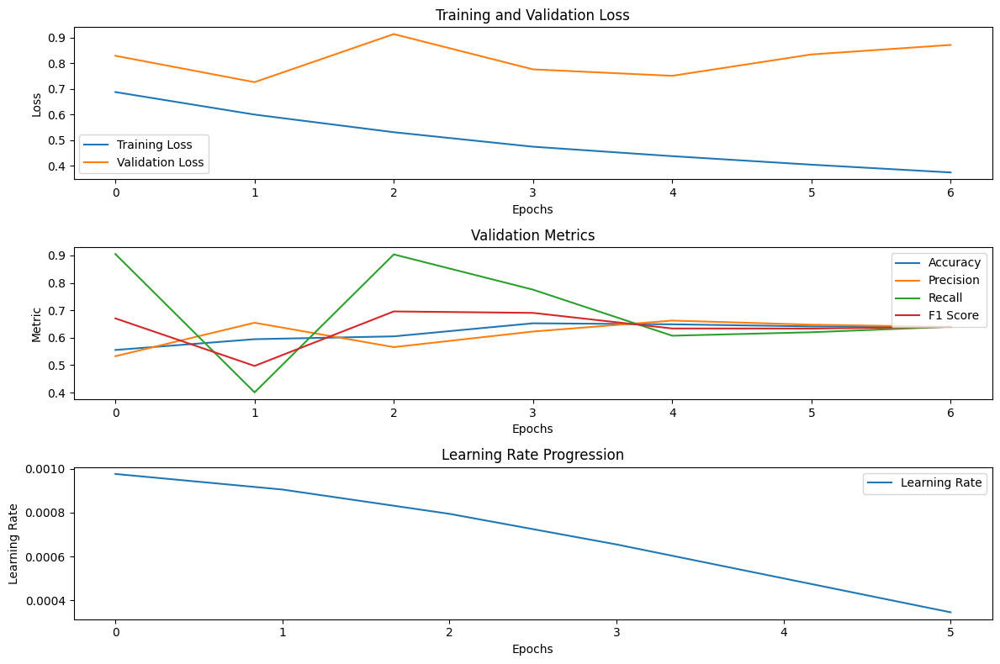

 38%|███▊      | 46/120 [4:21:00<3:08:48, 153.08s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.6959 at epoch 1

Epoch 1/100 - Training Loss: 0.6919 - Validation Loss: 0.6959 - Accuracy: 0.6027 - Precision: 0.6008 - Recall: 0.6120 - F1 Score: 0.6063 - Time: 21.90 - Lr: 9.76e-04
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6094 - Validation Loss: 0.7322 - Accuracy: 0.6197 - Precision: 0.5838 - Recall: 0.8340 - F1 Score: 0.6868 - Time: 21.96 - Lr: 9.05e-04
New best model with Loss: 0.6591

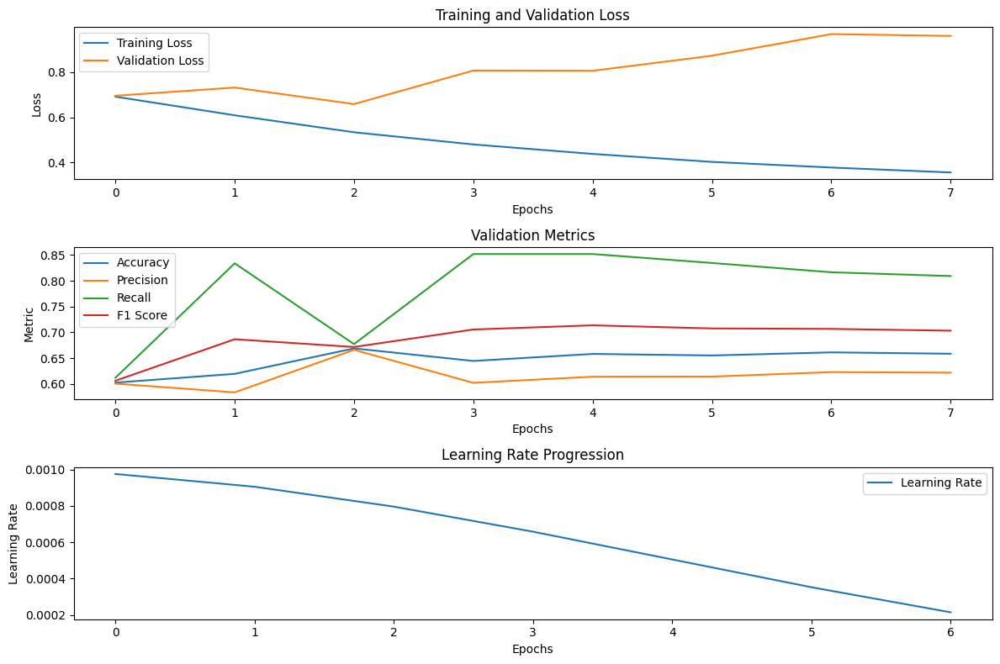

 39%|███▉      | 47/120 [4:23:56<3:14:38, 159.99s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.7202 at epoch 1

Epoch 1/100 - Training Loss: 0.6899 - Validation Loss: 0.7202 - Accuracy: 0.5883 - Precision: 0.5599 - Recall: 0.8260 - F1 Score: 0.6674 - Time: 21.96 - Lr: 9.78e-04
New best model with Loss: 0.6365 at epoch 2

Epoch 2/100 - Training Loss: 0.5992 - Validation Loss: 0.6365 - Accuracy: 0.6603 - Precision: 0.6510 - Recall: 0.6913 - F1 Score: 0.6705 - Time: 21.99 - Lr: 9.14e-04
Validation loss did not improve for

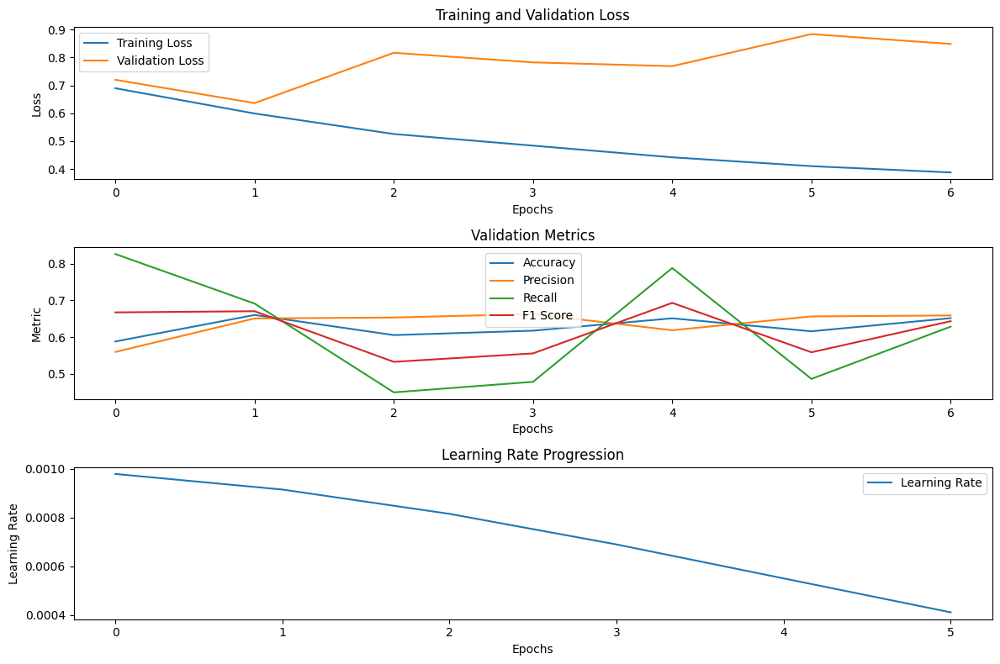

 40%|████      | 48/120 [4:26:29<3:09:40, 158.06s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.6534 at epoch 1

Epoch 1/100 - Training Loss: 0.6856 - Validation Loss: 0.6534 - Accuracy: 0.6357 - Precision: 0.6559 - Recall: 0.5707 - F1 Score: 0.6103 - Time: 21.93 - Lr: 4.88e-03
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6090 - Validation Loss: 0.7864 - Accuracy: 0.5870 - Precision: 0.6752 - Recall: 0.3353 - F1 Score: 0.4481 - Time: 21.90 - Lr: 4.52e-03
Validation loss did not improve

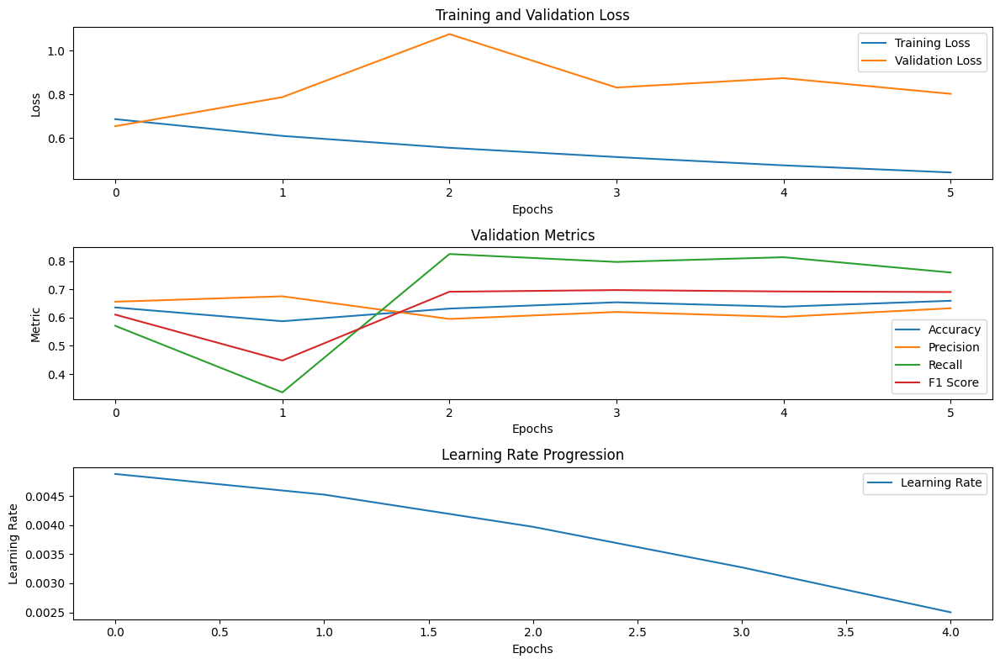

 41%|████      | 49/120 [4:28:41<2:57:48, 150.26s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.7110 at epoch 1

Epoch 1/100 - Training Loss: 0.6875 - Validation Loss: 0.7110 - Accuracy: 0.6193 - Precision: 0.5803 - Recall: 0.8627 - F1 Score: 0.6938 - Time: 22.04 - Lr: 4.88e-03
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6117 - Validation Loss: 0.8365 - Accuracy: 0.6243 - Precision: 0.5837 - Recall: 0.8673 - F1 Score: 0.6978 - Time: 21.95 - Lr: 4.52e-03
Validation loss did not improve 

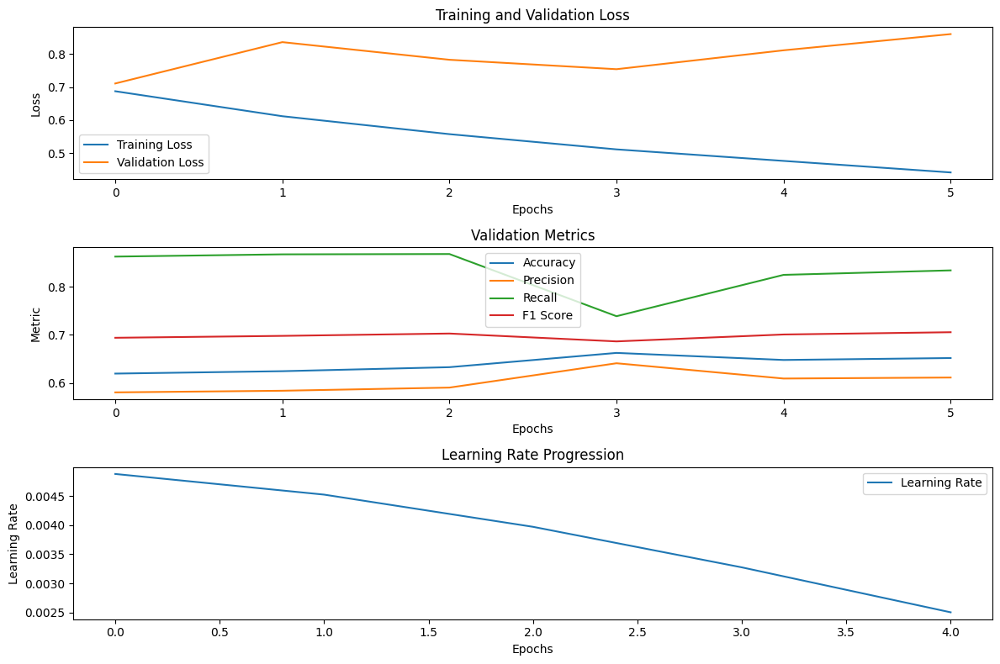

 42%|████▏     | 50/120 [4:30:54<2:49:03, 144.90s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6508 at epoch 1

Epoch 1/100 - Training Loss: 0.6808 - Validation Loss: 0.6508 - Accuracy: 0.6443 - Precision: 0.6235 - Recall: 0.7287 - F1 Score: 0.6720 - Time: 21.89 - Lr: 4.88e-03
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6065 - Validation Loss: 0.8461 - Accuracy: 0.6200 - Precision: 0.5841 - Recall: 0.8333 - F1 Score: 0.6868 - Time: 21.85 - Lr: 4.53e-03
Validation loss did not improve

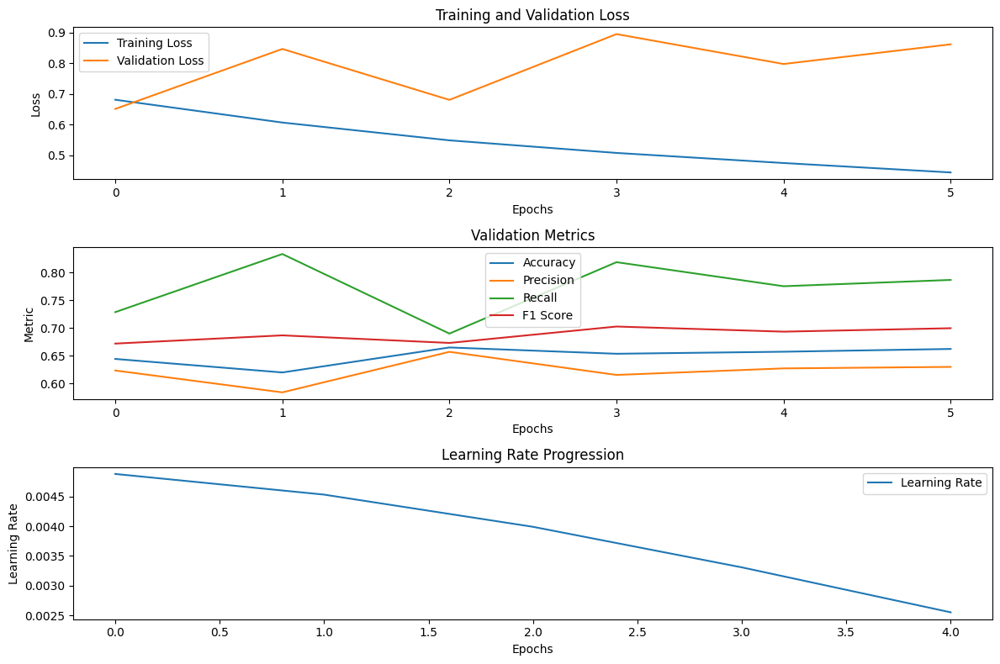

 42%|████▎     | 51/120 [4:33:05<2:42:01, 140.89s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.7352 at epoch 1

Epoch 1/100 - Training Loss: 0.6850 - Validation Loss: 0.7352 - Accuracy: 0.5873 - Precision: 0.5544 - Recall: 0.8900 - F1 Score: 0.6832 - Time: 21.95 - Lr: 4.88e-03
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6122 - Validation Loss: 0.7739 - Accuracy: 0.5903 - Precision: 0.5651 - Recall: 0.7847 - F1 Score: 0.6570 - Time: 22.04 - Lr: 4.52e-03
Validation loss did not improve

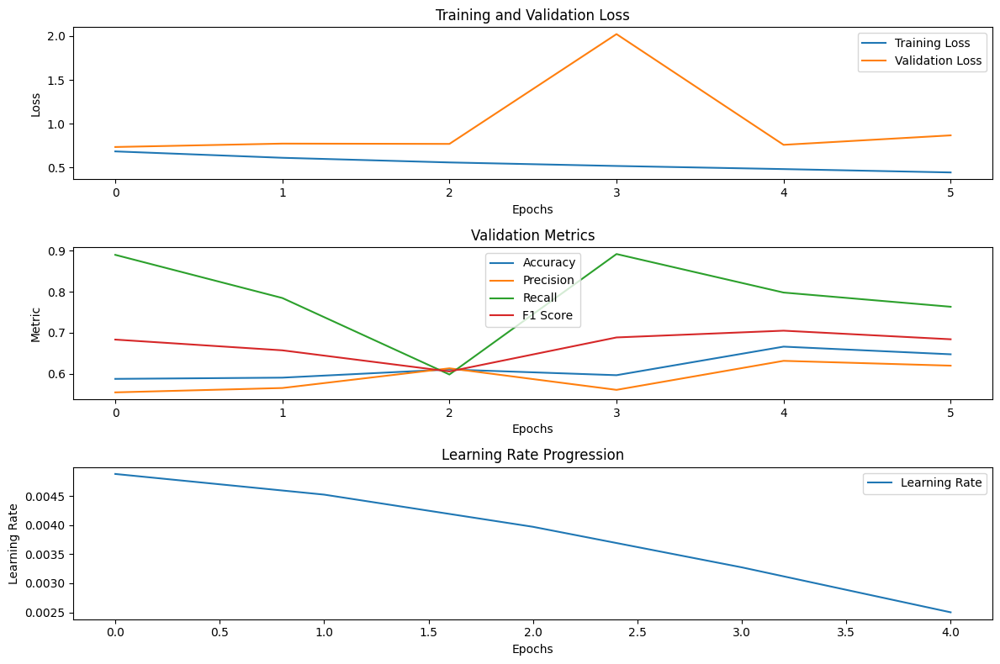

 43%|████▎     | 52/120 [4:35:18<2:36:47, 138.35s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.6426 at epoch 1

Epoch 1/100 - Training Loss: 0.6798 - Validation Loss: 0.6426 - Accuracy: 0.6390 - Precision: 0.6118 - Recall: 0.7607 - F1 Score: 0.6782 - Time: 22.02 - Lr: 4.88e-03
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6027 - Validation Loss: 0.7974 - Accuracy: 0.5637 - Precision: 0.6610 - Recall: 0.2613 - F1 Score: 0.3746 - Time: 22.02 - Lr: 4.52e-03
Validation loss did not improve 

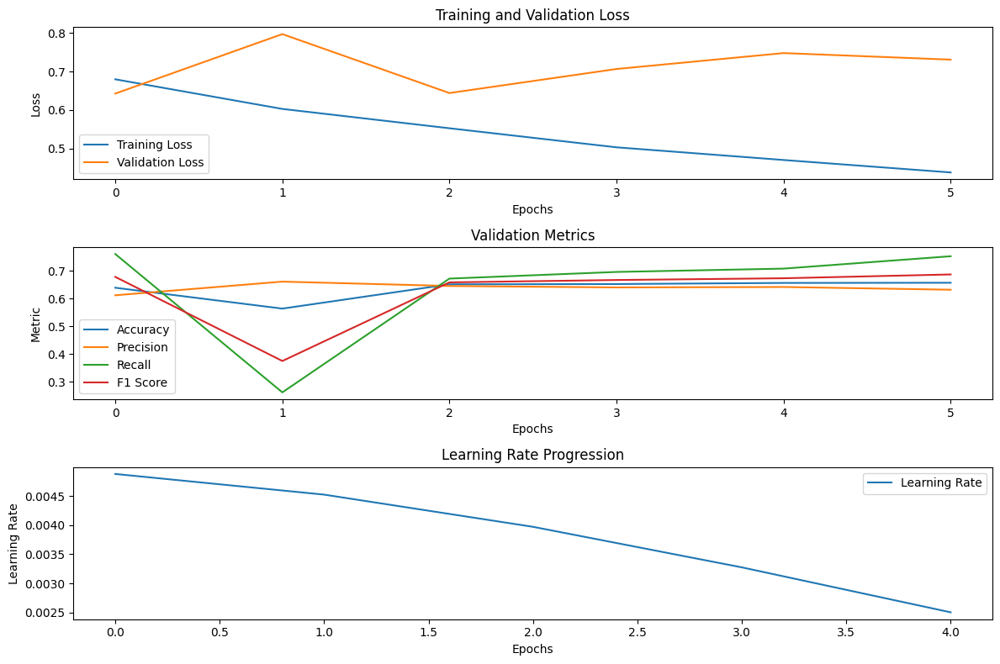

 44%|████▍     | 53/120 [4:37:30<2:32:26, 136.51s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6425 at epoch 1

Epoch 1/100 - Training Loss: 0.6834 - Validation Loss: 0.6425 - Accuracy: 0.6327 - Precision: 0.6287 - Recall: 0.6480 - F1 Score: 0.6382 - Time: 21.89 - Lr: 4.88e-03
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6157 - Validation Loss: 0.7077 - Accuracy: 0.6220 - Precision: 0.5830 - Recall: 0.8573 - F1 Score: 0.6940 - Time: 21.80 - Lr: 4.53e-03
Validation loss did not improve

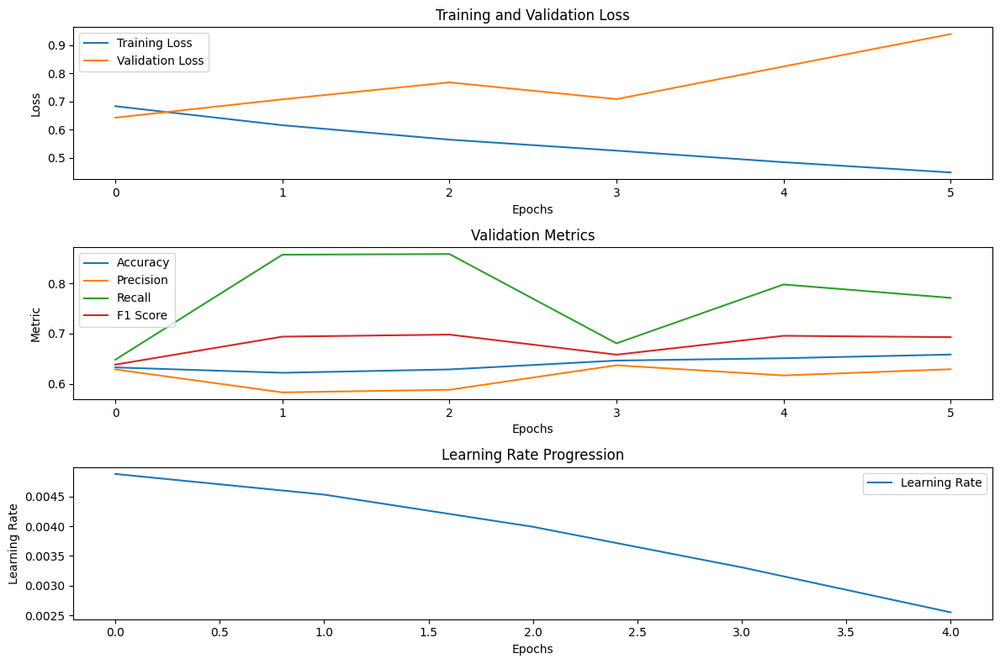

 45%|████▌     | 54/120 [4:39:42<2:28:37, 135.12s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.8038 at epoch 1

Epoch 1/100 - Training Loss: 0.6866 - Validation Loss: 0.8038 - Accuracy: 0.5817 - Precision: 0.5523 - Recall: 0.8620 - F1 Score: 0.6733 - Time: 22.01 - Lr: 4.88e-03
New best model with Loss: 0.6923 at epoch 2

Epoch 2/100 - Training Loss: 0.6034 - Validation Loss: 0.6923 - Accuracy: 0.6437 - Precision: 0.6072 - Recall: 0.8140 - F1 Score: 0.6955 - Time: 21.98 - Lr: 4.52e-03
New best model with Loss: 0.6471 a

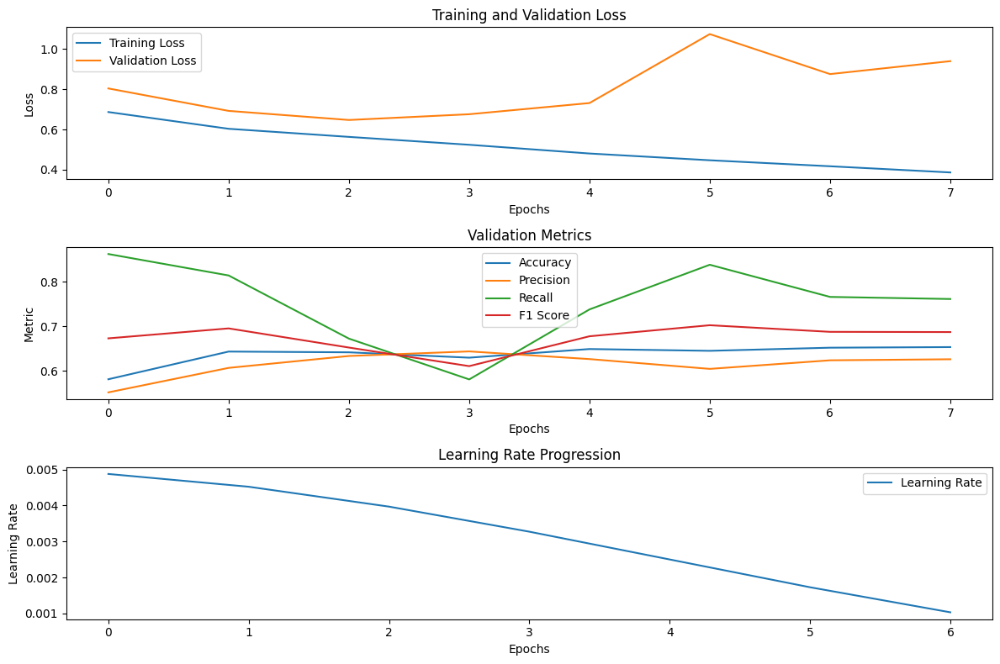

 46%|████▌     | 55/120 [4:42:38<2:39:49, 147.52s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 2.0500 at epoch 1

Epoch 1/100 - Training Loss: 0.6800 - Validation Loss: 2.0500 - Accuracy: 0.5247 - Precision: 0.5130 - Recall: 0.9733 - F1 Score: 0.6719 - Time: 21.99 - Lr: 4.88e-03
New best model with Loss: 0.6928 at epoch 2

Epoch 2/100 - Training Loss: 0.6037 - Validation Loss: 0.6928 - Accuracy: 0.6283 - Precision: 0.6616 - Recall: 0.5253 - F1 Score: 0.5857 - Time: 21.88 - Lr: 4.52e-03
Validation loss did not improve fo

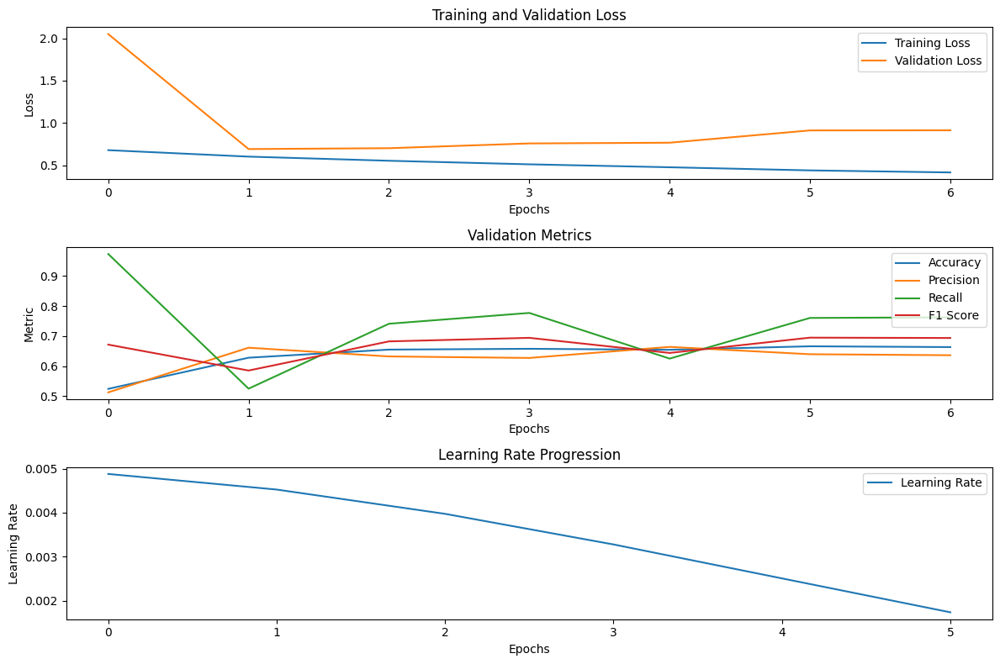

 47%|████▋     | 56/120 [4:45:12<2:39:17, 149.33s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.9165 at epoch 1

Epoch 1/100 - Training Loss: 0.6881 - Validation Loss: 0.9165 - Accuracy: 0.5450 - Precision: 0.6510 - Recall: 0.1940 - F1 Score: 0.2989 - Time: 21.99 - Lr: 4.88e-03
New best model with Loss: 0.6825 at epoch 2

Epoch 2/100 - Training Loss: 0.6023 - Validation Loss: 0.6825 - Accuracy: 0.6507 - Precision: 0.6293 - Recall: 0.7333 - F1 Score: 0.6773 - Time: 22.03 - Lr: 4.53e-03
Validation loss did not improve f

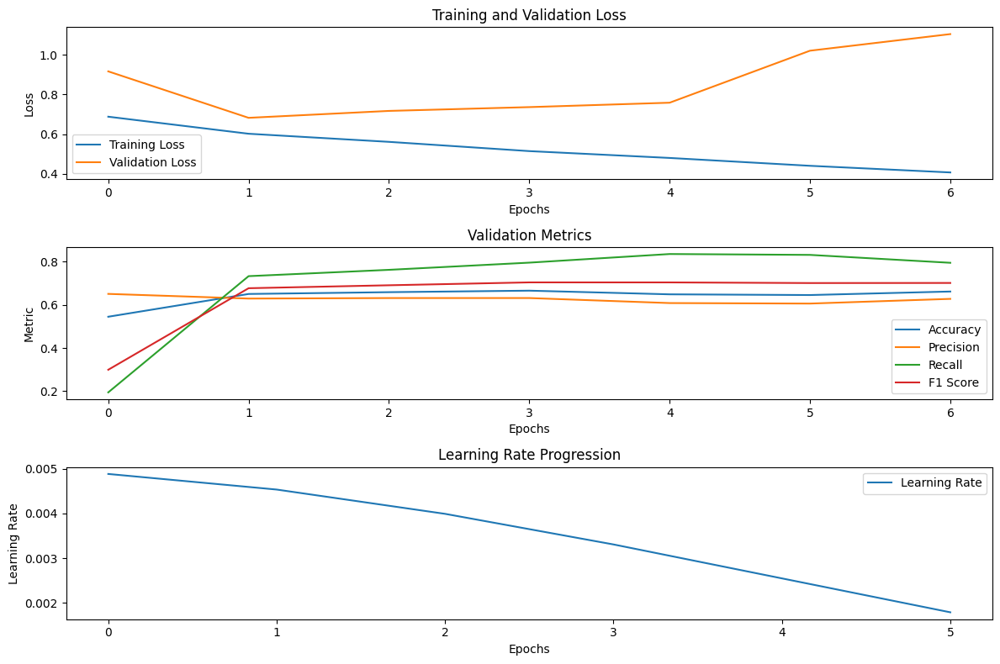

 48%|████▊     | 57/120 [4:47:46<2:38:24, 150.87s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.7380 at epoch 1

Epoch 1/100 - Training Loss: 0.6827 - Validation Loss: 0.7380 - Accuracy: 0.6120 - Precision: 0.5822 - Recall: 0.7933 - F1 Score: 0.6716 - Time: 21.99 - Lr: 4.88e-03
New best model with Loss: 0.6595 at epoch 2

Epoch 2/100 - Training Loss: 0.6062 - Validation Loss: 0.6595 - Accuracy: 0.6590 - Precision: 0.6345 - Recall: 0.7500 - F1 Score: 0.6874 - Time: 21.94 - Lr: 4.52e-03
Validation loss did not improve fo

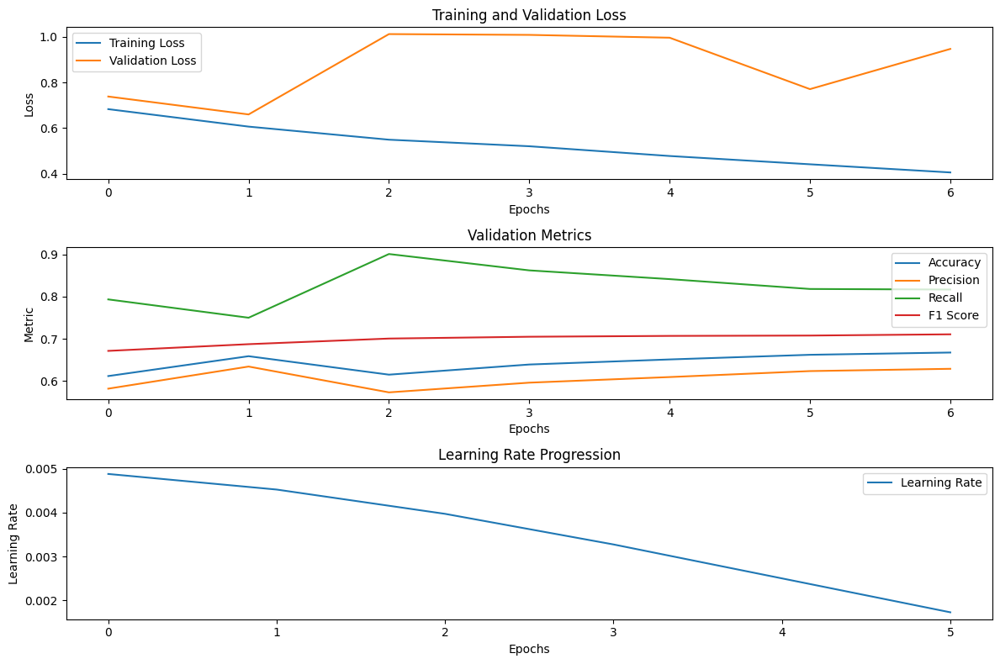

 48%|████▊     | 58/120 [4:50:20<2:36:47, 151.73s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.6438 at epoch 1

Epoch 1/100 - Training Loss: 0.6825 - Validation Loss: 0.6438 - Accuracy: 0.6273 - Precision: 0.5958 - Recall: 0.7920 - F1 Score: 0.6800 - Time: 21.89 - Lr: 4.88e-03
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6054 - Validation Loss: 0.7024 - Accuracy: 0.6390 - Precision: 0.6056 - Recall: 0.7973 - F1 Score: 0.6883 - Time: 21.95 - Lr: 4.52e-03
Validation loss did not improve 

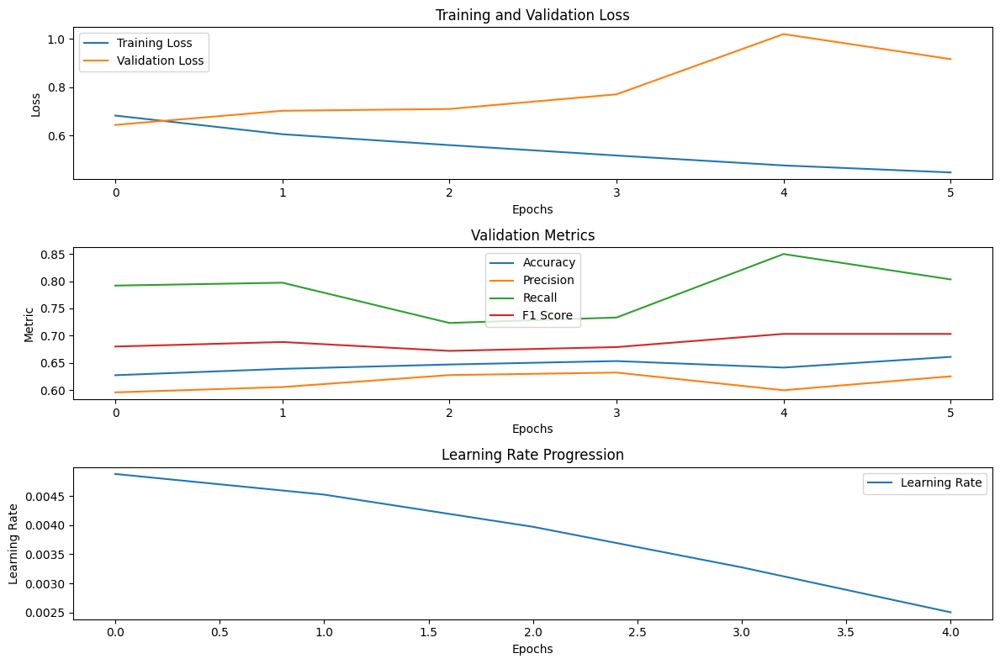

 49%|████▉     | 59/120 [4:52:32<2:28:17, 145.87s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.7109 at epoch 1

Epoch 1/100 - Training Loss: 0.6865 - Validation Loss: 0.7109 - Accuracy: 0.6170 - Precision: 0.6280 - Recall: 0.5740 - F1 Score: 0.5998 - Time: 22.03 - Lr: 4.88e-03
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6048 - Validation Loss: 1.0717 - Accuracy: 0.6010 - Precision: 0.5629 - Recall: 0.9040 - F1 Score: 0.6938 - Time: 22.00 - Lr: 4.53e-03
Validation loss did not improve

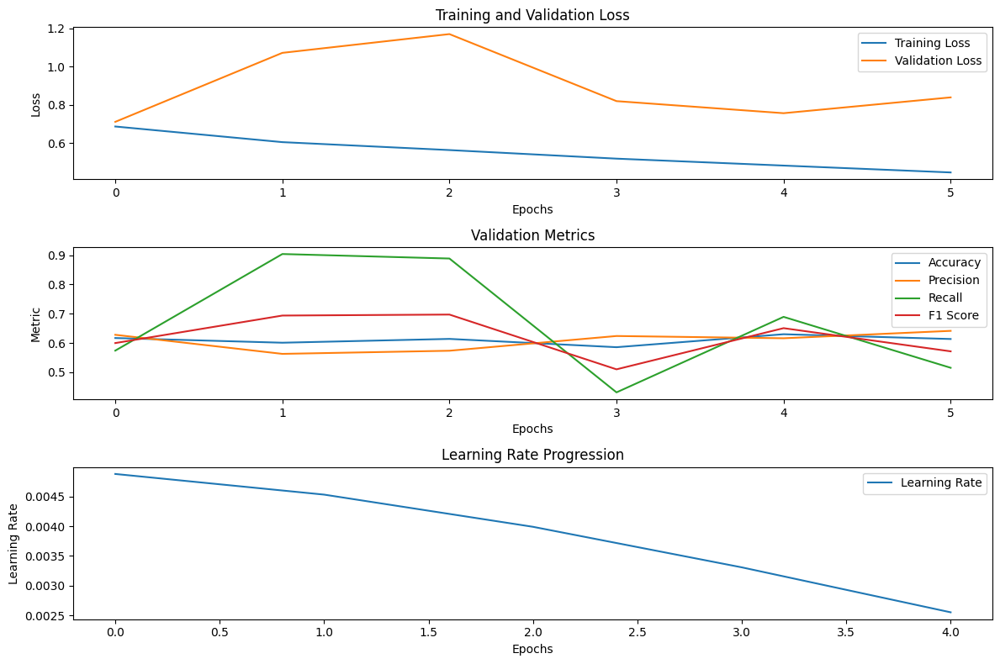

 50%|█████     | 60/120 [4:54:44<2:21:47, 141.79s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.7134 at epoch 1

Epoch 1/100 - Training Loss: 0.6994 - Validation Loss: 0.7134 - Accuracy: 0.5040 - Precision: 0.5112 - Recall: 0.1820 - F1 Score: 0.2684 - Time: 22.09 - Lr: 9.78e-06
New best model with Loss: 0.7109 at epoch 2

Epoch 2/100 - Training Loss: 0.6960 - Validation Loss: 0.7109 - Accuracy: 0.5000 - Precision: 0.5000 - Recall: 0.1553 - F1 Score: 0.2370 - Time: 22.00 - Lr: 9.14e-06
New best model with Los

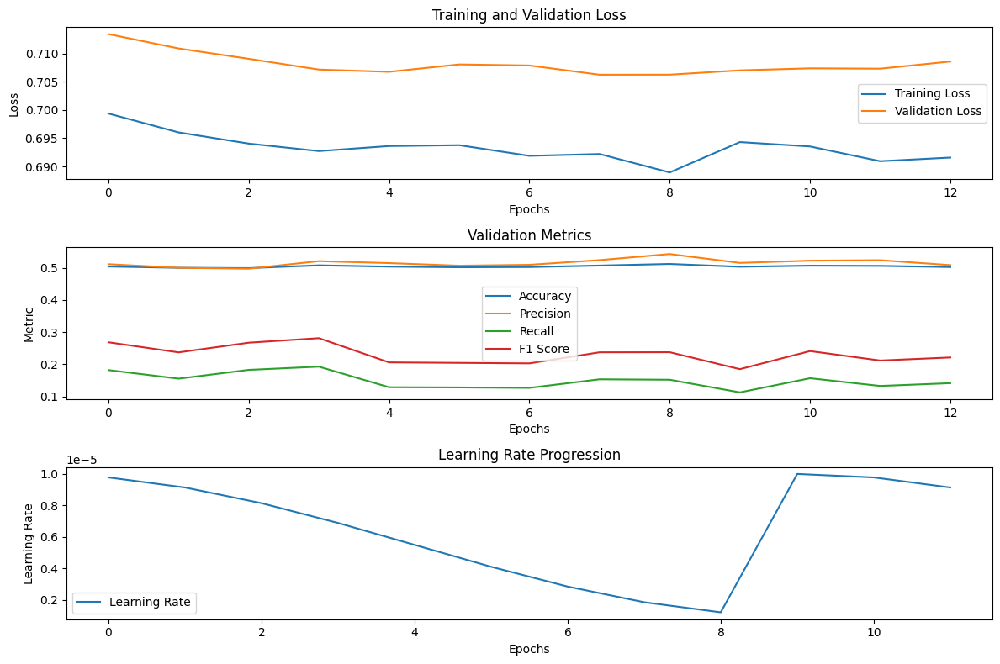

 51%|█████     | 61/120 [4:59:32<3:02:20, 185.43s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.6994 at epoch 1

Epoch 1/100 - Training Loss: 0.7058 - Validation Loss: 0.6994 - Accuracy: 0.4987 - Precision: 0.4946 - Recall: 0.1220 - F1 Score: 0.1957 - Time: 22.18 - Lr: 1.00e-05
New best model with Loss: 0.6954 at epoch 2

Epoch 2/100 - Training Loss: 0.6973 - Validation Loss: 0.6954 - Accuracy: 0.4863 - Precision: 0.4861 - Recall: 0.4767 - F1 Score: 0.4813 - Time: 22.10 - Lr: 1.00e-05
New best mod

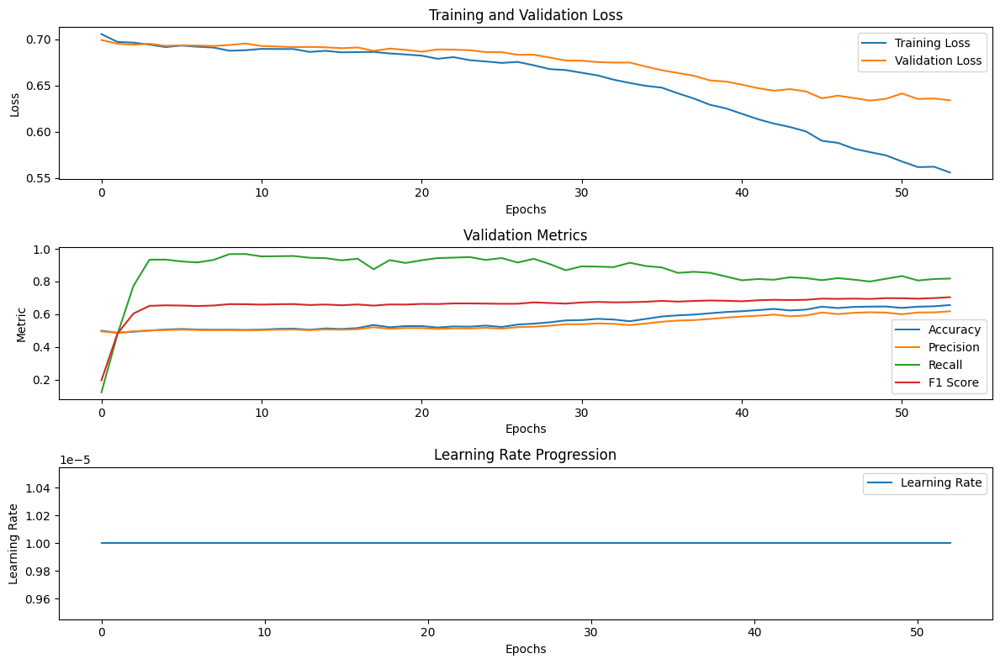

 52%|█████▏    | 62/120 [5:19:25<7:51:26, 487.69s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6975 at epoch 1

Epoch 1/100 - Training Loss: 0.7023 - Validation Loss: 0.6975 - Accuracy: 0.5013 - Precision: 0.5010 - Recall: 0.6413 - F1 Score: 0.5626 - Time: 21.97 - Lr: 1.22e-05
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6992 - Validation Loss: 0.6987 - Accuracy: 0.5037 - Precision: 0.5044 - Recall: 0.4213 - F1 Score: 0.4591 - Time: 21.94 - Lr: 1.86e-05
Validat

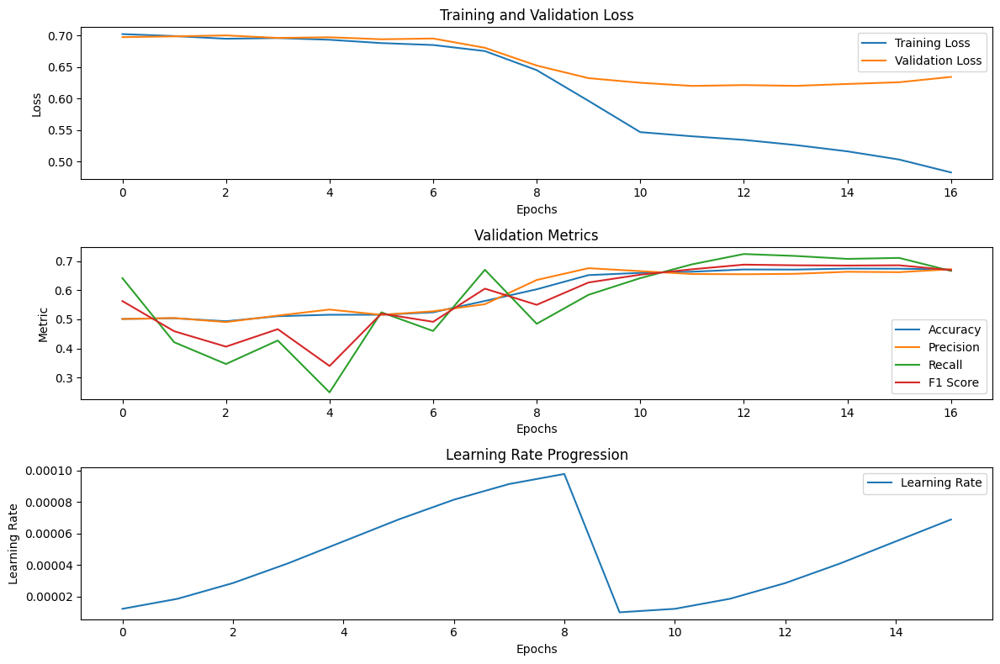

 52%|█████▎    | 63/120 [5:25:40<7:11:23, 454.09s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.7007 at epoch 1

Epoch 1/100 - Training Loss: 0.7117 - Validation Loss: 0.7007 - Accuracy: 0.4953 - Precision: 0.3833 - Recall: 0.0153 - F1 Score: 0.0295 - Time: 22.00 - Lr: 9.78e-06
New best model with Loss: 0.6940 at epoch 2

Epoch 2/100 - Training Loss: 0.6993 - Validation Loss: 0.6940 - Accuracy: 0.5010 - Precision: 0.5017 - Recall: 0.2927 - F1 Score: 0.3697 - Time: 21.97 - Lr: 9.14e-06
New best mo

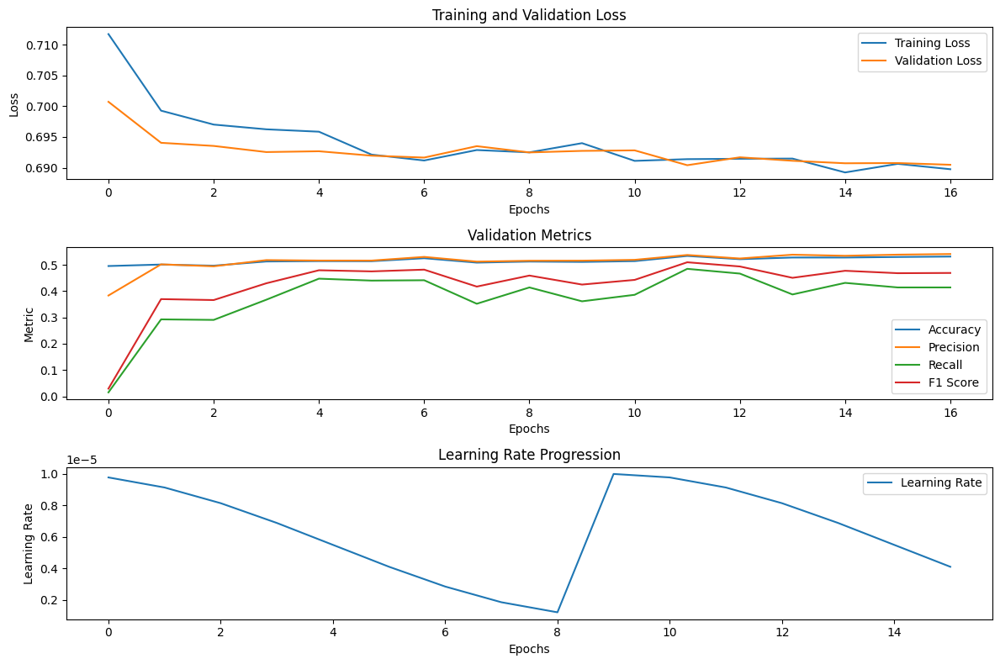

 53%|█████▎    | 64/120 [5:31:56<6:41:53, 430.60s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.7030 at epoch 1

Epoch 1/100 - Training Loss: 0.6998 - Validation Loss: 0.7030 - Accuracy: 0.5027 - Precision: 0.5014 - Recall: 0.9747 - F1 Score: 0.6621 - Time: 21.92 - Lr: 1.00e-05
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6960 - Validation Loss: 0.7043 - Accuracy: 0.4997 - Precision: 0.4998 - Recall: 0.9507 - F1 Score: 0.6552 - Time: 22.04 - Lr: 1.00e-05
New best

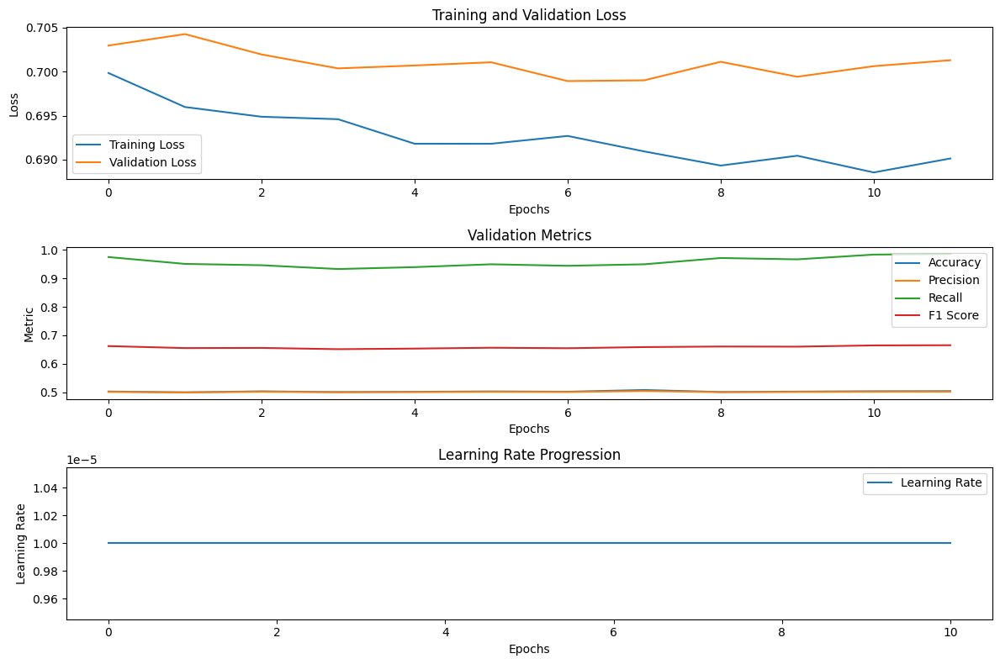

 54%|█████▍    | 65/120 [5:36:22<5:49:19, 381.09s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6940 at epoch 1

Epoch 1/100 - Training Loss: 0.6980 - Validation Loss: 0.6940 - Accuracy: 0.5007 - Precision: 0.5005 - Recall: 0.6313 - F1 Score: 0.5584 - Time: 22.11 - Lr: 1.22e-05
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6949 - Validation Loss: 0.6943 - Accuracy: 0.5070 - Precision: 0.5046 - Recall: 0.7760 - F1 Score: 0.6115 - Time: 22.02 - Lr: 1.86e-05
Validat

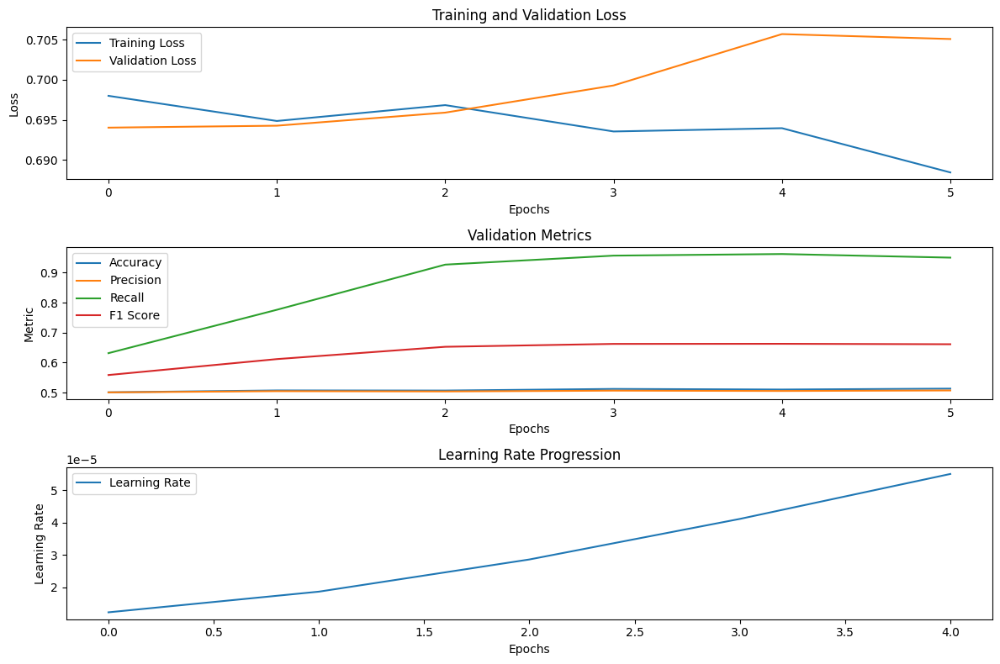

 55%|█████▌    | 66/120 [5:38:34<4:35:48, 306.46s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.6990 at epoch 1

Epoch 1/100 - Training Loss: 0.7033 - Validation Loss: 0.6990 - Accuracy: 0.5057 - Precision: 0.5030 - Recall: 0.9373 - F1 Score: 0.6547 - Time: 22.14 - Lr: 9.78e-06
New best model with Loss: 0.6955 at epoch 2

Epoch 2/100 - Training Loss: 0.6974 - Validation Loss: 0.6955 - Accuracy: 0.5157 - Precision: 0.5094 - Recall: 0.8487 - F1 Score: 0.6367 - Time: 22.07 - Lr: 9.14e-06
New best m

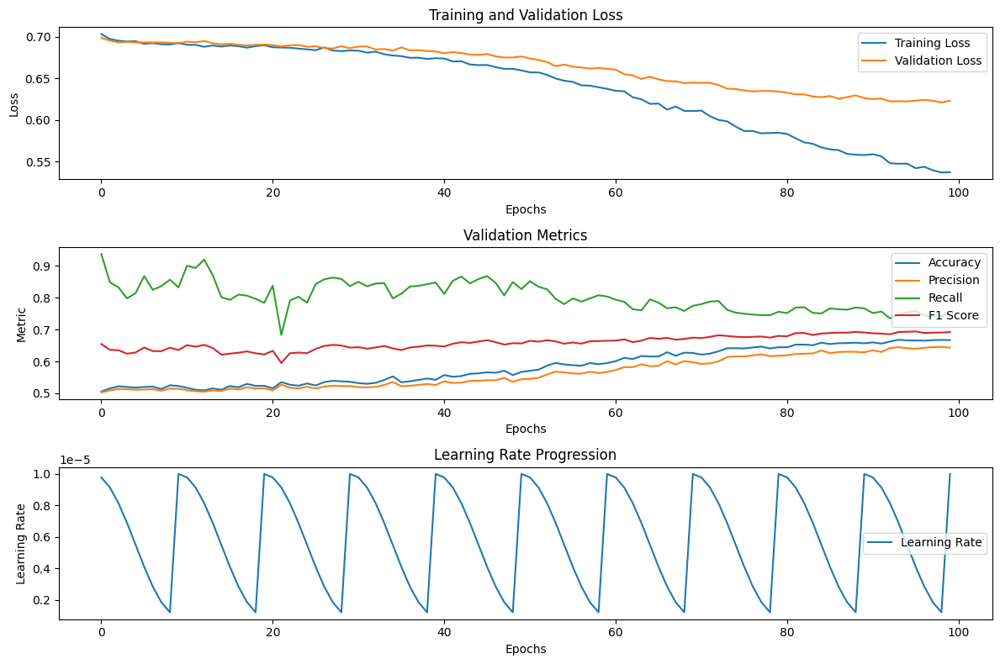

 56%|█████▌    | 67/120 [6:15:24<12:55:07, 877.50s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.7036 at epoch 1

Epoch 1/100 - Training Loss: 0.7056 - Validation Loss: 0.7036 - Accuracy: 0.5057 - Precision: 0.5031 - Recall: 0.9333 - F1 Score: 0.6537 - Time: 22.18 - Lr: 1.00e-05
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6986 - Validation Loss: 0.7037 - Accuracy: 0.5087 - Precision: 0.5048 - Recall: 0.9207 - F1 Score: 0.6520 - Time: 22.20 - Lr: 1.00e-05
Valida

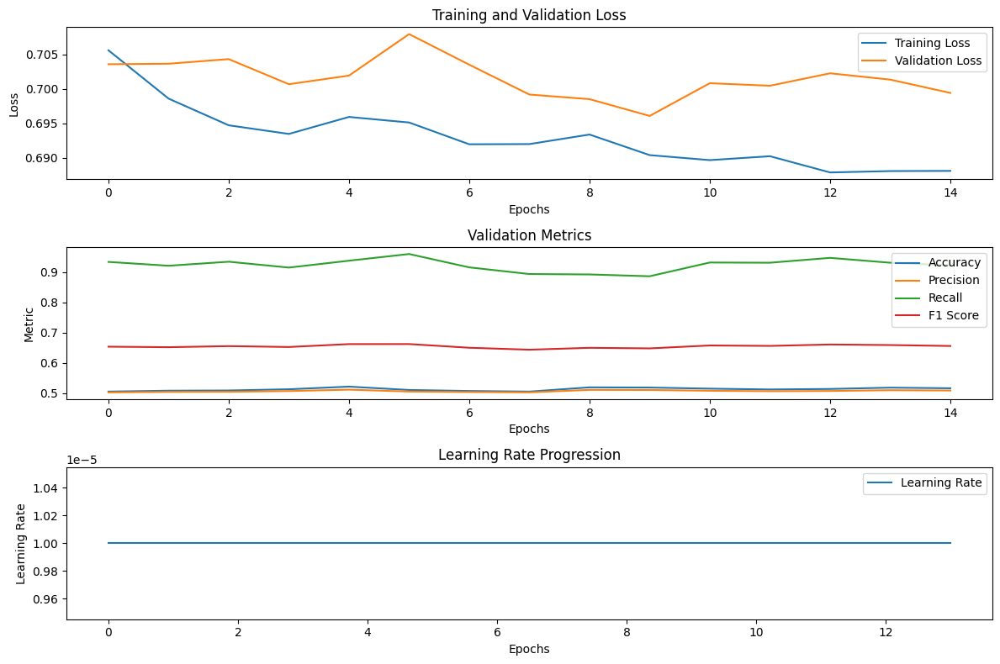

 57%|█████▋    | 68/120 [6:20:56<10:18:36, 713.78s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6954 at epoch 1

Epoch 1/100 - Training Loss: 0.7059 - Validation Loss: 0.6954 - Accuracy: 0.4797 - Precision: 0.4826 - Recall: 0.5653 - F1 Score: 0.5207 - Time: 22.08 - Lr: 1.22e-05
New best model with Loss: 0.6944 at epoch 2

Epoch 2/100 - Training Loss: 0.6984 - Validation Loss: 0.6944 - Accuracy: 0.5037 - Precision: 0.5019 - Recall: 0.9580 - F1 Score: 0.6587 - Time: 22.13 - Lr: 1.86e-05
New best 

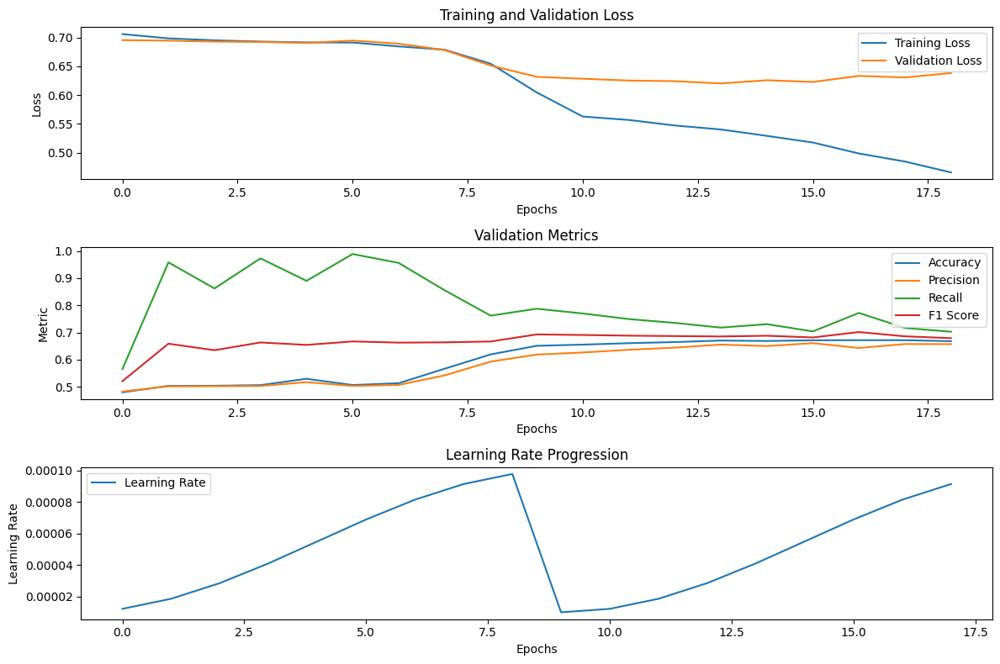

 57%|█████▊    | 69/120 [6:27:56<8:51:47, 625.64s/it] 

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.7009 at epoch 1

Epoch 1/100 - Training Loss: 0.7019 - Validation Loss: 0.7009 - Accuracy: 0.4980 - Precision: 0.4989 - Recall: 0.9253 - F1 Score: 0.6483 - Time: 22.21 - Lr: 9.78e-06
New best model with Loss: 0.7000 at epoch 2

Epoch 2/100 - Training Loss: 0.6996 - Validation Loss: 0.7000 - Accuracy: 0.5030 - Precision: 0.5016 - Recall: 0.9660 - F1 Score: 0.6603 - Time: 22.16 - Lr: 9.14e-06
New best m

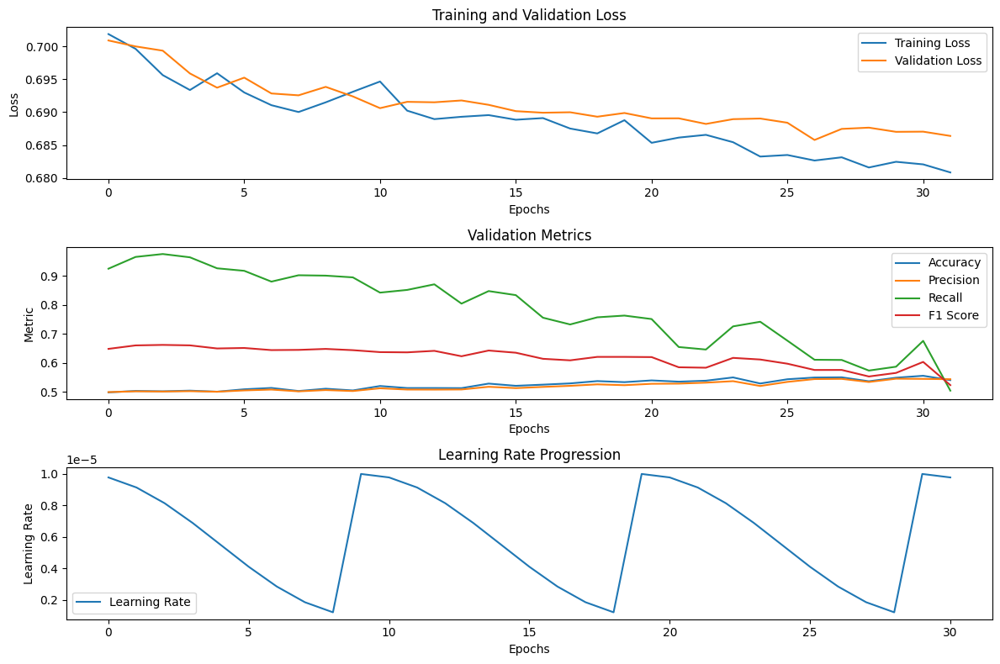

 58%|█████▊    | 70/120 [6:39:42<9:01:26, 649.73s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.6977 at epoch 1

Epoch 1/100 - Training Loss: 0.7078 - Validation Loss: 0.6977 - Accuracy: 0.5027 - Precision: 0.5016 - Recall: 0.8613 - F1 Score: 0.6340 - Time: 22.17 - Lr: 1.00e-05
New best model with Loss: 0.6967 at epoch 2

Epoch 2/100 - Training Loss: 0.7014 - Validation Loss: 0.6967 - Accuracy: 0.5127 - Precision: 0.5071 - Recall: 0.9000 - F1 Score: 0.6487 - Time: 22.14 - Lr: 1.00e-05
New best mod

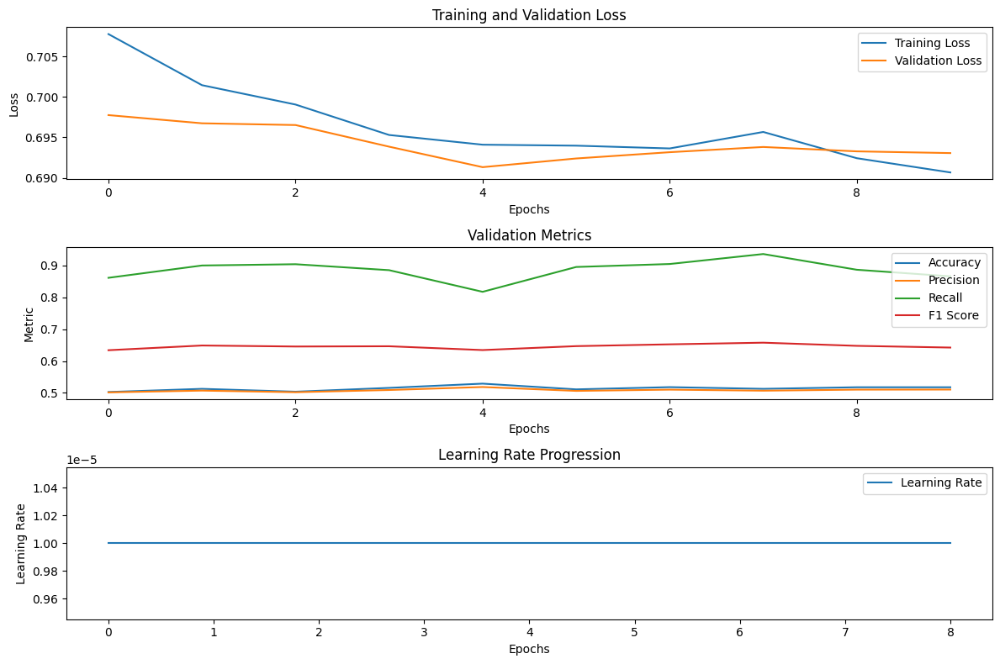

 59%|█████▉    | 71/120 [6:43:23<7:05:38, 521.18s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6912 at epoch 1

Epoch 1/100 - Training Loss: 0.6976 - Validation Loss: 0.6912 - Accuracy: 0.5317 - Precision: 0.5392 - Recall: 0.4360 - F1 Score: 0.4821 - Time: 21.94 - Lr: 1.22e-05
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6950 - Validation Loss: 0.6913 - Accuracy: 0.5317 - Precision: 0.5295 - Recall: 0.5680 - F1 Score: 0.5481 - Time: 21.91 - Lr: 1.86e-05
New bes

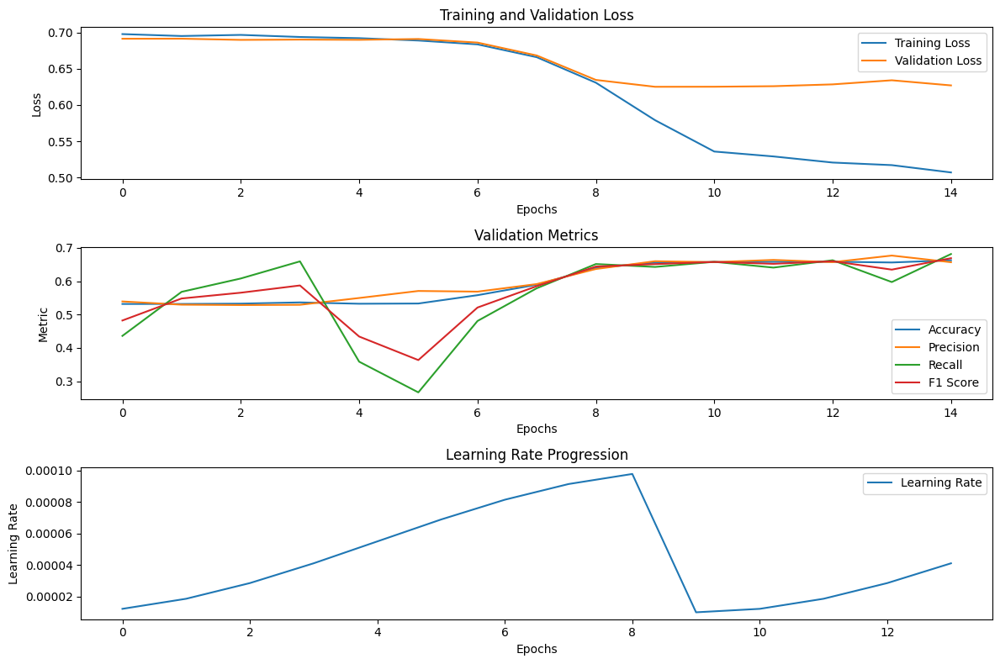

 60%|██████    | 72/120 [6:48:54<6:11:26, 464.29s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 1e-05, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.6984 at epoch 1

Epoch 1/100 - Training Loss: 0.6947 - Validation Loss: 0.6984 - Accuracy: 0.5063 - Precision: 0.5037 - Recall: 0.8653 - F1 Score: 0.6367 - Time: 22.00 - Lr: 9.76e-05
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6910 - Validation Loss: 0.7019 - Accuracy: 0.5090 - Precision: 0.5051 - Recall: 0.8873 - F1 Score: 0.6438 - Time: 21.97 - Lr: 9.05e-05
New be

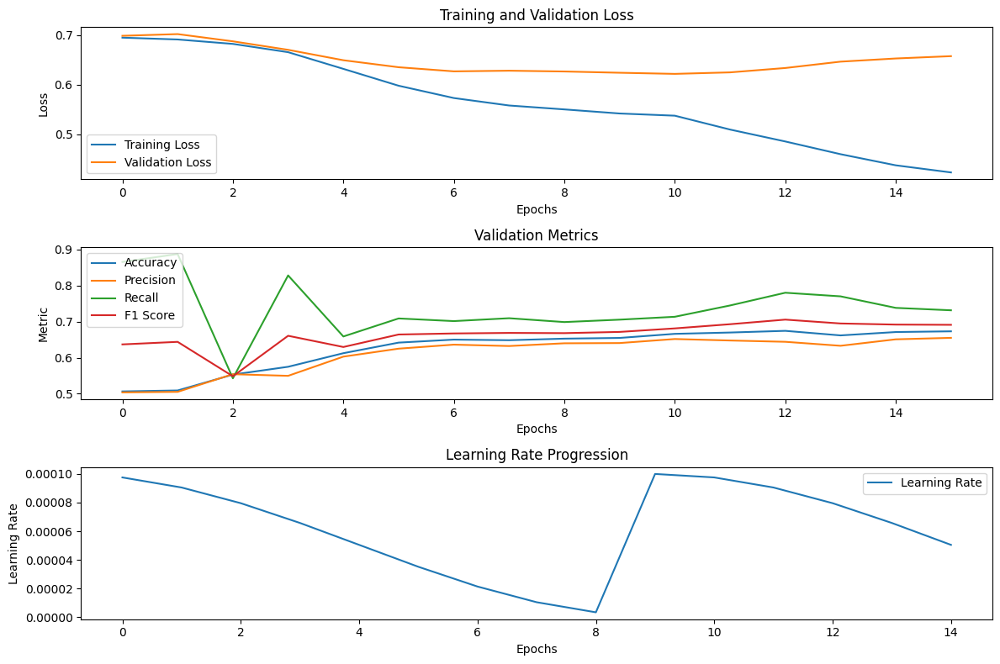

 61%|██████    | 73/120 [6:54:48<5:37:43, 431.13s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.7089 at epoch 1

Epoch 1/100 - Training Loss: 0.6974 - Validation Loss: 0.7089 - Accuracy: 0.4900 - Precision: 0.4895 - Recall: 0.4660 - F1 Score: 0.4775 - Time: 21.99 - Lr: 9.78e-05
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6899 - Validation Loss: 0.7113 - Accuracy: 0.5000 - Precision: 0.5000 - Recall: 0.9993 - F1 Score: 0.6665 - Time: 21.94 - Lr: 9.14e-05
New be

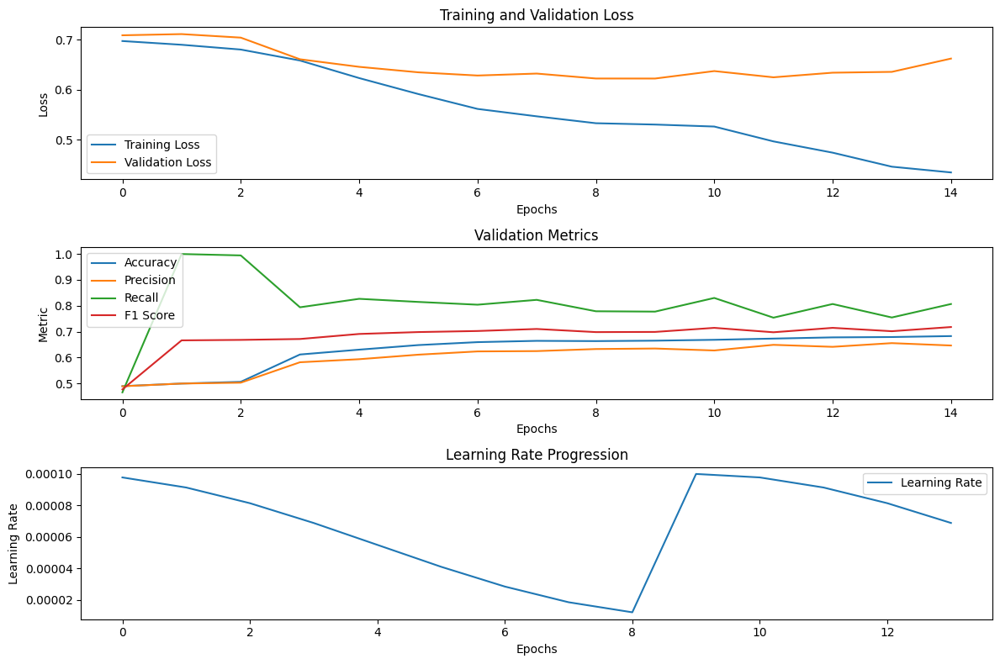

 62%|██████▏   | 74/120 [7:00:20<5:07:35, 401.21s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6984 at epoch 1

Epoch 1/100 - Training Loss: 0.6978 - Validation Loss: 0.6984 - Accuracy: 0.5027 - Precision: 0.5013 - Recall: 0.9913 - F1 Score: 0.6659 - Time: 22.05 - Lr: 1.00e-04
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6893 - Validation Loss: 0.7166 - Accuracy: 0.5013 - Precision: 0.5007 - Recall: 0.9980 - F1 Score: 0.6668 - Time: 21.99 - Lr: 1.00e-04
New b

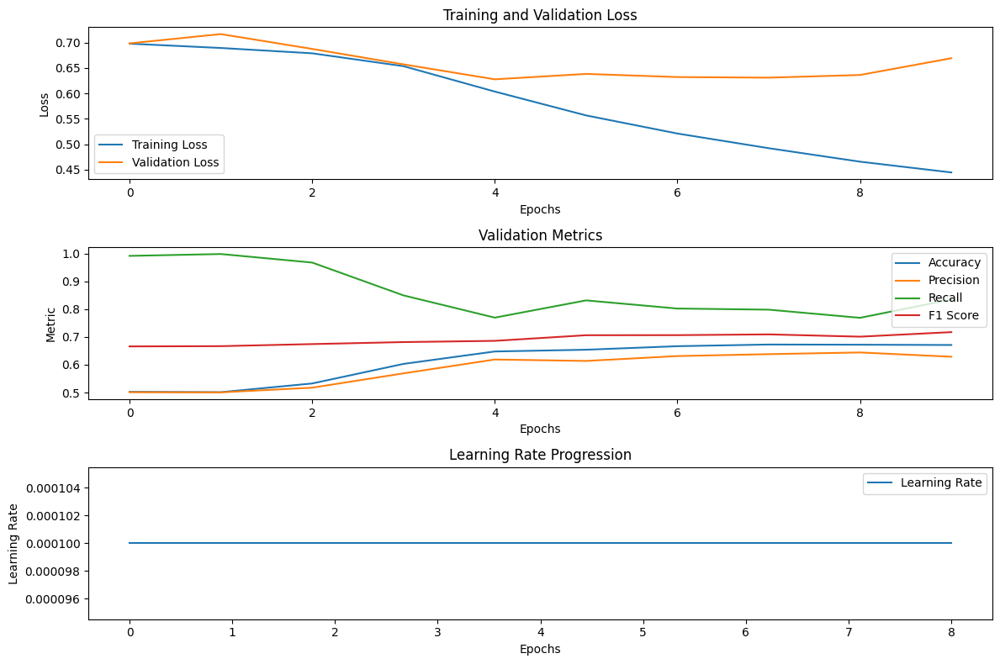

 62%|██████▎   | 75/120 [7:04:00<4:20:16, 347.04s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.7099 at epoch 1

Epoch 1/100 - Training Loss: 0.6961 - Validation Loss: 0.7099 - Accuracy: 0.4997 - Precision: 0.4998 - Recall: 0.9967 - F1 Score: 0.6658 - Time: 22.19 - Lr: 9.76e-05
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6913 - Validation Loss: 0.7246 - Accuracy: 0.5027 - Precision: 0.5013 - Recall: 0.9947 - F1 Score: 0.6667 - Time: 22.14 - Lr: 9.05e-05
Valid

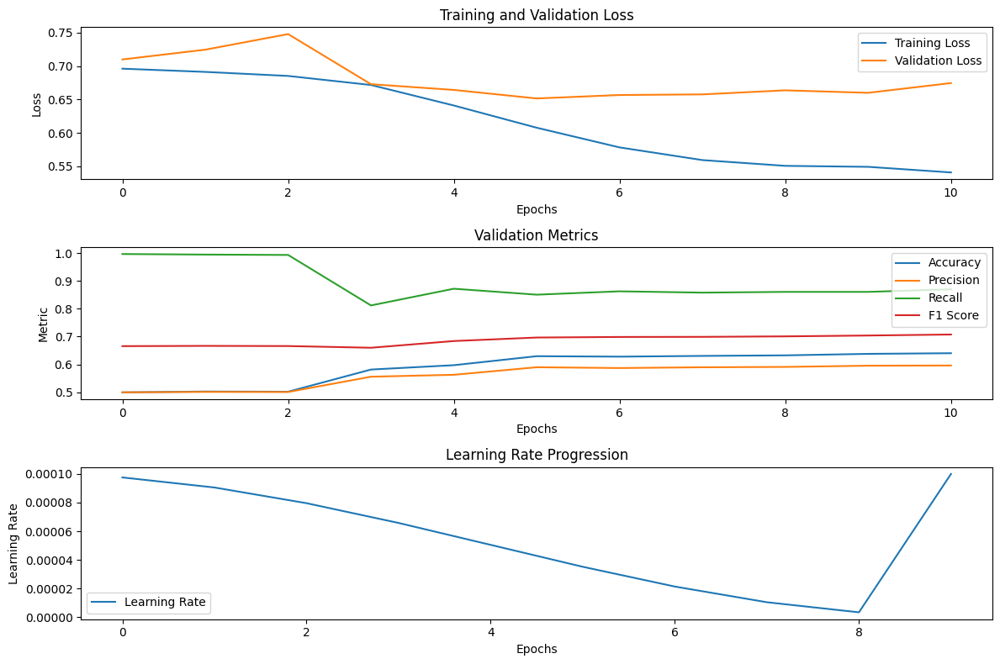

 63%|██████▎   | 76/120 [7:08:03<3:51:37, 315.85s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.7055 at epoch 1

Epoch 1/100 - Training Loss: 0.6980 - Validation Loss: 0.7055 - Accuracy: 0.5000 - Precision: 0.5000 - Recall: 0.9953 - F1 Score: 0.6656 - Time: 21.93 - Lr: 9.78e-05
New best model with Loss: 0.6909 at epoch 2

Epoch 2/100 - Training Loss: 0.6899 - Validation Loss: 0.6909 - Accuracy: 0.5240 - Precision: 0.5129 - Recall: 0.9567 - F1 Score: 0.6678 - Time: 22.08 - Lr: 9.14e-05
Validation

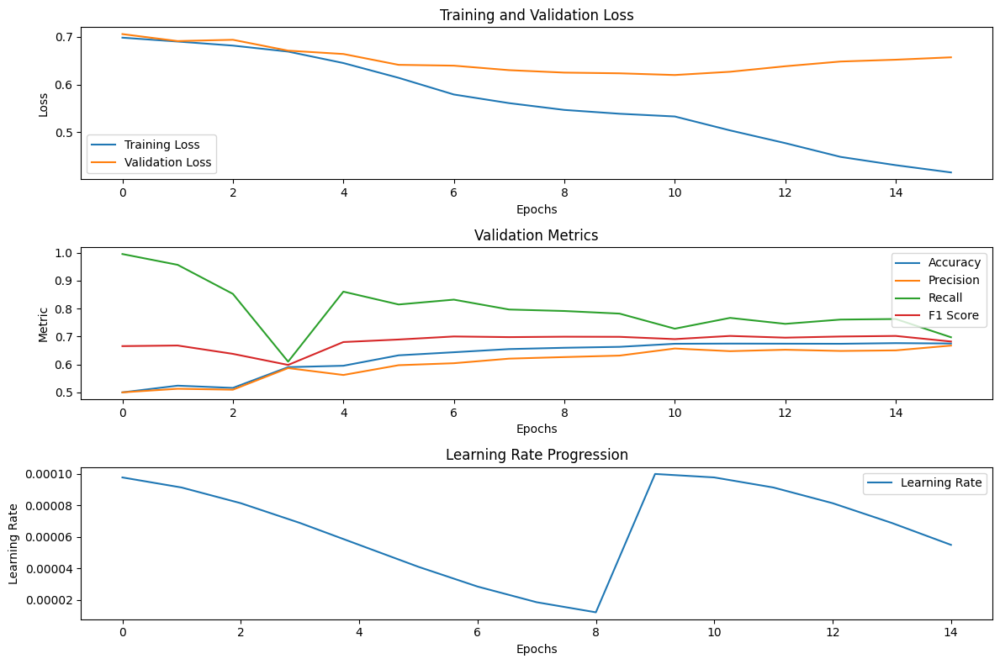

 64%|██████▍   | 77/120 [7:13:57<3:54:29, 327.20s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6952 at epoch 1

Epoch 1/100 - Training Loss: 0.6977 - Validation Loss: 0.6952 - Accuracy: 0.5143 - Precision: 0.5218 - Recall: 0.3433 - F1 Score: 0.4142 - Time: 21.96 - Lr: 1.00e-04
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6886 - Validation Loss: 0.6998 - Accuracy: 0.5317 - Precision: 0.5629 - Recall: 0.2833 - F1 Score: 0.3769 - Time: 22.04 - Lr: 1.00e-04
New b

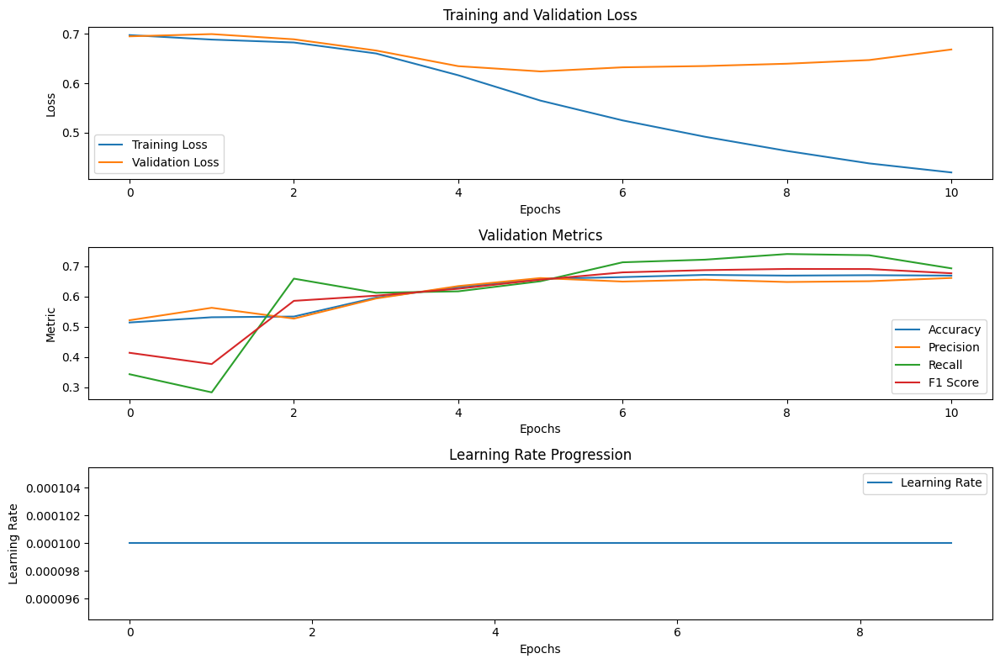

 65%|██████▌   | 78/120 [7:18:00<3:31:25, 302.04s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.6897 at epoch 1

Epoch 1/100 - Training Loss: 0.6969 - Validation Loss: 0.6897 - Accuracy: 0.5257 - Precision: 0.5265 - Recall: 0.5093 - F1 Score: 0.5178 - Time: 22.19 - Lr: 9.76e-05
New best model with Loss: 0.6858 at epoch 2

Epoch 2/100 - Training Loss: 0.6903 - Validation Loss: 0.6858 - Accuracy: 0.5577 - Precision: 0.5482 - Recall: 0.6560 - F1 Score: 0.5973 - Time: 22.15 - Lr: 9.05e-05
Validati

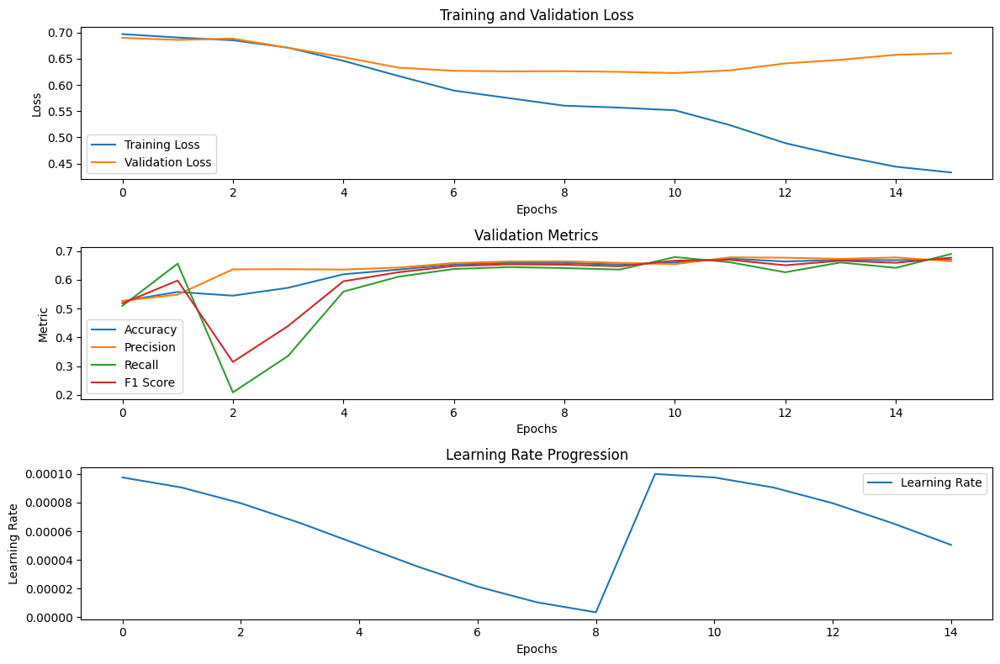

 66%|██████▌   | 79/120 [7:23:54<3:37:00, 317.58s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.6960 at epoch 1

Epoch 1/100 - Training Loss: 0.6980 - Validation Loss: 0.6960 - Accuracy: 0.5123 - Precision: 0.5096 - Recall: 0.6567 - F1 Score: 0.5738 - Time: 22.10 - Lr: 9.78e-05
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6910 - Validation Loss: 0.7001 - Accuracy: 0.5227 - Precision: 0.5415 - Recall: 0.2960 - F1 Score: 0.3828 - Time: 22.05 - Lr: 9.14e-05
New 

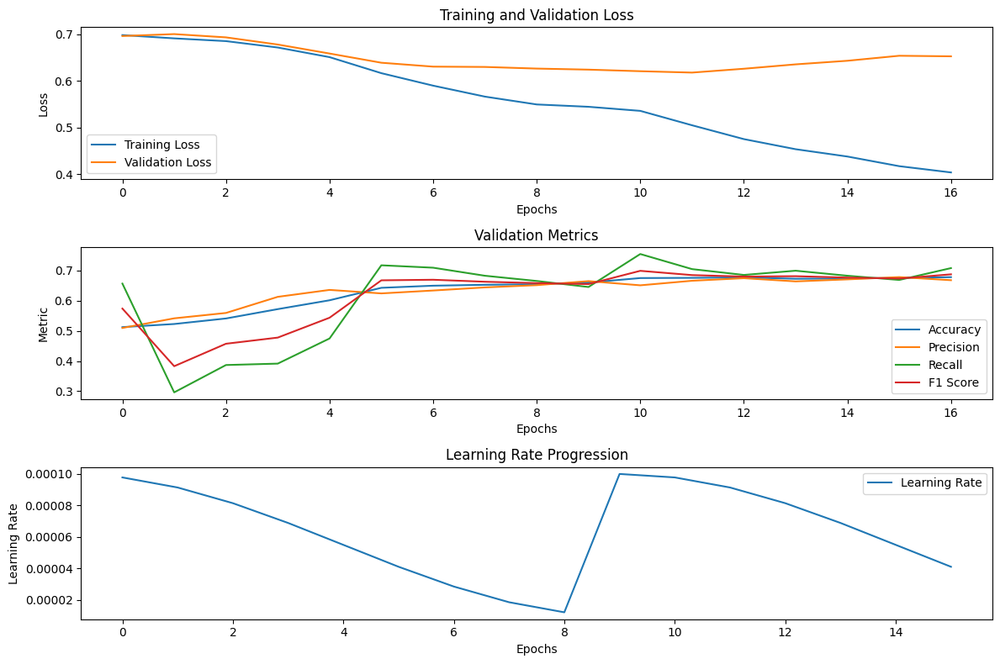

 67%|██████▋   | 80/120 [7:30:09<3:43:15, 334.89s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.7184 at epoch 1

Epoch 1/100 - Training Loss: 0.6963 - Validation Loss: 0.7184 - Accuracy: 0.5030 - Precision: 0.5056 - Recall: 0.2693 - F1 Score: 0.3515 - Time: 22.07 - Lr: 1.00e-04
New best model with Loss: 0.7129 at epoch 2

Epoch 2/100 - Training Loss: 0.6910 - Validation Loss: 0.7129 - Accuracy: 0.5107 - Precision: 0.5396 - Recall: 0.1453 - F1 Score: 0.2290 - Time: 22.03 - Lr: 1.00e-04
New bes

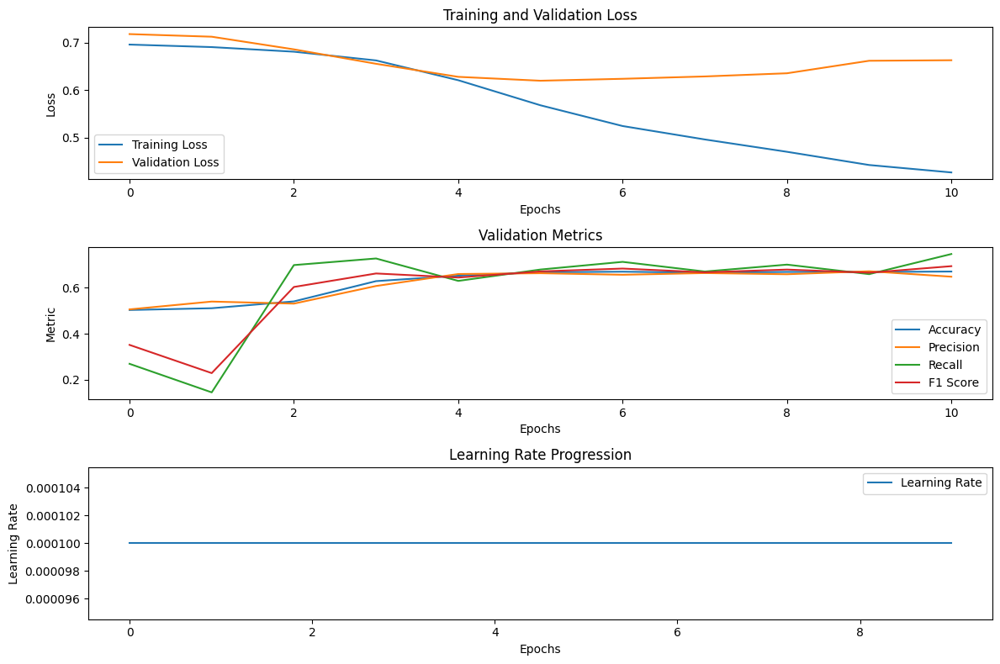

 68%|██████▊   | 81/120 [7:34:12<3:19:40, 307.20s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.6891 at epoch 1

Epoch 1/100 - Training Loss: 0.6968 - Validation Loss: 0.6891 - Accuracy: 0.5283 - Precision: 0.5180 - Recall: 0.8147 - F1 Score: 0.6333 - Time: 22.17 - Lr: 9.76e-05
New best model with Loss: 0.6861 at epoch 2

Epoch 2/100 - Training Loss: 0.6899 - Validation Loss: 0.6861 - Accuracy: 0.5437 - Precision: 0.5308 - Recall: 0.7533 - F1 Score: 0.6228 - Time: 22.14 - Lr: 9.05e-05
New best

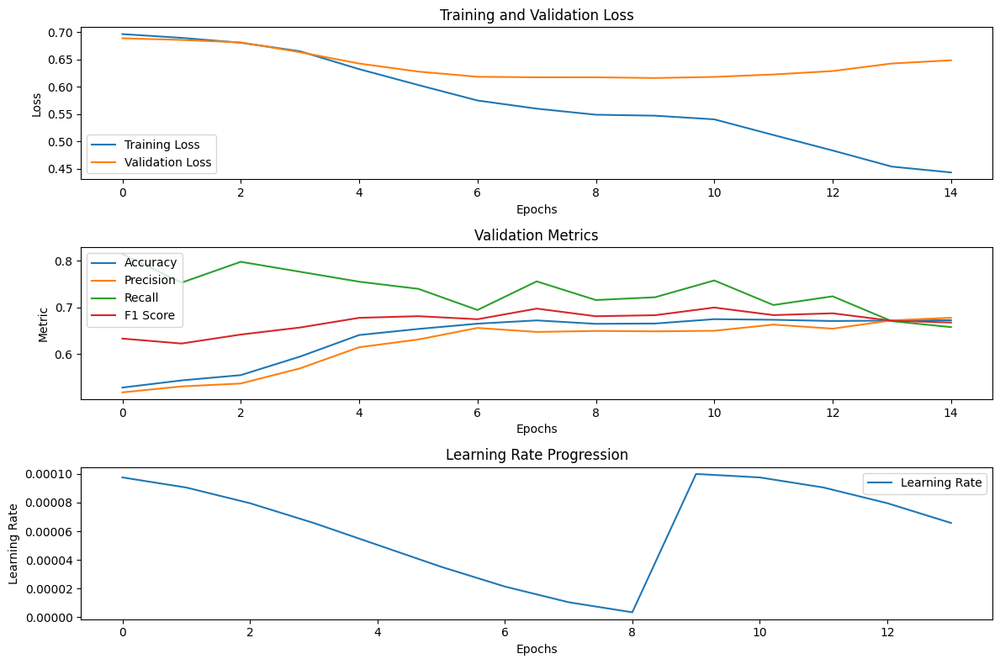

 68%|██████▊   | 82/120 [7:39:43<3:19:10, 314.48s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.7003 at epoch 1

Epoch 1/100 - Training Loss: 0.6967 - Validation Loss: 0.7003 - Accuracy: 0.5103 - Precision: 0.5054 - Recall: 0.9687 - F1 Score: 0.6642 - Time: 22.20 - Lr: 9.78e-05
New best model with Loss: 0.6923 at epoch 2

Epoch 2/100 - Training Loss: 0.6899 - Validation Loss: 0.6923 - Accuracy: 0.5250 - Precision: 0.5931 - Recall: 0.1593 - F1 Score: 0.2512 - Time: 22.18 - Lr: 9.14e-05
New best m

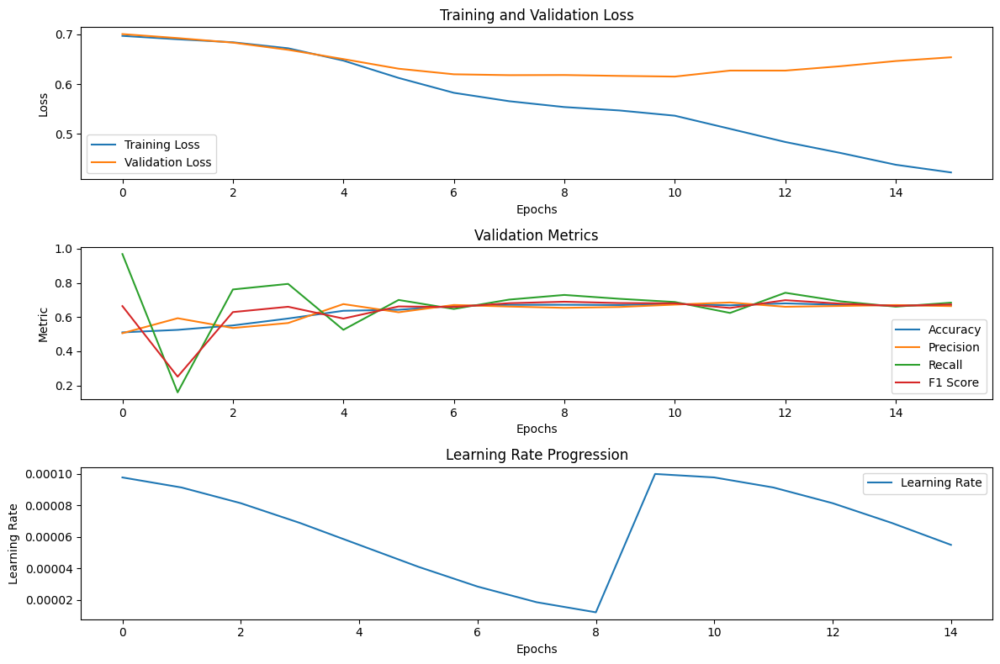

 69%|██████▉   | 83/120 [7:45:37<3:21:12, 326.30s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6936 at epoch 1

Epoch 1/100 - Training Loss: 0.6997 - Validation Loss: 0.6936 - Accuracy: 0.5250 - Precision: 0.5519 - Recall: 0.2660 - F1 Score: 0.3590 - Time: 22.21 - Lr: 1.00e-04
New best model with Loss: 0.6894 at epoch 2

Epoch 2/100 - Training Loss: 0.6896 - Validation Loss: 0.6894 - Accuracy: 0.5363 - Precision: 0.5707 - Recall: 0.2933 - F1 Score: 0.3875 - Time: 22.17 - Lr: 1.00e-04
Validatio

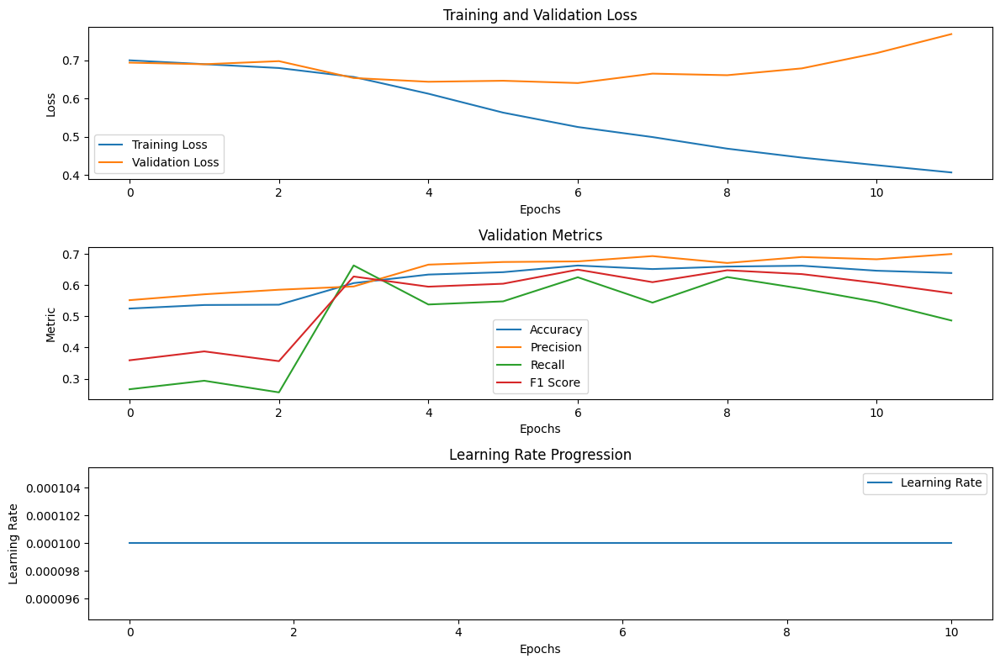

 70%|███████   | 84/120 [7:50:03<3:04:50, 308.06s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0001, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.6602 at epoch 1

Epoch 1/100 - Training Loss: 0.6914 - Validation Loss: 0.6602 - Accuracy: 0.6183 - Precision: 0.6207 - Recall: 0.6087 - F1 Score: 0.6146 - Time: 21.95 - Lr: 4.88e-04
New best model with Loss: 0.6197 at epoch 2

Epoch 2/100 - Training Loss: 0.6116 - Validation Loss: 0.6197 - Accuracy: 0.6623 - Precision: 0.6307 - Recall: 0.7833 - F1 Score: 0.6988 - Time: 22.08 - Lr: 4.52e-04
Validatio

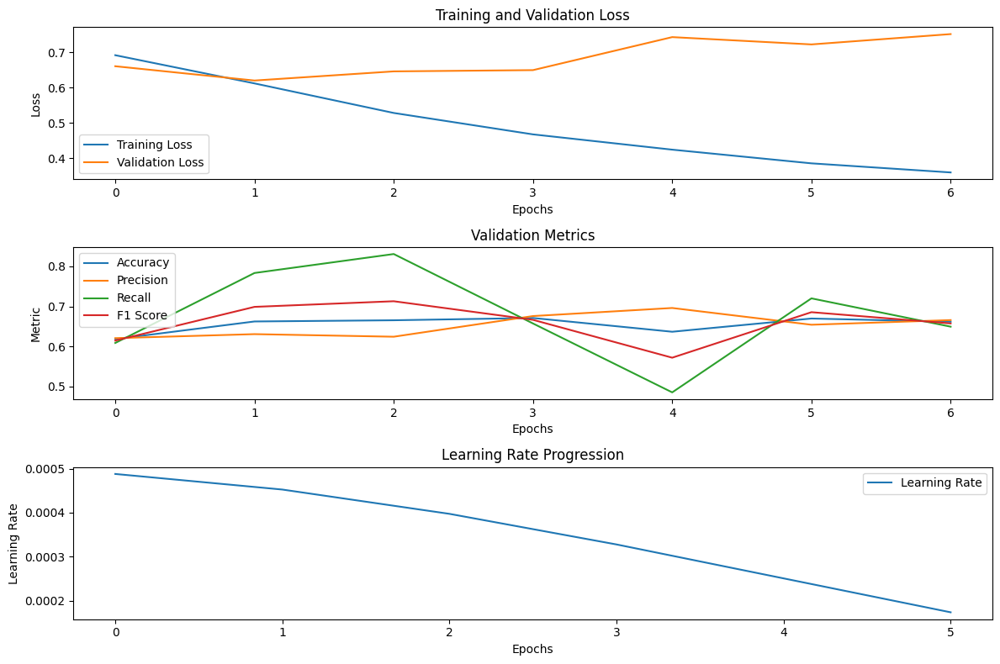

 71%|███████   | 85/120 [7:52:38<2:32:56, 262.18s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.6994 at epoch 1

Epoch 1/100 - Training Loss: 0.6923 - Validation Loss: 0.6994 - Accuracy: 0.5623 - Precision: 0.5360 - Recall: 0.9273 - F1 Score: 0.6794 - Time: 22.22 - Lr: 4.88e-04
New best model with Loss: 0.6240 at epoch 2

Epoch 2/100 - Training Loss: 0.6190 - Validation Loss: 0.6240 - Accuracy: 0.6640 - Precision: 0.6861 - Recall: 0.6047 - F1 Score: 0.6428 - Time: 22.08 - Lr: 4.53e-04
Validation

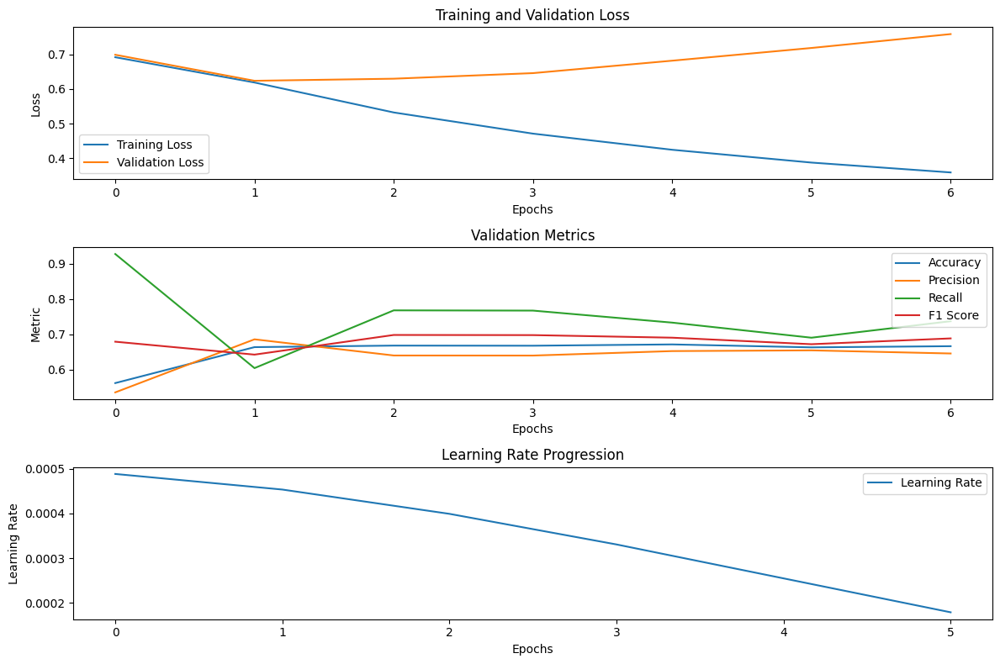

 72%|███████▏  | 86/120 [7:55:13<2:10:21, 230.04s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6833 at epoch 1

Epoch 1/100 - Training Loss: 0.6941 - Validation Loss: 0.6833 - Accuracy: 0.5497 - Precision: 0.5293 - Recall: 0.8960 - F1 Score: 0.6655 - Time: 21.98 - Lr: 4.90e-04
New best model with Loss: 0.6400 at epoch 2

Epoch 2/100 - Training Loss: 0.6216 - Validation Loss: 0.6400 - Accuracy: 0.6407 - Precision: 0.6598 - Recall: 0.5807 - F1 Score: 0.6177 - Time: 21.95 - Lr: 4.62e-04
Validatio

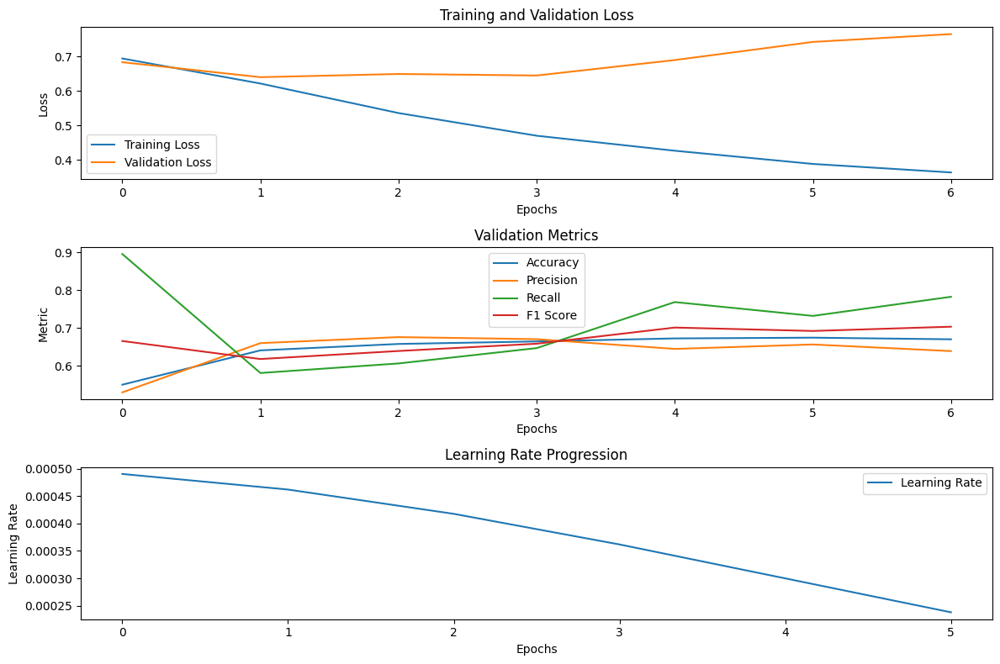

 72%|███████▎  | 87/120 [7:57:48<1:54:05, 207.45s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.6813 at epoch 1

Epoch 1/100 - Training Loss: 0.6906 - Validation Loss: 0.6813 - Accuracy: 0.5823 - Precision: 0.5635 - Recall: 0.7307 - F1 Score: 0.6363 - Time: 22.24 - Lr: 4.88e-04
New best model with Loss: 0.6216 at epoch 2

Epoch 2/100 - Training Loss: 0.6104 - Validation Loss: 0.6216 - Accuracy: 0.6633 - Precision: 0.6383 - Recall: 0.7540 - F1 Score: 0.6913 - Time: 22.17 - Lr: 4.52e-04
Validatio

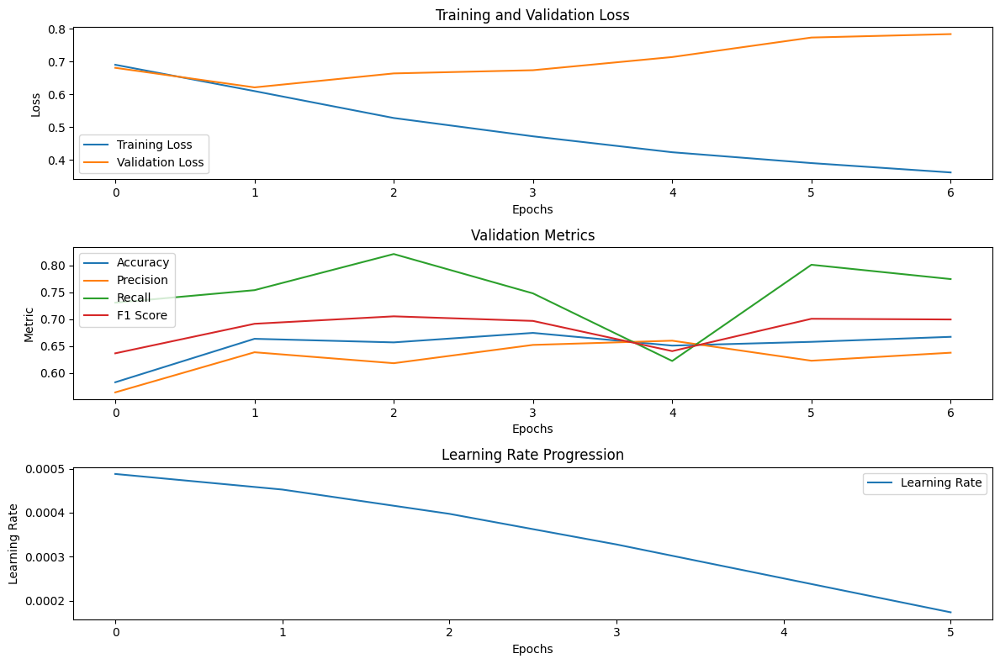

 73%|███████▎  | 88/120 [8:00:23<1:42:18, 191.82s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.6745 at epoch 1

Epoch 1/100 - Training Loss: 0.6922 - Validation Loss: 0.6745 - Accuracy: 0.5830 - Precision: 0.5572 - Recall: 0.8087 - F1 Score: 0.6598 - Time: 22.11 - Lr: 4.88e-04
New best model with Loss: 0.6381 at epoch 2

Epoch 2/100 - Training Loss: 0.6131 - Validation Loss: 0.6381 - Accuracy: 0.6430 - Precision: 0.6578 - Recall: 0.5960 - F1 Score: 0.6254 - Time: 22.03 - Lr: 4.53e-04
New best m

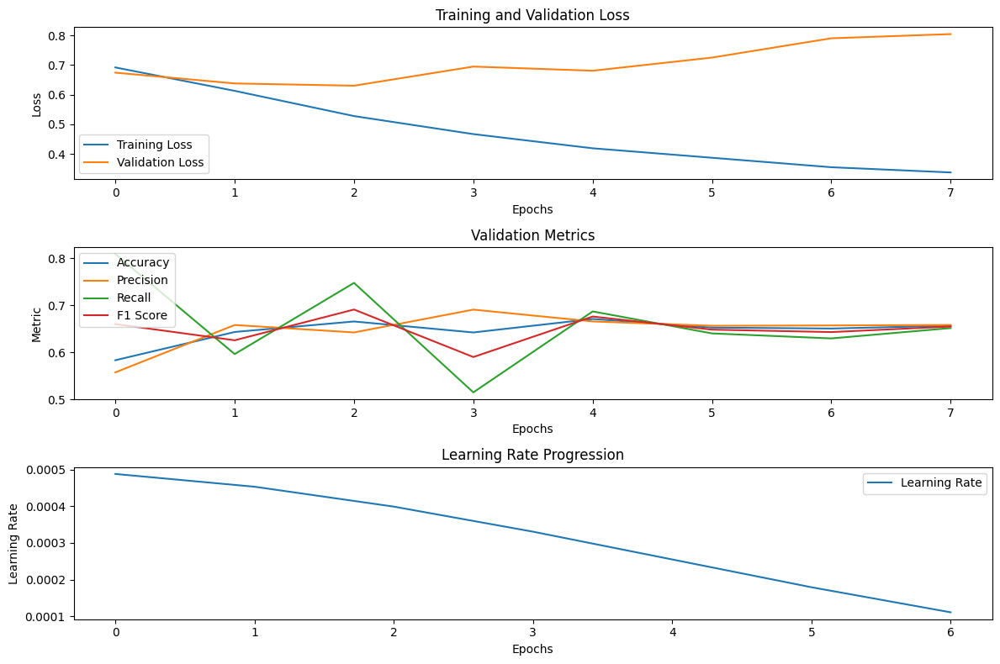

 74%|███████▍  | 89/120 [8:03:20<1:36:45, 187.28s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6650 at epoch 1

Epoch 1/100 - Training Loss: 0.6938 - Validation Loss: 0.6650 - Accuracy: 0.5983 - Precision: 0.5979 - Recall: 0.6007 - F1 Score: 0.5993 - Time: 22.19 - Lr: 4.90e-04
New best model with Loss: 0.6150 at epoch 2

Epoch 2/100 - Training Loss: 0.6198 - Validation Loss: 0.6150 - Accuracy: 0.6693 - Precision: 0.6595 - Recall: 0.7000 - F1 Score: 0.6792 - Time: 22.20 - Lr: 4.62e-04
Validatio

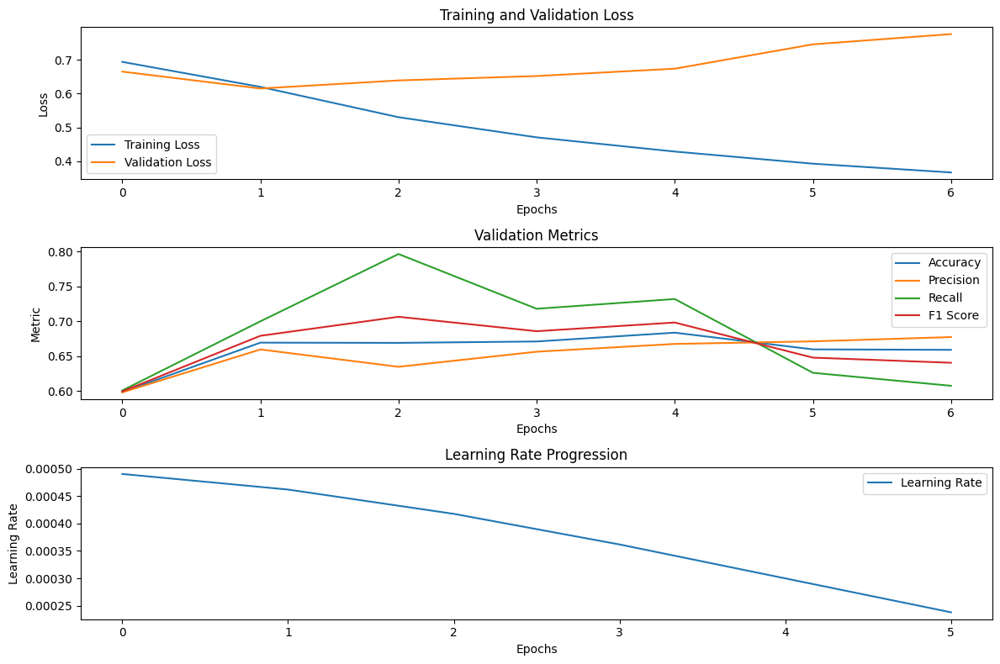

 75%|███████▌  | 90/120 [8:05:55<1:28:53, 177.79s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.6763 at epoch 1

Epoch 1/100 - Training Loss: 0.6934 - Validation Loss: 0.6763 - Accuracy: 0.5737 - Precision: 0.6070 - Recall: 0.4180 - F1 Score: 0.4951 - Time: 22.10 - Lr: 4.88e-04
New best model with Loss: 0.6429 at epoch 2

Epoch 2/100 - Training Loss: 0.6127 - Validation Loss: 0.6429 - Accuracy: 0.6643 - Precision: 0.6308 - Recall: 0.7927 - F1 Score: 0.7025 - Time: 22.08 - Lr: 4.52e-04
Validati

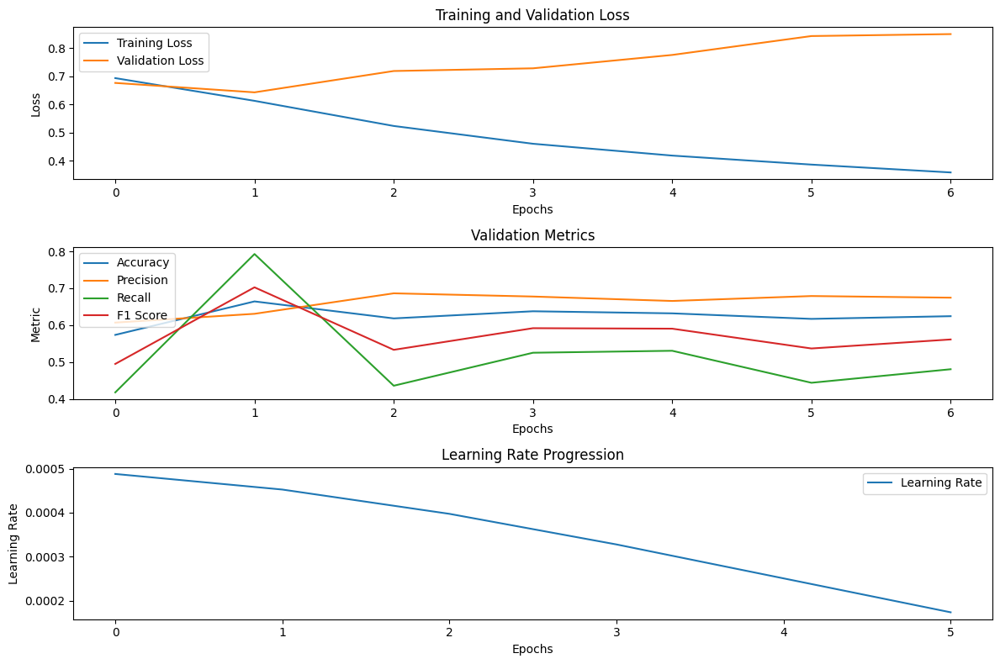

 76%|███████▌  | 91/120 [8:08:30<1:22:33, 170.82s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.7294 at epoch 1

Epoch 1/100 - Training Loss: 0.6966 - Validation Loss: 0.7294 - Accuracy: 0.5220 - Precision: 0.6650 - Recall: 0.0887 - F1 Score: 0.1565 - Time: 22.11 - Lr: 4.88e-04
New best model with Loss: 0.6314 at epoch 2

Epoch 2/100 - Training Loss: 0.6224 - Validation Loss: 0.6314 - Accuracy: 0.6530 - Precision: 0.6892 - Recall: 0.5573 - F1 Score: 0.6163 - Time: 22.08 - Lr: 4.53e-04
Validati

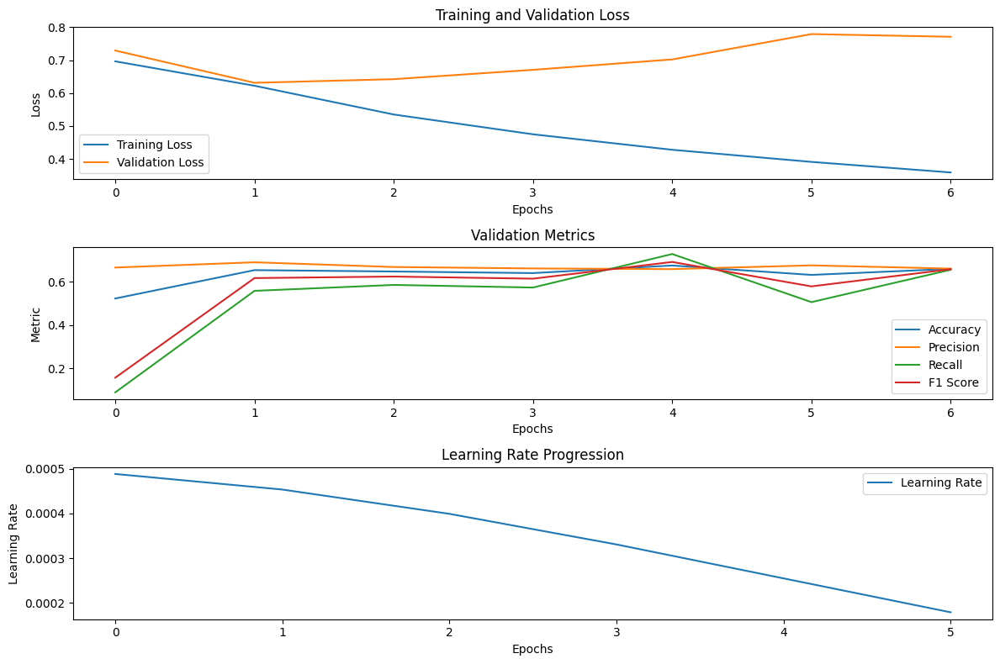

 77%|███████▋  | 92/120 [8:11:05<1:17:34, 166.23s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6734 at epoch 1

Epoch 1/100 - Training Loss: 0.6936 - Validation Loss: 0.6734 - Accuracy: 0.5897 - Precision: 0.5741 - Recall: 0.6947 - F1 Score: 0.6287 - Time: 22.15 - Lr: 4.90e-04
New best model with Loss: 0.6350 at epoch 2

Epoch 2/100 - Training Loss: 0.6208 - Validation Loss: 0.6350 - Accuracy: 0.6430 - Precision: 0.6728 - Recall: 0.5567 - F1 Score: 0.6093 - Time: 22.06 - Lr: 4.62e-04
Validat

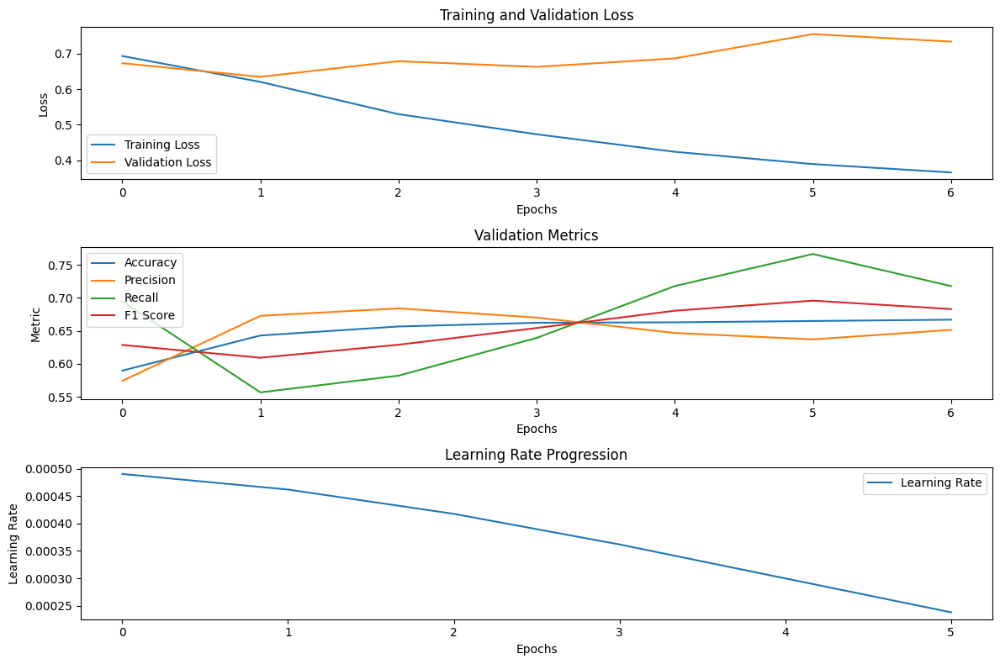

 78%|███████▊  | 93/120 [8:13:40<1:13:15, 162.81s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.6622 at epoch 1

Epoch 1/100 - Training Loss: 0.6946 - Validation Loss: 0.6622 - Accuracy: 0.5943 - Precision: 0.6126 - Recall: 0.5133 - F1 Score: 0.5586 - Time: 22.00 - Lr: 4.88e-04
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6119 - Validation Loss: 0.7999 - Accuracy: 0.5943 - Precision: 0.5566 - Recall: 0.9280 - F1 Score: 0.6958 - Time: 21.91 - Lr: 4.52e-04
Vali

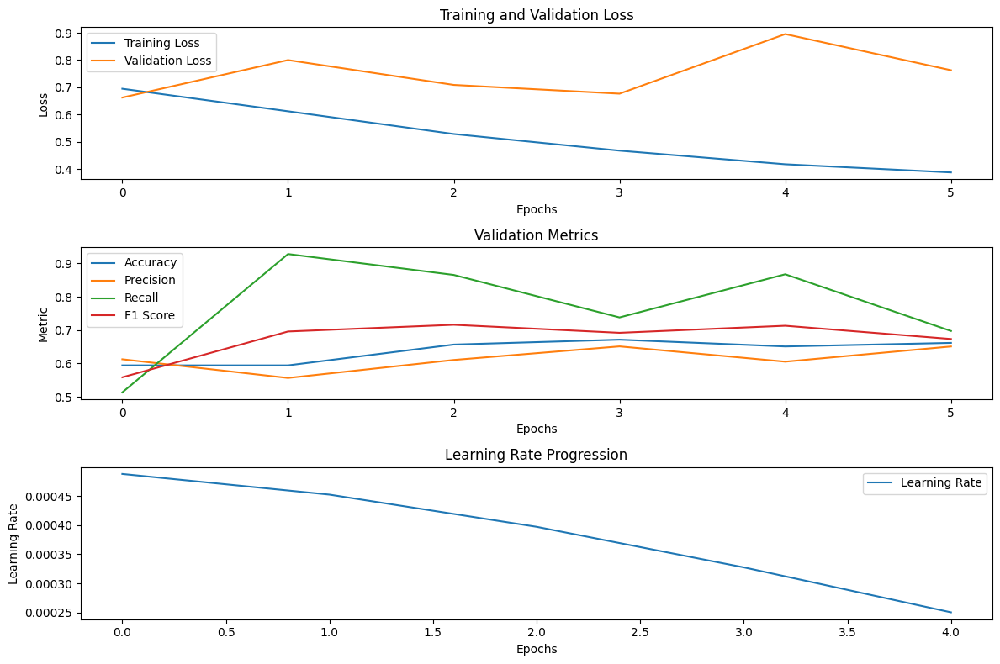

 78%|███████▊  | 94/120 [8:15:53<1:06:38, 153.80s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.6775 at epoch 1

Epoch 1/100 - Training Loss: 0.6920 - Validation Loss: 0.6775 - Accuracy: 0.5750 - Precision: 0.6289 - Recall: 0.3660 - F1 Score: 0.4627 - Time: 22.19 - Lr: 4.88e-04
New best model with Loss: 0.6525 at epoch 2

Epoch 2/100 - Training Loss: 0.6159 - Validation Loss: 0.6525 - Accuracy: 0.6313 - Precision: 0.5905 - Recall: 0.8567 - F1 Score: 0.6991 - Time: 22.17 - Lr: 4.53e-04
Validation

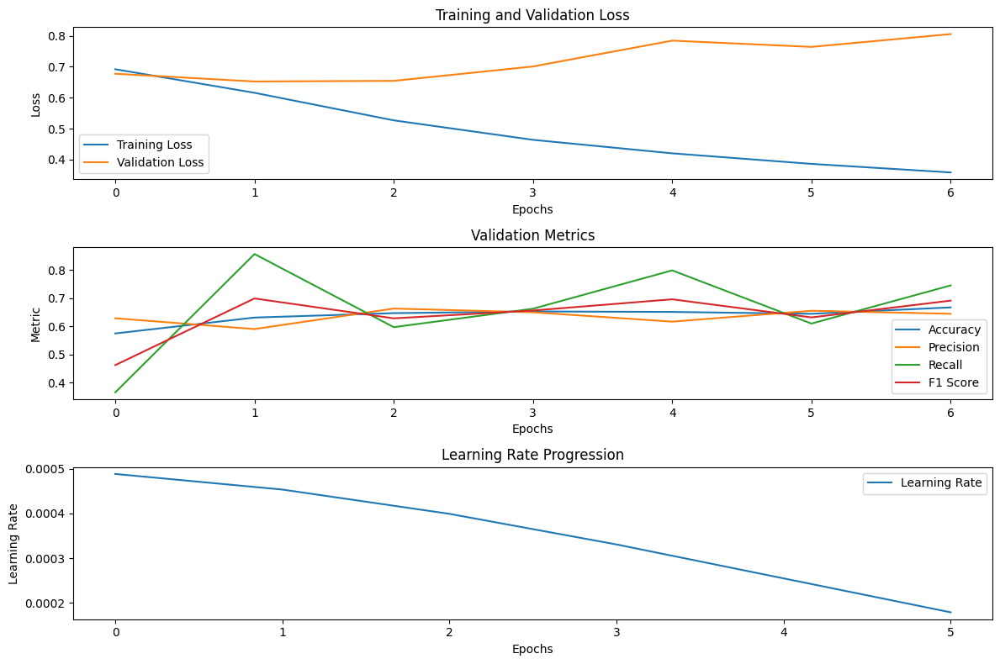

 79%|███████▉  | 95/120 [8:18:29<1:04:17, 154.30s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6992 at epoch 1

Epoch 1/100 - Training Loss: 0.6936 - Validation Loss: 0.6992 - Accuracy: 0.5427 - Precision: 0.5780 - Recall: 0.3160 - F1 Score: 0.4086 - Time: 22.15 - Lr: 4.90e-04
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6225 - Validation Loss: 0.7449 - Accuracy: 0.5837 - Precision: 0.7160 - Recall: 0.2773 - F1 Score: 0.3998 - Time: 22.04 - Lr: 4.62e-04
Valid

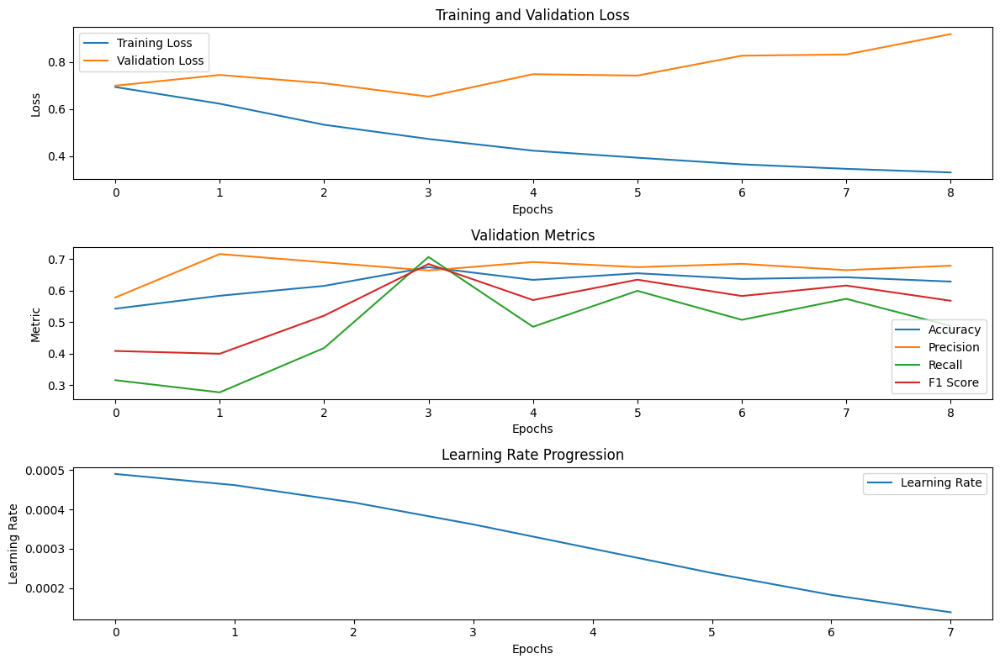

 80%|████████  | 96/120 [8:21:47<1:07:02, 167.62s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.0005, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.6519 at epoch 1

Epoch 1/100 - Training Loss: 0.6774 - Validation Loss: 0.6519 - Accuracy: 0.6367 - Precision: 0.6041 - Recall: 0.7933 - F1 Score: 0.6859 - Time: 22.20 - Lr: 9.76e-04
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.5737 - Validation Loss: 0.7704 - Accuracy: 0.5947 - Precision: 0.6707 - Recall: 0.3720 - F1 Score: 0.4786 - Time: 22.13 - Lr: 9.05e-04
Valida

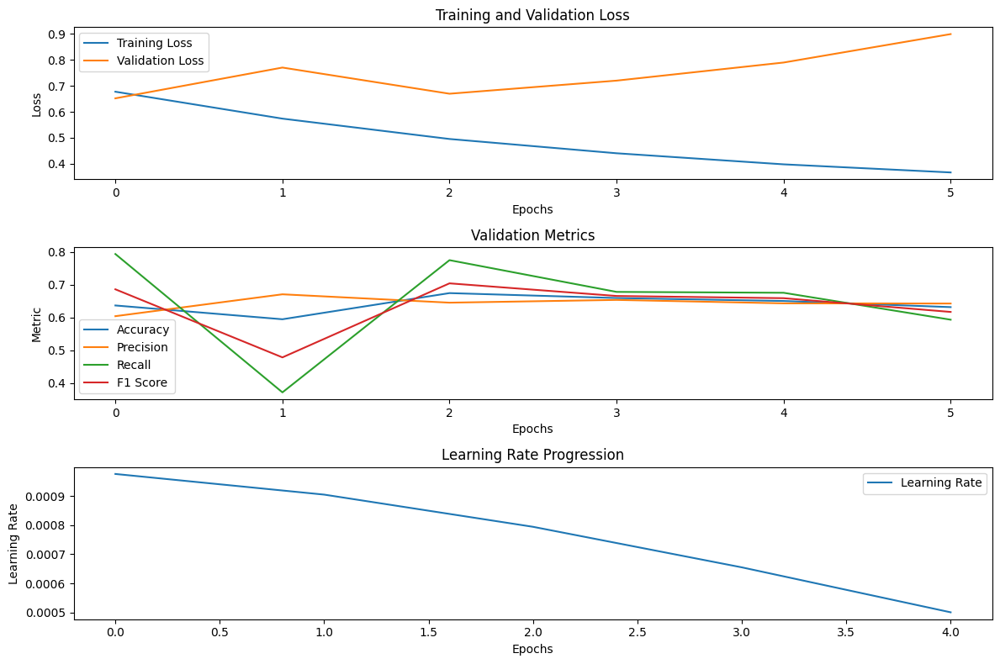

 81%|████████  | 97/120 [8:24:00<1:00:17, 157.28s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.7396 at epoch 1

Epoch 1/100 - Training Loss: 0.6808 - Validation Loss: 0.7396 - Accuracy: 0.5733 - Precision: 0.5427 - Recall: 0.9320 - F1 Score: 0.6860 - Time: 21.97 - Lr: 9.76e-04
New best model with Loss: 0.6543 at epoch 2

Epoch 2/100 - Training Loss: 0.5847 - Validation Loss: 0.6543 - Accuracy: 0.6557 - Precision: 0.6134 - Recall: 0.8420 - F1 Score: 0.7097 - Time: 22.08 - Lr: 9.05e-04
Validation l

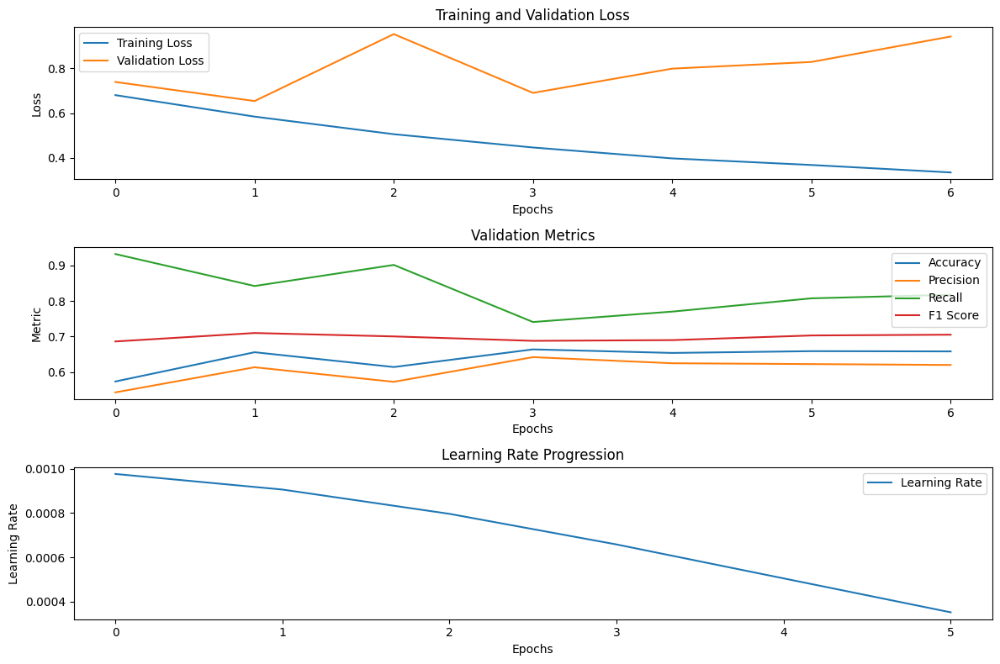

 82%|████████▏ | 98/120 [8:26:35<57:20, 156.37s/it]  

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.7497 at epoch 1

Epoch 1/100 - Training Loss: 0.6840 - Validation Loss: 0.7497 - Accuracy: 0.5717 - Precision: 0.5900 - Recall: 0.4700 - F1 Score: 0.5232 - Time: 22.03 - Lr: 9.78e-04
New best model with Loss: 0.6477 at epoch 2

Epoch 2/100 - Training Loss: 0.5831 - Validation Loss: 0.6477 - Accuracy: 0.6640 - Precision: 0.6432 - Recall: 0.7367 - F1 Score: 0.6868 - Time: 21.99 - Lr: 9.14e-04
Validation 

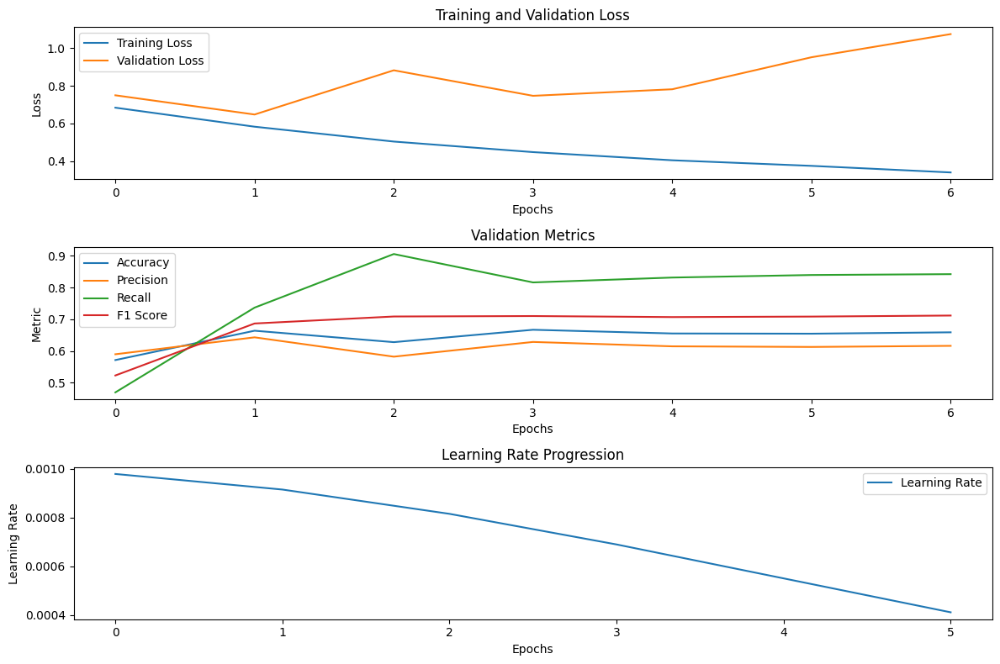

 82%|████████▎ | 99/120 [8:29:09<54:34, 155.91s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.6459 at epoch 1

Epoch 1/100 - Training Loss: 0.6784 - Validation Loss: 0.6459 - Accuracy: 0.6257 - Precision: 0.6328 - Recall: 0.5987 - F1 Score: 0.6153 - Time: 22.06 - Lr: 9.76e-04
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.5846 - Validation Loss: 0.6688 - Accuracy: 0.6560 - Precision: 0.6168 - Recall: 0.8240 - F1 Score: 0.7055 - Time: 22.04 - Lr: 9.05e-04
Validat

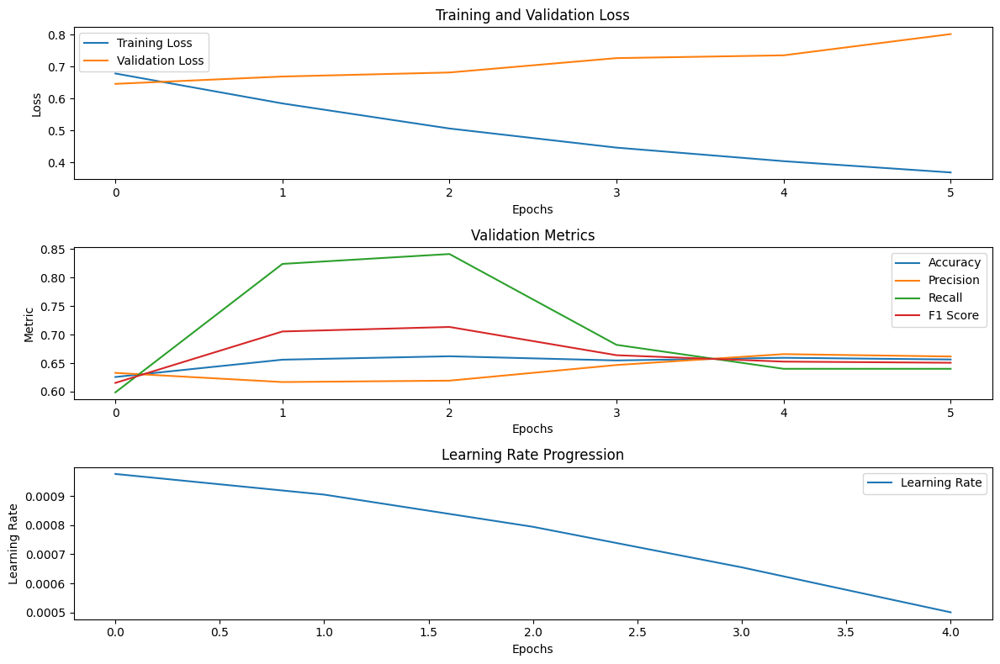

 83%|████████▎ | 100/120 [8:31:22<49:37, 148.90s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.6567 at epoch 1

Epoch 1/100 - Training Loss: 0.6809 - Validation Loss: 0.6567 - Accuracy: 0.6293 - Precision: 0.5951 - Recall: 0.8093 - F1 Score: 0.6859 - Time: 22.02 - Lr: 9.76e-04
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.5804 - Validation Loss: 0.6932 - Accuracy: 0.6587 - Precision: 0.6218 - Recall: 0.8100 - F1 Score: 0.7035 - Time: 21.90 - Lr: 9.05e-04
Validati

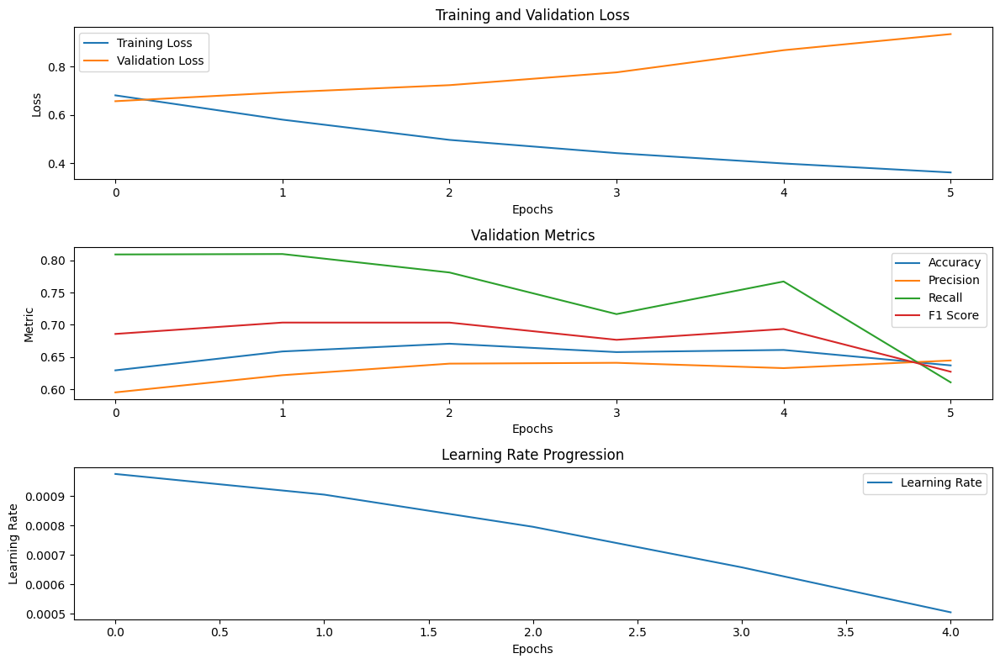

 84%|████████▍ | 101/120 [8:33:34<45:34, 143.93s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6570 at epoch 1

Epoch 1/100 - Training Loss: 0.6793 - Validation Loss: 0.6570 - Accuracy: 0.6373 - Precision: 0.6060 - Recall: 0.7853 - F1 Score: 0.6841 - Time: 22.13 - Lr: 9.78e-04
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.5810 - Validation Loss: 0.7089 - Accuracy: 0.6417 - Precision: 0.5982 - Recall: 0.8633 - F1 Score: 0.7067 - Time: 22.06 - Lr: 9.14e-04
Validat

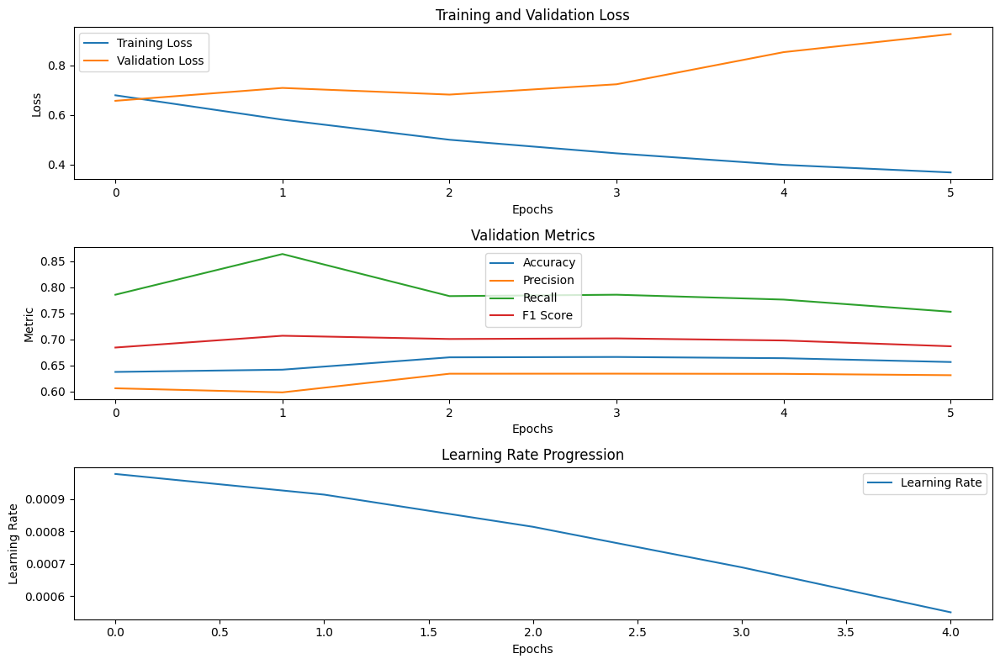

 85%|████████▌ | 102/120 [8:35:47<42:10, 140.60s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.6638 at epoch 1

Epoch 1/100 - Training Loss: 0.6833 - Validation Loss: 0.6638 - Accuracy: 0.6190 - Precision: 0.5905 - Recall: 0.7767 - F1 Score: 0.6709 - Time: 21.98 - Lr: 9.76e-04
New best model with Loss: 0.6121 at epoch 2

Epoch 2/100 - Training Loss: 0.5878 - Validation Loss: 0.6121 - Accuracy: 0.6657 - Precision: 0.6570 - Recall: 0.6933 - F1 Score: 0.6747 - Time: 22.00 - Lr: 9.05e-04
Validation

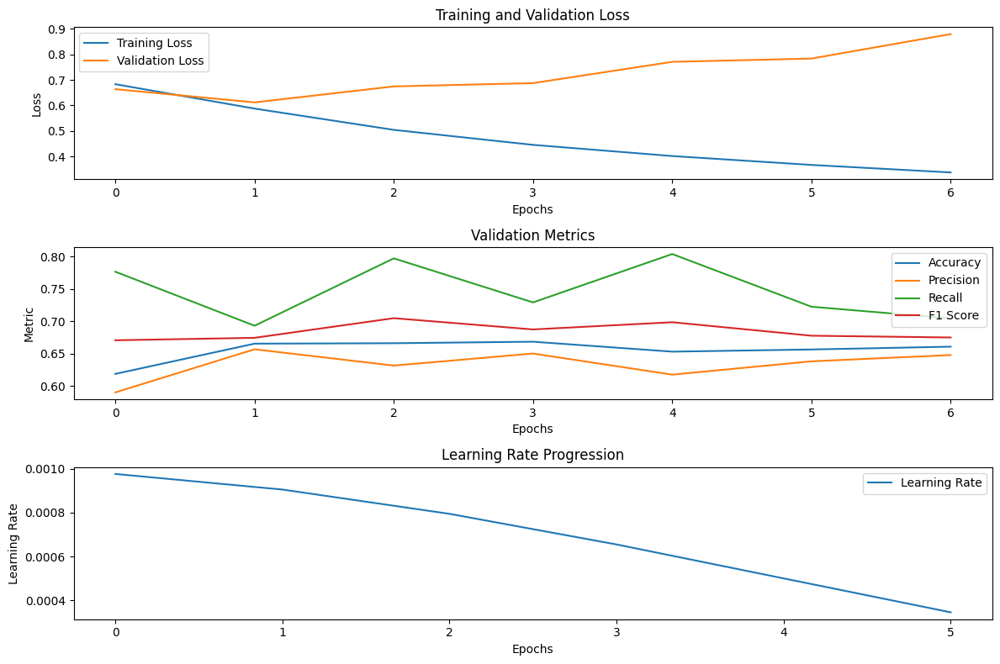

 86%|████████▌ | 103/120 [8:38:21<41:00, 144.71s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.6409 at epoch 1

Epoch 1/100 - Training Loss: 0.6826 - Validation Loss: 0.6409 - Accuracy: 0.6387 - Precision: 0.6130 - Recall: 0.7520 - F1 Score: 0.6754 - Time: 22.07 - Lr: 9.76e-04
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.5904 - Validation Loss: 0.7484 - Accuracy: 0.5883 - Precision: 0.7011 - Recall: 0.3080 - F1 Score: 0.4280 - Time: 22.06 - Lr: 9.05e-04
Valida

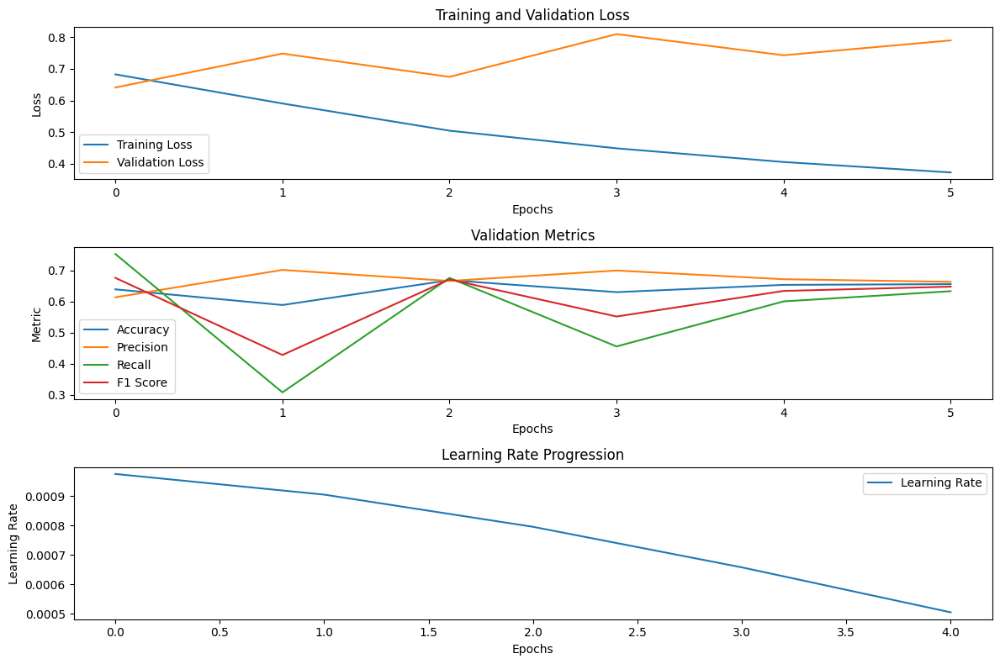

 87%|████████▋ | 104/120 [8:40:34<37:38, 141.15s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6324 at epoch 1

Epoch 1/100 - Training Loss: 0.6838 - Validation Loss: 0.6324 - Accuracy: 0.6483 - Precision: 0.6324 - Recall: 0.7087 - F1 Score: 0.6683 - Time: 22.13 - Lr: 9.78e-04
New best model with Loss: 0.6191 at epoch 2

Epoch 2/100 - Training Loss: 0.5824 - Validation Loss: 0.6191 - Accuracy: 0.6697 - Precision: 0.6570 - Recall: 0.7100 - F1 Score: 0.6825 - Time: 22.04 - Lr: 9.14e-04
Validatio

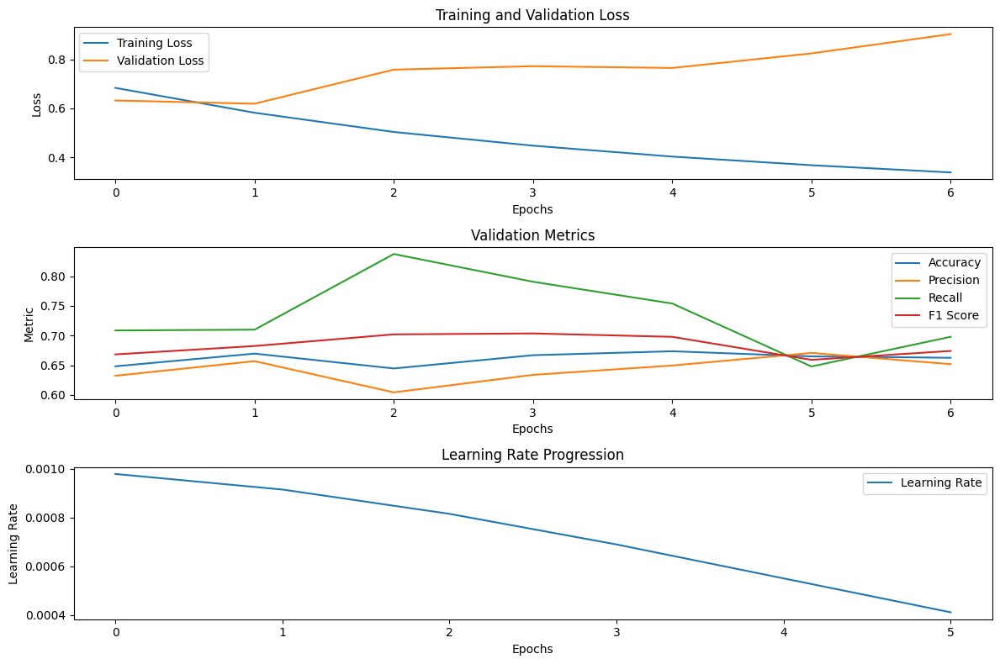

 88%|████████▊ | 105/120 [8:43:09<36:18, 145.23s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.8402 at epoch 1

Epoch 1/100 - Training Loss: 0.6776 - Validation Loss: 0.8402 - Accuracy: 0.5733 - Precision: 0.5438 - Recall: 0.9113 - F1 Score: 0.6811 - Time: 21.97 - Lr: 9.76e-04
New best model with Loss: 0.6487 at epoch 2

Epoch 2/100 - Training Loss: 0.5788 - Validation Loss: 0.6487 - Accuracy: 0.6660 - Precision: 0.6995 - Recall: 0.5820 - F1 Score: 0.6354 - Time: 21.96 - Lr: 9.05e-04
Validation

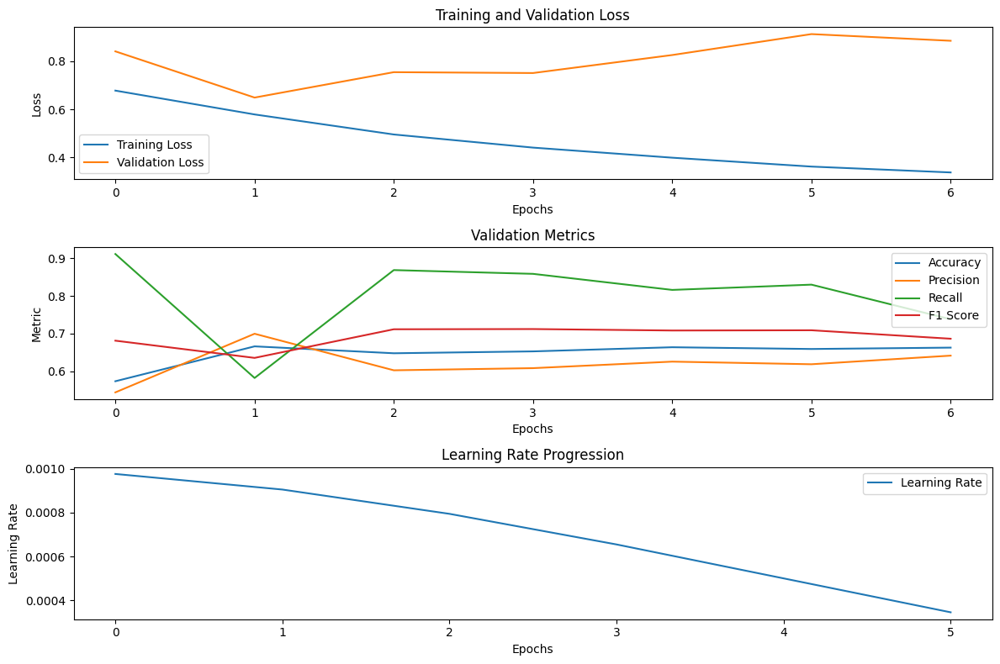

 88%|████████▊ | 106/120 [8:45:43<34:31, 147.94s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.6424 at epoch 1

Epoch 1/100 - Training Loss: 0.6757 - Validation Loss: 0.6424 - Accuracy: 0.6470 - Precision: 0.6395 - Recall: 0.6740 - F1 Score: 0.6563 - Time: 22.09 - Lr: 9.76e-04
New best model with Loss: 0.6327 at epoch 2

Epoch 2/100 - Training Loss: 0.5739 - Validation Loss: 0.6327 - Accuracy: 0.6657 - Precision: 0.6664 - Recall: 0.6633 - F1 Score: 0.6649 - Time: 22.05 - Lr: 9.05e-04
Validation l

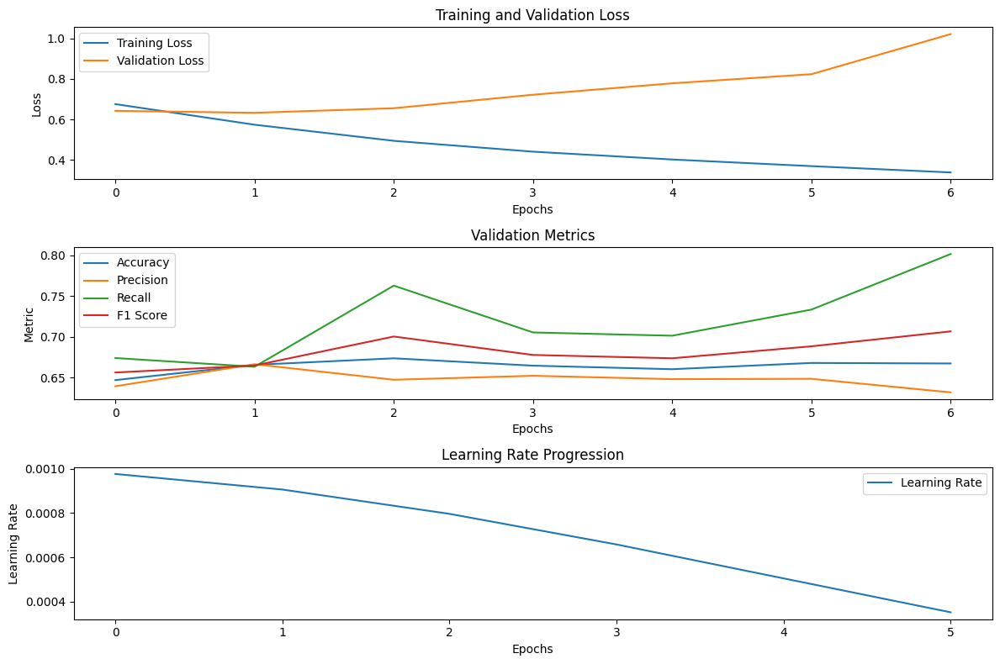

 89%|████████▉ | 107/120 [8:48:18<32:29, 149.97s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6333 at epoch 1

Epoch 1/100 - Training Loss: 0.6838 - Validation Loss: 0.6333 - Accuracy: 0.6570 - Precision: 0.6518 - Recall: 0.6740 - F1 Score: 0.6627 - Time: 22.05 - Lr: 9.78e-04
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.5888 - Validation Loss: 0.6564 - Accuracy: 0.6510 - Precision: 0.6057 - Recall: 0.8653 - F1 Score: 0.7126 - Time: 22.03 - Lr: 9.14e-04
Validat

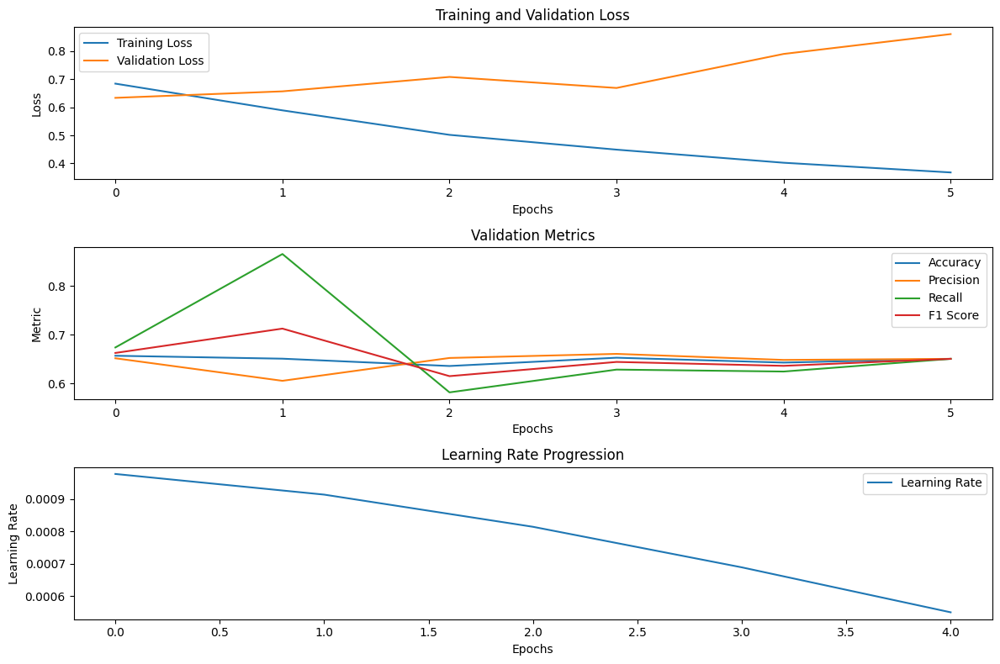

 90%|█████████ | 108/120 [8:50:30<28:55, 144.61s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.001, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.8048 at epoch 1

Epoch 1/100 - Training Loss: 0.6778 - Validation Loss: 0.8048 - Accuracy: 0.6197 - Precision: 0.5873 - Recall: 0.8047 - F1 Score: 0.6790 - Time: 22.02 - Lr: 4.88e-03
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.5879 - Validation Loss: 0.8331 - Accuracy: 0.6430 - Precision: 0.6012 - Recall: 0.8493 - F1 Score: 0.7041 - Time: 22.01 - Lr: 4.52e-03
New bes

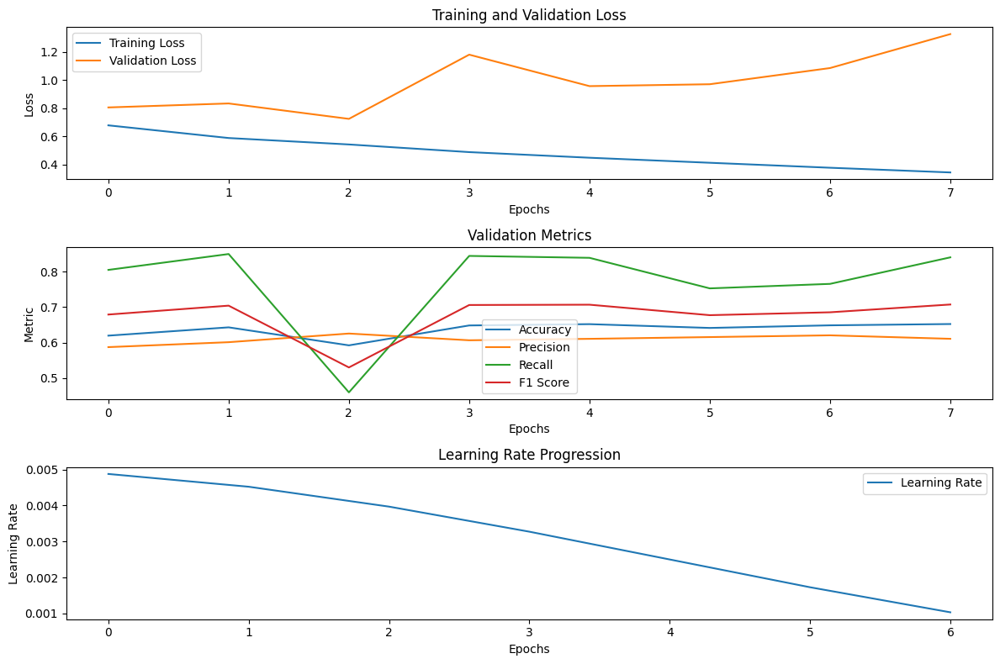

 91%|█████████ | 109/120 [8:53:27<28:17, 154.30s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.6327 at epoch 1

Epoch 1/100 - Training Loss: 0.6777 - Validation Loss: 0.6327 - Accuracy: 0.6457 - Precision: 0.6078 - Recall: 0.8213 - F1 Score: 0.6986 - Time: 22.06 - Lr: 4.88e-03
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.5943 - Validation Loss: 0.6599 - Accuracy: 0.6247 - Precision: 0.5827 - Recall: 0.8780 - F1 Score: 0.7005 - Time: 22.00 - Lr: 4.52e-03
Validati

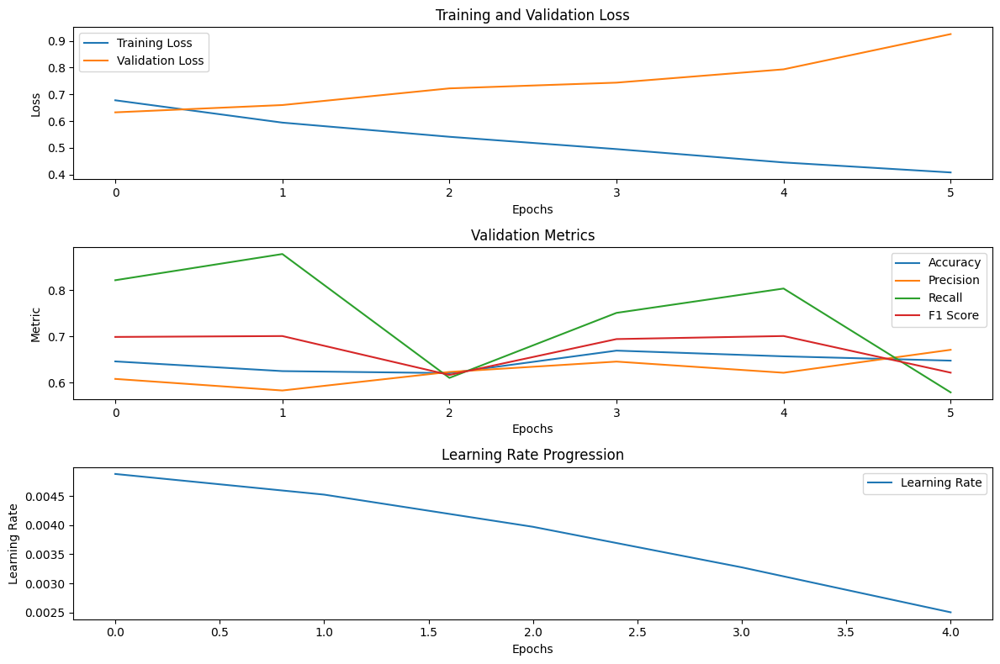

 92%|█████████▏| 110/120 [8:55:40<24:37, 147.76s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.8839 at epoch 1

Epoch 1/100 - Training Loss: 0.6815 - Validation Loss: 0.8839 - Accuracy: 0.5720 - Precision: 0.5411 - Recall: 0.9480 - F1 Score: 0.6890 - Time: 21.94 - Lr: 4.88e-03
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.5946 - Validation Loss: 0.9667 - Accuracy: 0.6137 - Precision: 0.5759 - Recall: 0.8620 - F1 Score: 0.6905 - Time: 21.79 - Lr: 4.53e-03
New bes

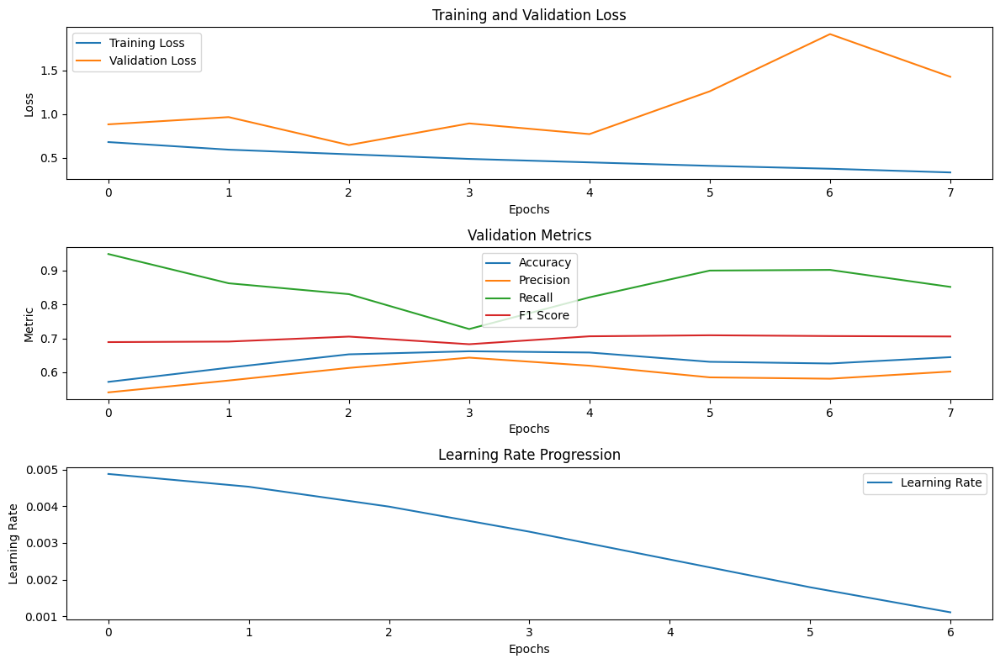

 92%|█████████▎| 111/120 [8:58:36<23:27, 156.40s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 1e-06, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.6460 at epoch 1

Epoch 1/100 - Training Loss: 0.6734 - Validation Loss: 0.6460 - Accuracy: 0.6420 - Precision: 0.6626 - Recall: 0.5787 - F1 Score: 0.6178 - Time: 22.17 - Lr: 4.88e-03
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.5915 - Validation Loss: 0.7524 - Accuracy: 0.6243 - Precision: 0.5804 - Recall: 0.8973 - F1 Score: 0.7049 - Time: 22.05 - Lr: 4.52e-03
Validat

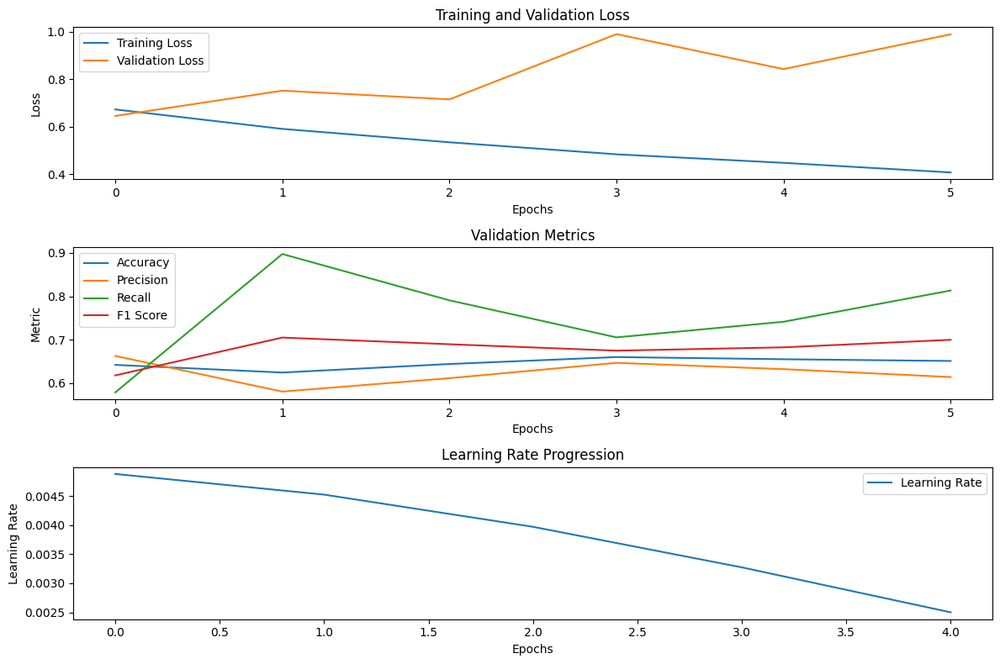

 93%|█████████▎| 112/120 [9:00:49<19:54, 149.30s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.6615 at epoch 1

Epoch 1/100 - Training Loss: 0.6781 - Validation Loss: 0.6615 - Accuracy: 0.6263 - Precision: 0.6392 - Recall: 0.5800 - F1 Score: 0.6082 - Time: 22.08 - Lr: 4.88e-03
New best model with Loss: 0.6493 at epoch 2

Epoch 2/100 - Training Loss: 0.5882 - Validation Loss: 0.6493 - Accuracy: 0.6263 - Precision: 0.6392 - Recall: 0.5800 - F1 Score: 0.6082 - Time: 21.97 - Lr: 4.52e-03
Validation l

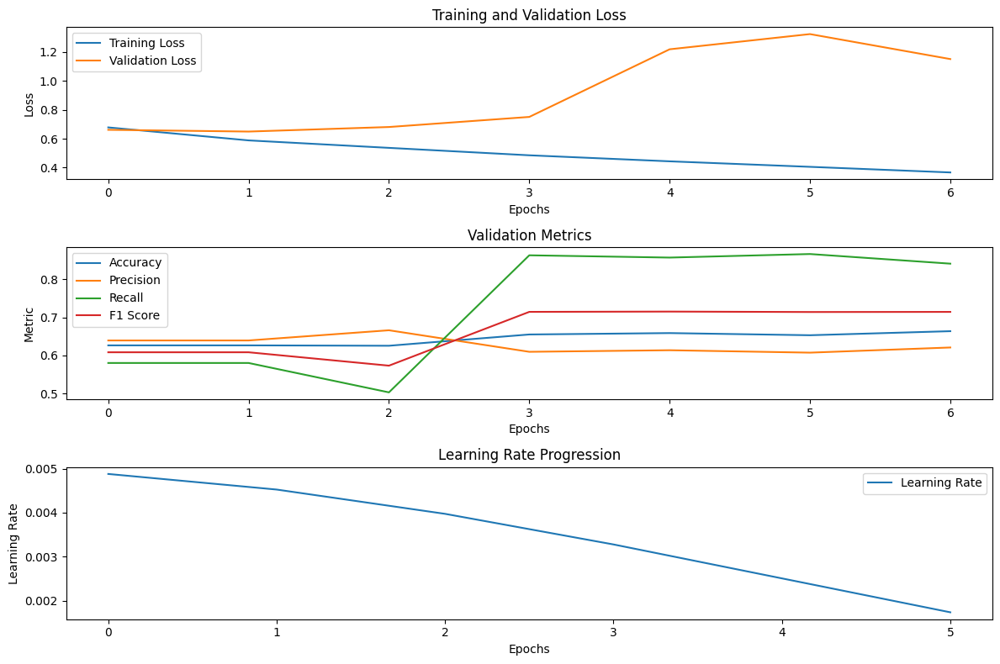

 94%|█████████▍| 113/120 [9:03:23<17:35, 150.79s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 1.0624 at epoch 1

Epoch 1/100 - Training Loss: 0.6783 - Validation Loss: 1.0624 - Accuracy: 0.5843 - Precision: 0.5511 - Recall: 0.9100 - F1 Score: 0.6864 - Time: 22.13 - Lr: 4.88e-03
New best model with Loss: 0.8584 at epoch 2

Epoch 2/100 - Training Loss: 0.5941 - Validation Loss: 0.8584 - Accuracy: 0.6383 - Precision: 0.5954 - Recall: 0.8633 - F1 Score: 0.7048 - Time: 22.12 - Lr: 4.53e-03
Validation 

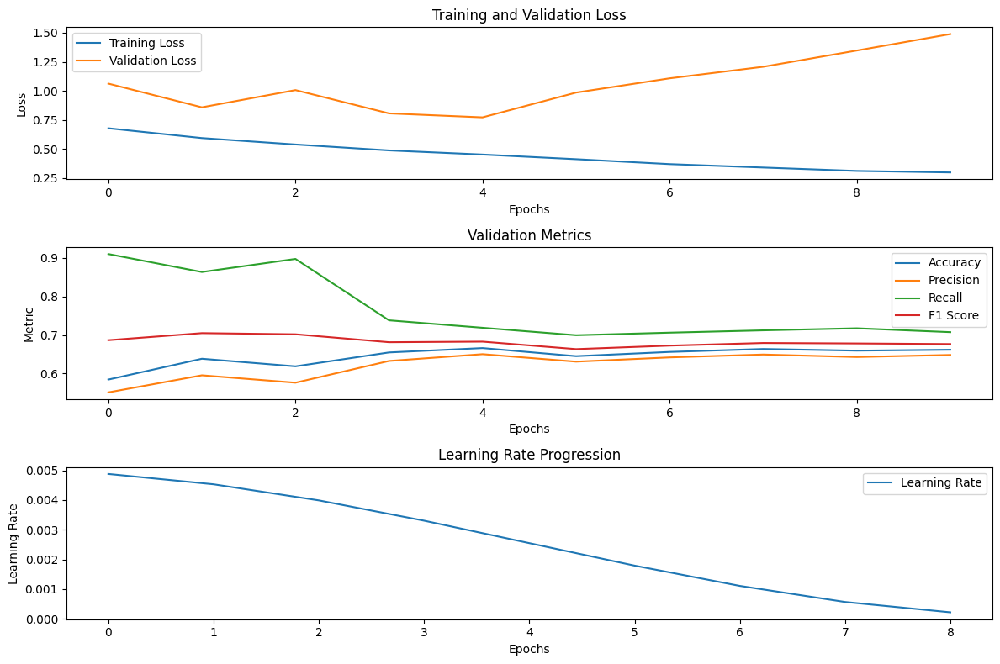

 95%|█████████▌| 114/120 [9:07:04<17:11, 171.85s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 1e-05, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.6956 at epoch 1

Epoch 1/100 - Training Loss: 0.6752 - Validation Loss: 0.6956 - Accuracy: 0.6053 - Precision: 0.6208 - Recall: 0.5413 - F1 Score: 0.5783 - Time: 21.97 - Lr: 4.88e-03
New best model with Loss: 0.6801 at epoch 2

Epoch 2/100 - Training Loss: 0.5852 - Validation Loss: 0.6801 - Accuracy: 0.5993 - Precision: 0.5894 - Recall: 0.6547 - F1 Score: 0.6203 - Time: 21.97 - Lr: 4.52e-03
Validation

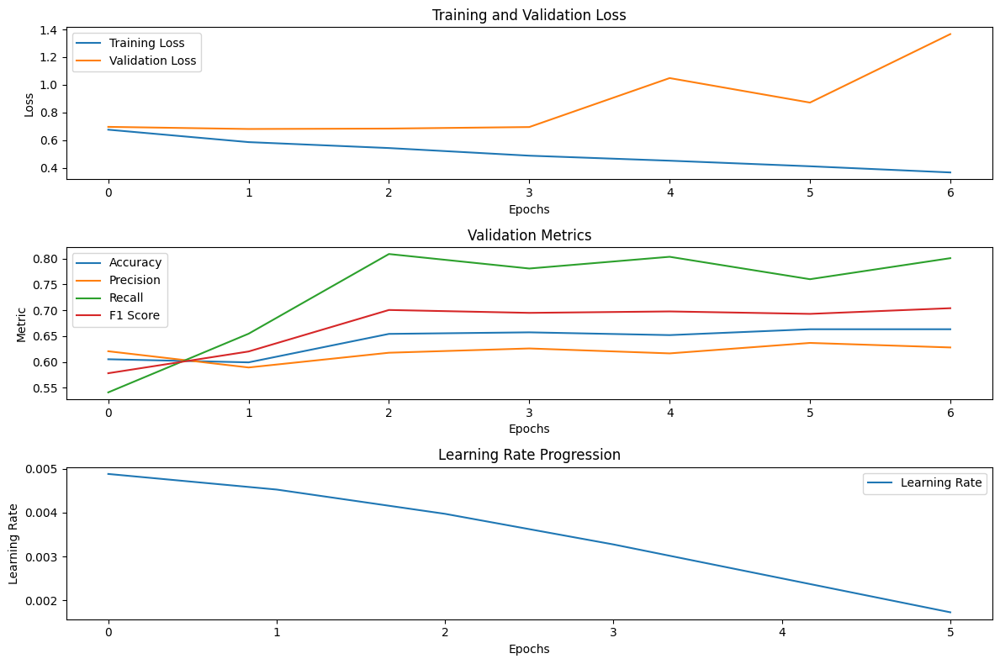

 96%|█████████▌| 115/120 [9:09:39<13:53, 166.62s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.6634 at epoch 1

Epoch 1/100 - Training Loss: 0.6835 - Validation Loss: 0.6634 - Accuracy: 0.6387 - Precision: 0.6123 - Recall: 0.7560 - F1 Score: 0.6766 - Time: 22.16 - Lr: 4.88e-03
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6043 - Validation Loss: 0.7294 - Accuracy: 0.6333 - Precision: 0.5978 - Recall: 0.8147 - F1 Score: 0.6896 - Time: 22.02 - Lr: 4.52e-03
Valida

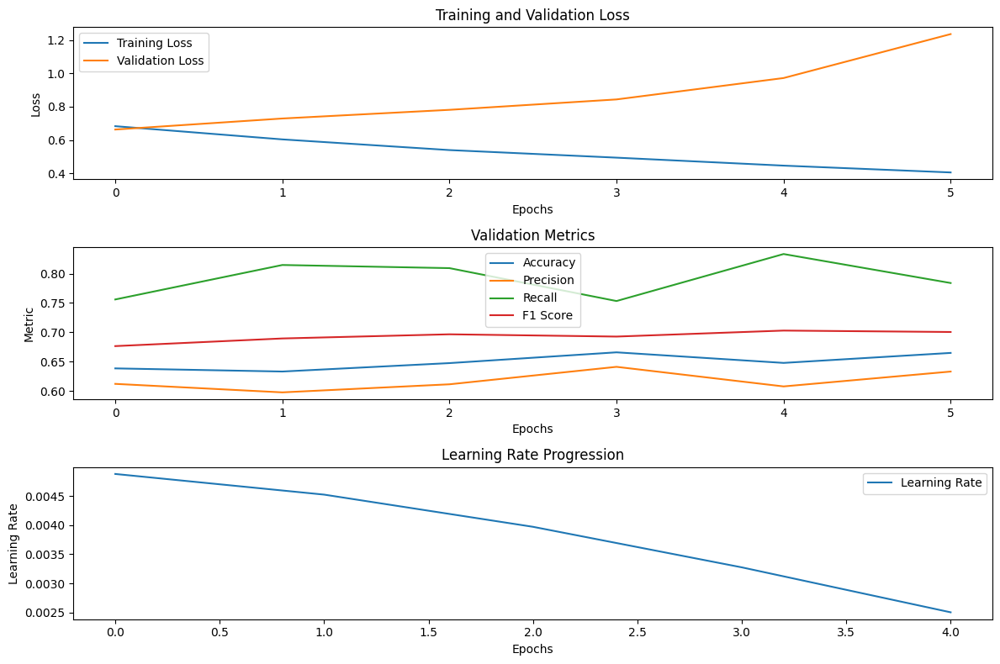

 97%|█████████▋| 116/120 [9:11:51<10:25, 156.45s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.6436 at epoch 1

Epoch 1/100 - Training Loss: 0.6847 - Validation Loss: 0.6436 - Accuracy: 0.6337 - Precision: 0.5998 - Recall: 0.8033 - F1 Score: 0.6868 - Time: 21.97 - Lr: 4.88e-03
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.6046 - Validation Loss: 0.8421 - Accuracy: 0.6390 - Precision: 0.6033 - Recall: 0.8120 - F1 Score: 0.6922 - Time: 22.01 - Lr: 4.53e-03
Valid

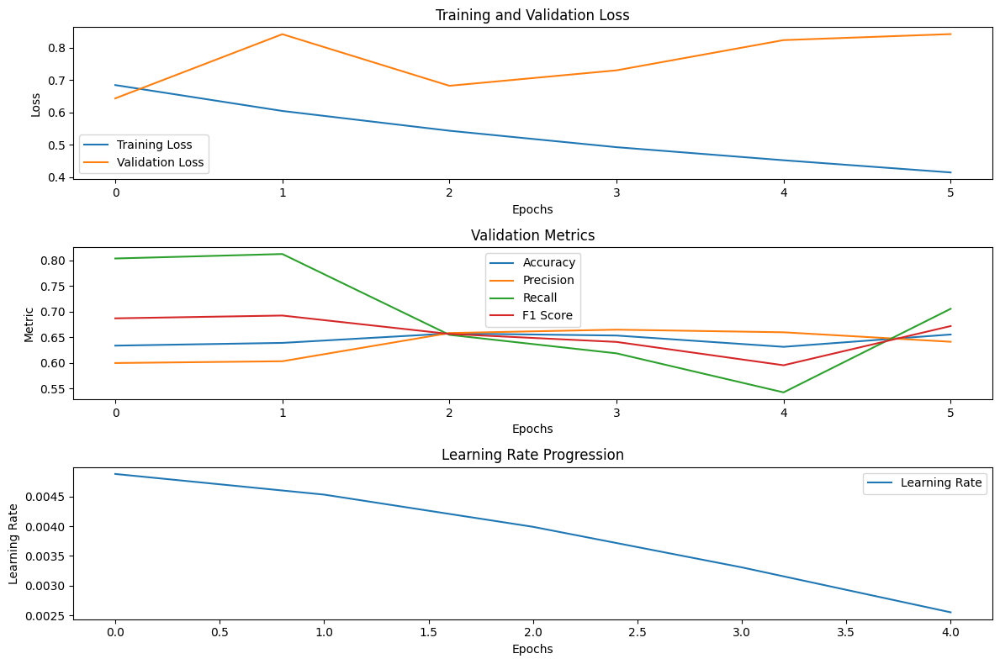

 98%|█████████▊| 117/120 [9:14:04<07:27, 149.19s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 0.0001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
New best model with Loss: 0.7028 at epoch 1

Epoch 1/100 - Training Loss: 0.6795 - Validation Loss: 0.7028 - Accuracy: 0.6433 - Precision: 0.6308 - Recall: 0.6913 - F1 Score: 0.6597 - Time: 21.85 - Lr: 4.88e-03
Validation loss did not improve for 1 epoch(s).

Epoch 2/100 - Training Loss: 0.5973 - Validation Loss: 1.1985 - Accuracy: 0.5673 - Precision: 0.5391 - Recall: 0.9287 - F1 Score: 0.6822 - Time: 22.00 - Lr: 4.52e-03
Valida

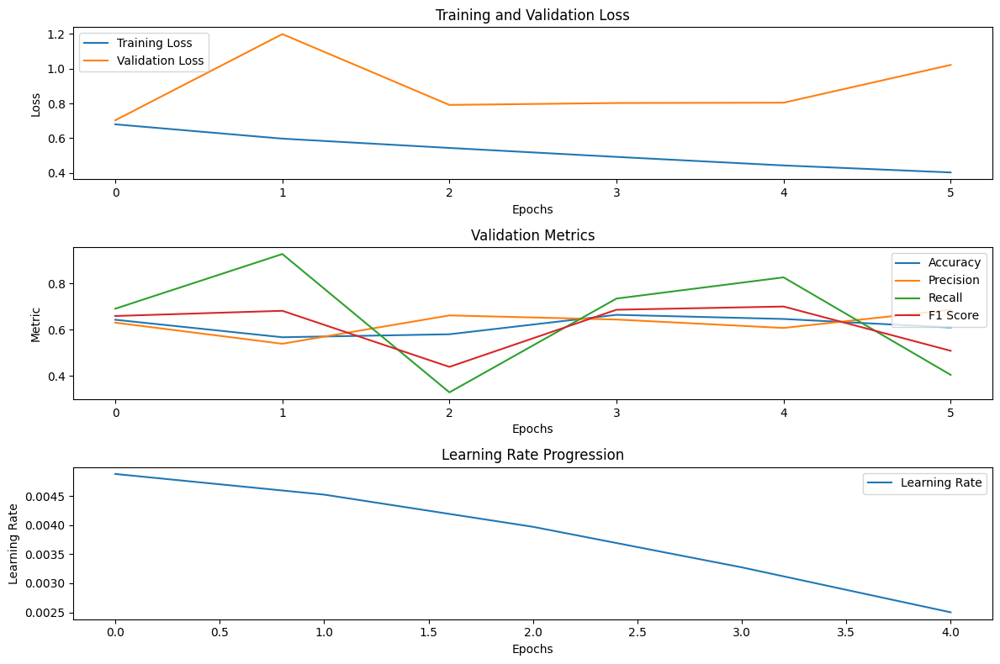

 98%|█████████▊| 118/120 [9:16:16<04:48, 144.15s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-06}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
New best model with Loss: 0.7548 at epoch 1

Epoch 1/100 - Training Loss: 0.6767 - Validation Loss: 0.7548 - Accuracy: 0.6260 - Precision: 0.5900 - Recall: 0.8260 - F1 Score: 0.6883 - Time: 22.11 - Lr: 4.88e-03
New best model with Loss: 0.7235 at epoch 2

Epoch 2/100 - Training Loss: 0.5895 - Validation Loss: 0.7235 - Accuracy: 0.6593 - Precision: 0.6292 - Recall: 0.7760 - F1 Score: 0.6949 - Time: 22.09 - Lr: 4.52e-03
Validation l

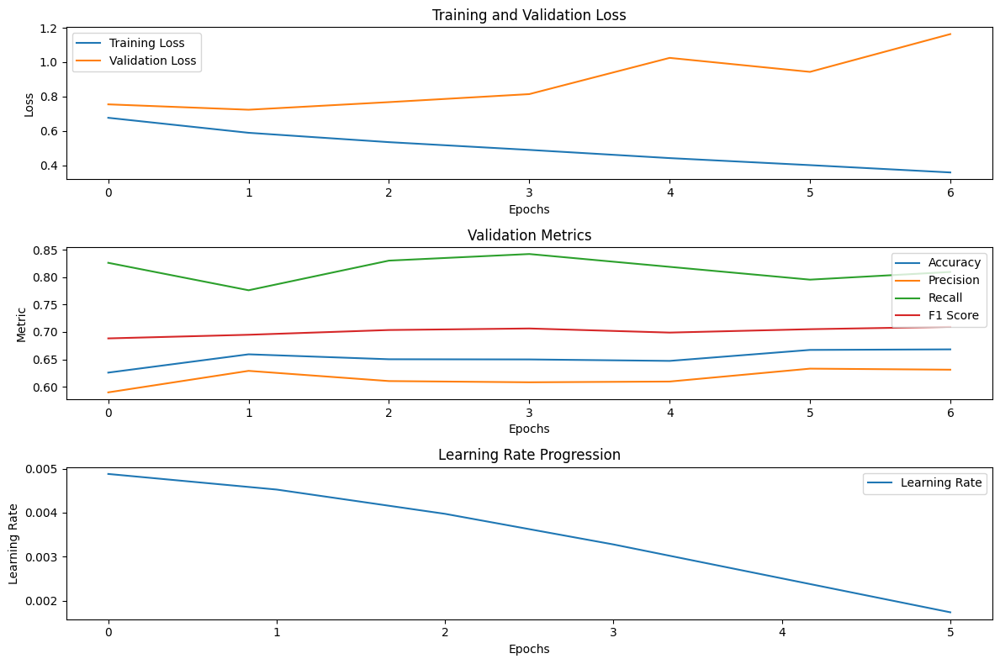

 99%|█████████▉| 119/120 [9:18:51<02:27, 147.37s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 1e-05}
Resetting GPU memory...
Testing configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
New best model with Loss: 0.7656 at epoch 1

Epoch 1/100 - Training Loss: 0.6780 - Validation Loss: 0.7656 - Accuracy: 0.6347 - Precision: 0.5982 - Recall: 0.8207 - F1 Score: 0.6920 - Time: 22.05 - Lr: 4.88e-03
New best model with Loss: 0.6400 at epoch 2

Epoch 2/100 - Training Loss: 0.5950 - Validation Loss: 0.6400 - Accuracy: 0.6490 - Precision: 0.6403 - Recall: 0.6800 - F1 Score: 0.6596 - Time: 22.00 - Lr: 4.53e-03
Validation 

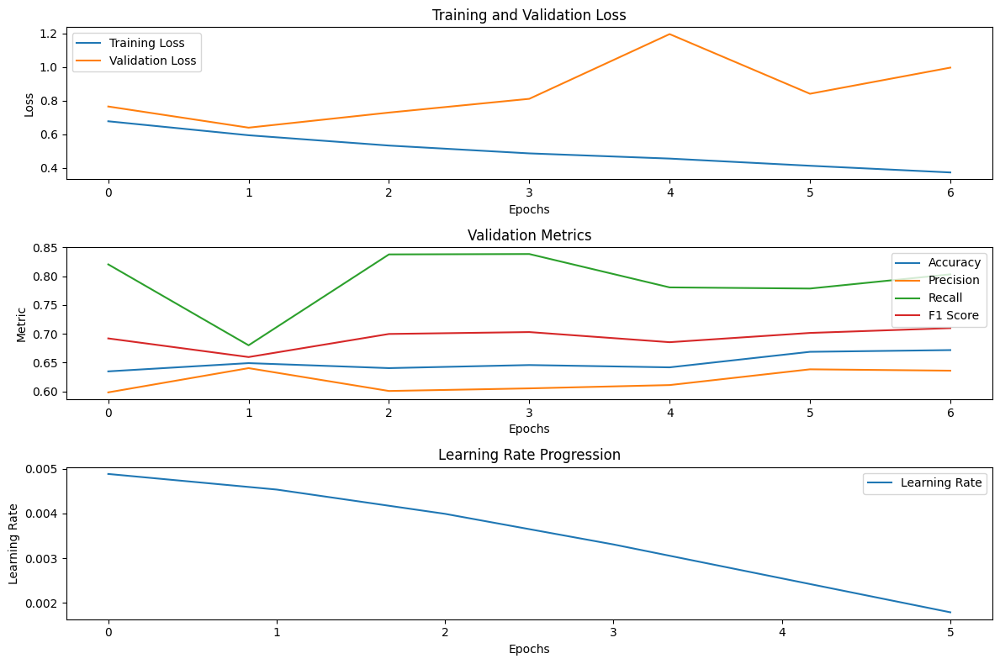

100%|██████████| 120/120 [9:21:25<00:00, 280.71s/it]

Completed configuration: {'embedding_dim': 128, 'num_filters': 16, 'filter_sizes': [3, 4, 5, 6, 7, 8, 9], 'transformer_dropout_value': 0.5, 'cnn_text_drop_value': 0.5, 'cnn_dropout_value': 0.5, 'lr': 0.005, 'weight_decay': 0.001, 'T_0': 10, 'T_mult': 1, 'eta_min': 0.0001}
Resetting GPU memory...


In [26]:
results = hyperparameter_tuning(
    vocab_size=len(vocab),
    max_len=max_len,
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    param_grid=param_grid,
    training_method=training_method,
    num_epochs=100
)

In [27]:
dir_models = os.listdir("./models")

In [28]:
best_models = [path[:-3] for path in dir_models if path.endswith(".pt")]

In [29]:
best_val_loss = [float(str(best_model.split("+")[-1:]).split("=")[1][:8]) for best_model in best_models]

In [30]:
best_val_loss.sort()
best_val_loss[:100]

[0.612096,
 0.614324,
 0.615008,
 0.615029,
 0.616197,
 0.617552,
 0.617692,
 0.619103,
 0.619733,
 0.619854,
 0.62002,
 0.620083,
 0.620193,
 0.620506,
 0.620998,
 0.621254,
 0.621349,
 0.621637,
 0.621675,
 0.621773,
 0.622333,
 0.622469,
 0.62264,
 0.623066,
 0.623712,
 0.624001,
 0.624121,
 0.624226,
 0.624227,
 0.624542,
 0.625067,
 0.625414,
 0.625581,
 0.626052,
 0.626335,
 0.626686,
 0.626754,
 0.62707,
 0.627351,
 0.627542,
 0.627744,
 0.627757,
 0.628698,
 0.629834,
 0.630487,
 0.630664,
 0.631136,
 0.631395,
 0.632056,
 0.63269,
 0.632702,
 0.632718,
 0.63325,
 0.633297,
 0.633412,
 0.633463,
 0.633871,
 0.634962,
 0.636518,
 0.636834,
 0.63698,
 0.639959,
 0.640009,
 0.640178,
 0.640358,
 0.640939,
 0.641185,
 0.642509,
 0.642611,
 0.642869,
 0.643597,
 0.643832,
 0.644782,
 0.64588,
 0.64595,
 0.647067,
 0.647437,
 0.647742,
 0.64869,
 0.64933,
 0.650812,
 0.651531,
 0.651885,
 0.652453,
 0.652675,
 0.653037,
 0.65339,
 0.654332,
 0.655366,
 0.656675,
 0.65697,
 0.657016,
